In [1]:
import torch
import torch.nn as nn
import time
import argparse

import os
import datetime

from torch.distributions.categorical import Categorical

# visualization 
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

device = torch.device("cpu"); gpu_id = -1 # select CPU

gpu_id = '0' # select a single GPU  
#gpu_id = '2,3' # select multiple GPUs  
os.environ["CUDA_VISIBLE_DEVICES"] = str(gpu_id)  
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('GPU name: {:s}, gpu_id: {:s}'.format(torch.cuda.get_device_name(0),gpu_id))   
    
print(device)
print('pytorch version = ',torch.__version__)

GPU name: NVIDIA GeForce RTX 2080 Ti, gpu_id: 0
cuda
pytorch version =  1.10.0


In [2]:
import math
import numpy as np
import torch.nn.functional as F
import random
import torch.optim as optim
from torch.autograd import Variable
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
class TransEncoderNet(nn.Module):
    """
    Encoder network based on self-attention transformer
    Inputs :  
      h of size      (bsz, nb_nodes, dim_emb)    batch of input cities
    Outputs :  
      h of size      (bsz, nb_nodes, dim_emb)    batch of encoded cities
      score of size  (bsz, nb_nodes, nb_nodes+1) batch of attention scores
    """
    
    def __init__(self, nb_layers, dim_emb, nb_heads, dim_ff, batchnorm):
        super(TransEncoderNet, self).__init__()
        assert dim_emb == nb_heads* (dim_emb//nb_heads) # check if dim_emb is divisible by nb_heads
        self.MHA_layers = nn.ModuleList( [nn.MultiheadAttention(dim_emb, nb_heads) for _ in range(nb_layers)] )
        self.linear1_layers = nn.ModuleList( [nn.Linear(dim_emb, dim_ff) for _ in range(nb_layers)] )
        self.linear2_layers = nn.ModuleList( [nn.Linear(dim_ff, dim_emb) for _ in range(nb_layers)] )   
        if batchnorm:
            self.norm1_layers = nn.ModuleList( [nn.BatchNorm1d(dim_emb) for _ in range(nb_layers)] )
            self.norm2_layers = nn.ModuleList( [nn.BatchNorm1d(dim_emb) for _ in range(nb_layers)] )
        else:
            self.norm1_layers = nn.ModuleList( [nn.LayerNorm(dim_emb) for _ in range(nb_layers)] )
            self.norm2_layers = nn.ModuleList( [nn.LayerNorm(dim_emb) for _ in range(nb_layers)] )
        self.nb_layers = nb_layers
        self.nb_heads = nb_heads
        self.batchnorm = batchnorm
        
    def forward(self, h):      
        # PyTorch nn.MultiheadAttention requires input size (seq_len, bsz, dim_emb) 
        h = h.transpose(0,1) # size(h)=(nb_nodes, bsz, dim_emb)  
        # L layers
        for i in range(self.nb_layers):
            h_rc = h # residual connection, size(h_rc)=(nb_nodes, bsz, dim_emb)
            h, score = self.MHA_layers[i](h, h, h) # size(h)=(nb_nodes, bsz, dim_emb), size(score)=(bsz, nb_nodes, nb_nodes)
            # add residual connection
            
            h = h_rc + h # size(h)=(nb_nodes, bsz, dim_emb)
            if self.batchnorm:
                # Pytorch nn.BatchNorm1d requires input size (bsz, dim, seq_len)
                h = h.permute(1,2,0).contiguous() # size(h)=(bsz, dim_emb, nb_nodes)
                h = self.norm1_layers[i](h)       # size(h)=(bsz, dim_emb, nb_nodes)
                h = h.permute(2,0,1).contiguous() # size(h)=(nb_nodes, bsz, dim_emb)
            else:
                h = self.norm1_layers[i](h)       # size(h)=(nb_nodes, bsz, dim_emb) 
            # feedforward
            h_rc = h # residual connection
            h = self.linear2_layers[i](torch.relu(self.linear1_layers[i](h)))
            h = h_rc + h # size(h)=(nb_nodes, bsz, dim_emb)
            if self.batchnorm:
                h = h.permute(1,2,0).contiguous() # size(h)=(bsz, dim_emb, nb_nodes)
                h = self.norm2_layers[i](h)       # size(h)=(bsz, dim_emb, nb_nodes)
                h = h.permute(2,0,1).contiguous() # size(h)=(nb_nodes, bsz, dim_emb)
            else:
                h = self.norm2_layers[i](h) # size(h)=(nb_nodes, bsz, dim_emb)
        # Transpose h
        h = h.transpose(0,1) # size(h)=(bsz, nb_nodes, dim_emb)
        return h, score
    

class Attention(nn.Module):
    def __init__(self, n_hidden):
        super(Attention, self).__init__()
        self.size = 0
        self.batch_size = 0
        self.dim = n_hidden
        
        v  = torch.FloatTensor(n_hidden)
        self.v  = nn.Parameter(v)
        self.v.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        
        # parameters for pointer attention
        self.Wref = nn.Linear(n_hidden, n_hidden)
        self.Wq = nn.Linear(n_hidden, n_hidden)
    
    
    def forward(self, q, ref):       # query and reference
        self.batch_size = q.size(0)
        self.size = int(ref.size(0) / self.batch_size)
        q = self.Wq(q)     # (B, dim)
        ref = self.Wref(ref)
        ref = ref.view(self.batch_size, self.size, self.dim)  # (B, size, dim)
        
        q_ex = q.unsqueeze(1).repeat(1, self.size, 1) # (B, size, dim)
        # v_view: (B, dim, 1)
        v_view = self.v.unsqueeze(0).expand(self.batch_size, self.dim).unsqueeze(2)
        
        # (B, size, dim) * (B, dim, 1)
        u = torch.bmm(torch.tanh(q_ex + ref), v_view).squeeze(2)
        
        return u, ref
    
class LSTM(nn.Module):
    def __init__(self, n_hidden):
        super(LSTM, self).__init__()
        
        # parameters for input gate
        self.Wxi = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whi = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wci = nn.Linear(n_hidden, n_hidden)    # w(ct)
        
        # parameters for forget gate
        self.Wxf = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whf = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wcf = nn.Linear(n_hidden, n_hidden)    # w(ct)
        
        # parameters for cell gate
        self.Wxc = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whc = nn.Linear(n_hidden, n_hidden)    # W(ht)
        
        # parameters for forget gate
        self.Wxo = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Who = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wco = nn.Linear(n_hidden, n_hidden)    # w(ct)
    
    
    def forward(self, x, h, c):       # query and reference
        
        # input gate
        i = torch.sigmoid(self.Wxi(x) + self.Whi(h) + self.wci(c))
        # forget gate
        f = torch.sigmoid(self.Wxf(x) + self.Whf(h) + self.wcf(c))
        # cell gate
        c = f * c + i * torch.tanh(self.Wxc(x) + self.Whc(h))
        # output gate
        o = torch.sigmoid(self.Wxo(x) + self.Who(h) + self.wco(c))
        
        h = o * torch.tanh(c)
        
        return h, c

class HPN(nn.Module):
    def __init__(self, n_feature, n_hidden):

        super(HPN, self).__init__()
        self.city_size = 0
        self.batch_size = 0
        self.dim = n_hidden
        
        # lstm for first turn
        #self.lstm0 = nn.LSTM(n_hidden, n_hidden)main_training - Jupyter Notebook
        
        # pointer layer
        self.TransPointer = Attention(n_hidden)
        
        # lstm encoder
        self.encoder = LSTM(n_hidden)
        
        # trainable first hidden input
        h0 = torch.FloatTensor(n_hidden)
        c0 = torch.FloatTensor(n_hidden)
        # trainable latent variable coefficient
        print('here') 
        alpha = torch.ones(1)
        self.h0 = nn.Parameter(h0)
        self.c0 = nn.Parameter(c0)
        
        self.alpha = nn.Parameter(alpha)
        self.h0.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        self.c0.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        
        # embedding
        self.embedding_x = nn.Linear(n_feature, n_hidden)
        self.embedding_all = nn.Linear(n_feature, n_hidden)
        self.Transembedding_all = TransEncoderNet(6, 128, 8, 512, batchnorm=True)#6,128,8,512
        
        # vector to start decoding 
        self.start_placeholder = nn.Parameter(torch.randn(n_hidden))
    
    
    def forward(self,context,Transcontext, x, X_all, mask, h=None, c=None, latent=None):
        '''
        Inputs (B: batch size, size: city size, dim: hidden dimension)
        
        x: current city coordinate (B, 2)
        X_all: all cities' cooridnates (B, size, 2)
        mask: mask visited cities
        h: hidden variable (B, dim)
        c: cell gate (B, dim)
        latent: latent pointer vector from previous layer (B, size, dim)
        
        Outputs
        
        softmax: probability distribution of next city (B, size)
        h: hidden variable (B, dim)
        c: cell gate (B, dim)
        latent_u: latent pointer vector for next layer
        '''
        
        self.batch_size = X_all.size(0)
        self.city_size = X_all.size(1)
        # Check if this the first iteration loop
        if h is None or c is None:
            x          = self.start_placeholder  
            context = self.embedding_all(X_all)
            Transcontext,_ = self.Transembedding_all(context)
            
            # =============================
            # graph neural network encoder
            # =============================

            # (B, size, dim)
            Transcontext = Transcontext.reshape(-1, self.dim)

            h0 = self.h0.unsqueeze(0).expand(self.batch_size, self.dim)
            c0 = self.c0.unsqueeze(0).expand(self.batch_size, self.dim)

            h0 = h0.unsqueeze(0).contiguous()
            c0 = c0.unsqueeze(0).contiguous()
            
            # let h0, c0 be the hidden variable of first turn
            h = h0.squeeze(0)
            c = c0.squeeze(0)
        else:
            x          = self.embedding_x(x)
        # LSTM encoder1900/2500
        h, c = self.encoder(x, h, c)
        # query vector
        q = h
        # pointer
        u2 ,_ = self.TransPointer(q, Transcontext)
        # Avg Agg between the two attention vector
        u = u2
        latent_u = u.clone()
                
        u = 10 * torch.tanh(u)
        u = u + mask
        return context, Transcontext,F.softmax(u, dim=1), h, c, latent_u
# params= list(HPN(n_feature = 2, n_hidden = 128).parameters())
# print(len(params))
# for name,parameters in HPN(n_feature = 2, n_hidden = 128).named_parameters():
#     print(name,':',parameters.size())

In [3]:
#test network 
Actor = HPN(n_feature = 2, n_hidden = 128)
print(Actor)
nb_param = 0
for param in Actor.parameters():
    nb_param += np.prod(list(param.data.size()))
print('Number of parameters:', nb_param)

here
HPN(
  (TransPointer): Attention(
    (Wref): Linear(in_features=128, out_features=128, bias=True)
    (Wq): Linear(in_features=128, out_features=128, bias=True)
  )
  (encoder): LSTM(
    (Wxi): Linear(in_features=128, out_features=128, bias=True)
    (Whi): Linear(in_features=128, out_features=128, bias=True)
    (wci): Linear(in_features=128, out_features=128, bias=True)
    (Wxf): Linear(in_features=128, out_features=128, bias=True)
    (Whf): Linear(in_features=128, out_features=128, bias=True)
    (wcf): Linear(in_features=128, out_features=128, bias=True)
    (Wxc): Linear(in_features=128, out_features=128, bias=True)
    (Whc): Linear(in_features=128, out_features=128, bias=True)
    (Wxo): Linear(in_features=128, out_features=128, bias=True)
    (Who): Linear(in_features=128, out_features=128, bias=True)
    (wco): Linear(in_features=128, out_features=128, bias=True)
  )
  (embedding_x): Linear(in_features=2, out_features=128, bias=True)
  (embedding_all): Linear(in_featu

# daniel rectangle feature handle

In [4]:
'''
This part I designed the rectangle-characterized TSP, that means for every step the agent walk through a corner,
then he travel through the whole rectangle using zig-zag, finally he ends up at one of the rest corners of 
the rextangle, so, it equals the agent walk through three points at one step, in practice, I add three points into 
mask to make them unselectable.
'''
def rectangle_process(temp,idx,Y,Y0,mask,k,B,i,path_gazebo, visit_count, if_actor):
    Y1 = Y[zero_to_bsz, idx.data].clone()
    rectangle_inf = idx/4
    feature_table = temp.outcorner_getout(rectangle_inf,B)
    feature_table = torch.Tensor(feature_table).type(torch.long)
    if torch.cuda.is_available():
        feature_table = feature_table.cuda()
    Y_corner = Y[zero_to_bsz, feature_table[:,0].data].clone()
    if (i % 100 == 0)and(if_actor):
        path_gazebo.append([idx.data[0].tolist(),feature_table[:,0].data[0].tolist()])
    if k ==0:
        if torch.cuda.is_available():
            reward = torch.zeros(B).cuda()
        else:
            reward = torch.zeros(B)
    if k > 0:
        reward = torch.sum((Y1[:,(0,1)] - Y0[:,(0,1)])**2 , dim=1 )**0.5
        reward += torch.sum((Y_corner[:,(0,1)] - Y1[:,(0,1)])**2 , dim=1 )**0.5
        #dis = (Y1 - Y0)**2
        #dis_1 = (Y_corner - Y1)**2
        #reward = torch.maximum(dis[:,0],dis[:,1])**0.5
        #reward += torch.maximum(dis_1[:,0],dis_1[:,1])**0.5  
    visit_count[zero_to_bsz, idx.data] -= 1
    visit_count[zero_to_bsz, feature_table[:,0].data] -= 1
    visit_count[zero_to_bsz, feature_table[:,1].data] -= 1
    visit_count[zero_to_bsz, feature_table[:,2].data] -= 1
    if_revisited = visit_count[zero_to_bsz, idx.data]<=0
    if_revisited = -np.inf*if_revisited
    if_revisited[if_revisited!=if_revisited] = 0
    mask[zero_to_bsz, idx.data] += if_revisited
    mask[zero_to_bsz, feature_table[:,0].data] += if_revisited
    mask[zero_to_bsz, feature_table[:,1].data ] += if_revisited  
    mask[zero_to_bsz, feature_table[:,2].data ] += if_revisited
    
    
    
    return reward, Y_corner, Y_corner

prepare to train
Hyper parameters:
learning rate 0.0001
batch size 128
steps 2500
epoch 100
here
here
[0, 1, 3, 4, 7, 10, 13, 16, 17, 18, 21, 23, 25, 28, 31, 32, 33, 35, 37, 40, 42, 45, 47, 49, 52, 55]
55
epoch:0, batch:100/2500, reward:8782.501953125


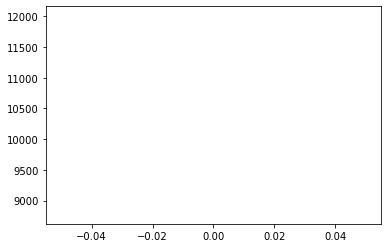

record the last path to gazebo for showing up


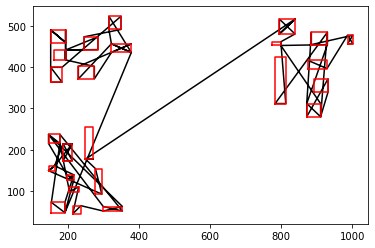

epoch:0, batch:200/2500, reward:8219.193359375


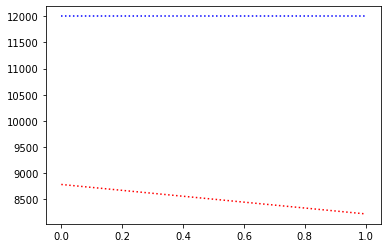

record the last path to gazebo for showing up


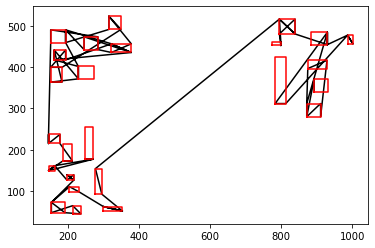

epoch:0, batch:300/2500, reward:8388.09765625


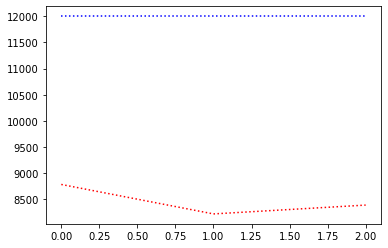

record the last path to gazebo for showing up


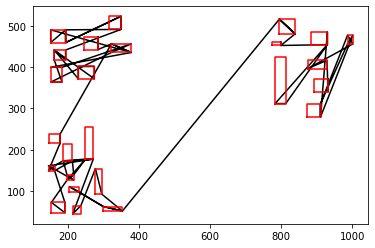

epoch:0, batch:400/2500, reward:8325.453125


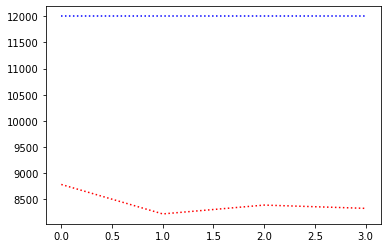

record the last path to gazebo for showing up


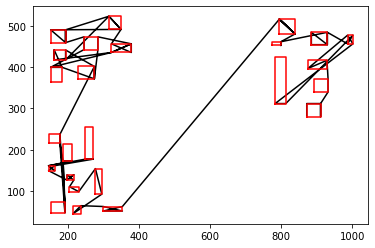

epoch:0, batch:500/2500, reward:8306.2421875


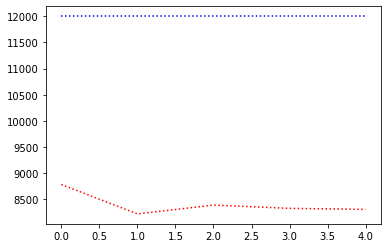

record the last path to gazebo for showing up


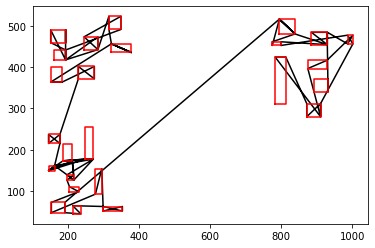

epoch:0, batch:600/2500, reward:8308.5185546875


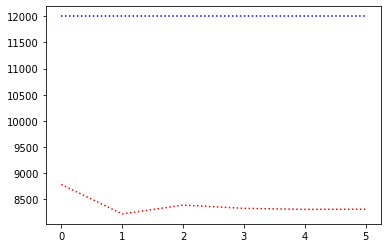

record the last path to gazebo for showing up


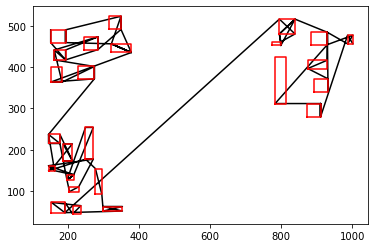

epoch:0, batch:700/2500, reward:7913.48828125


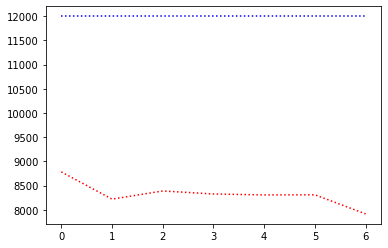

record the last path to gazebo for showing up


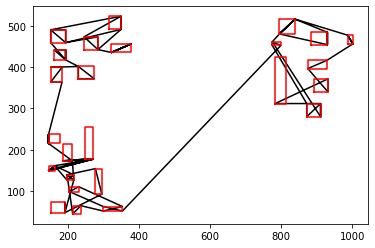

epoch:0, batch:800/2500, reward:8100.3212890625


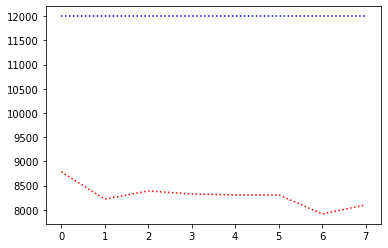

record the last path to gazebo for showing up


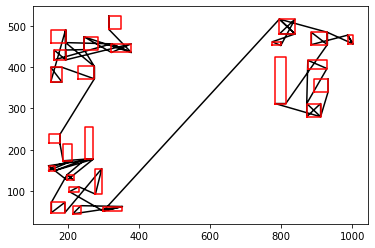

epoch:0, batch:900/2500, reward:7694.6689453125


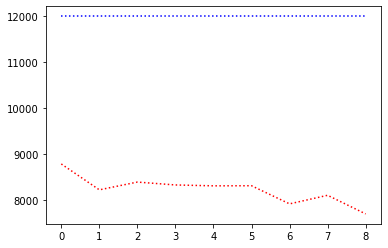

record the last path to gazebo for showing up


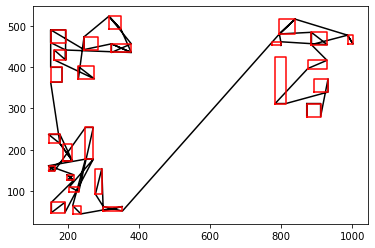

epoch:0, batch:1000/2500, reward:7663.60400390625


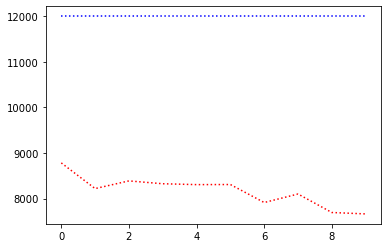

record the last path to gazebo for showing up


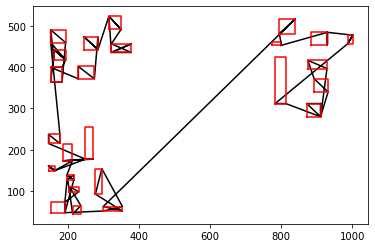

epoch:0, batch:1100/2500, reward:7785.63330078125


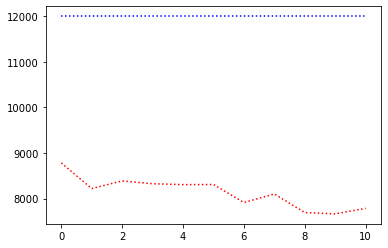

record the last path to gazebo for showing up


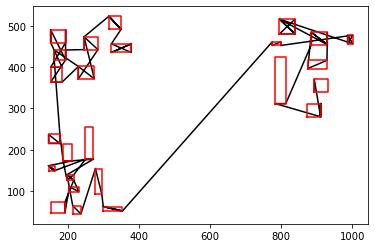

epoch:0, batch:1200/2500, reward:7872.8125


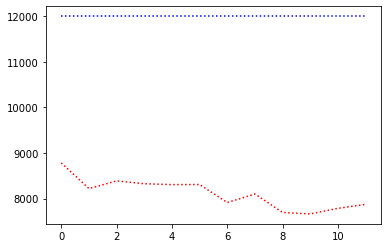

record the last path to gazebo for showing up


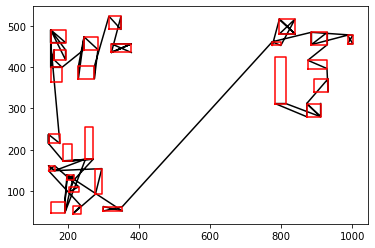

epoch:0, batch:1300/2500, reward:7849.45703125


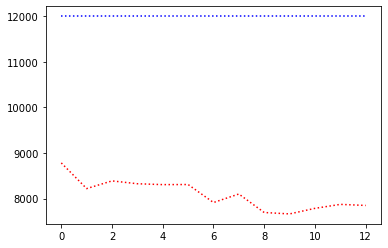

record the last path to gazebo for showing up


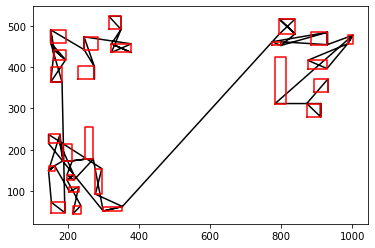

epoch:0, batch:1400/2500, reward:7784.97412109375


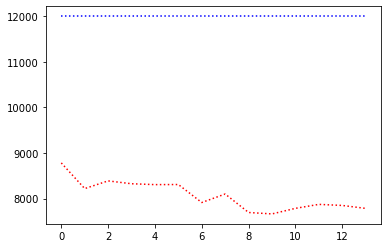

record the last path to gazebo for showing up


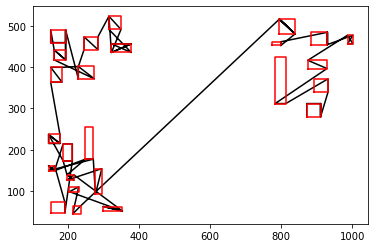

epoch:0, batch:1500/2500, reward:7902.337890625


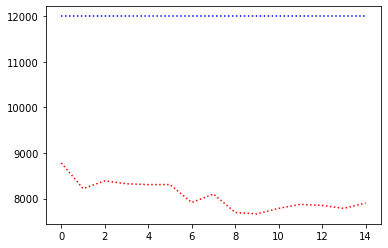

record the last path to gazebo for showing up


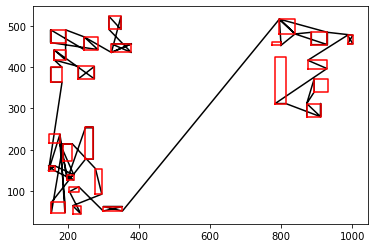

epoch:0, batch:1600/2500, reward:7664.1513671875


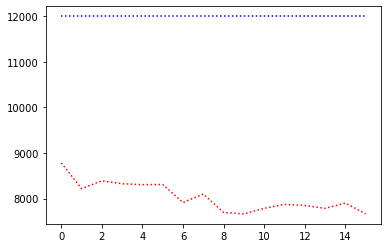

record the last path to gazebo for showing up


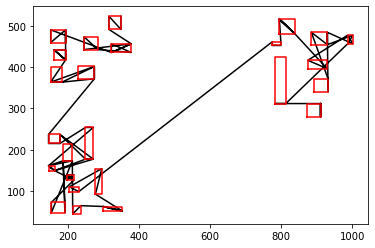

epoch:0, batch:1700/2500, reward:8038.8818359375


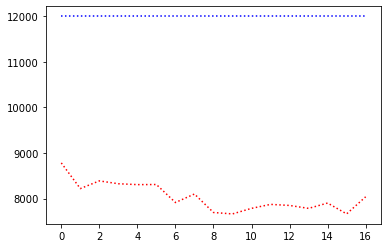

record the last path to gazebo for showing up


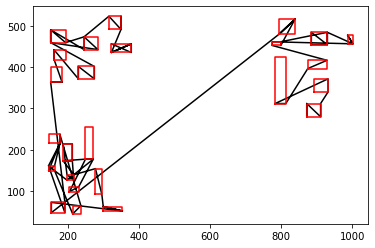

epoch:0, batch:1800/2500, reward:7738.86865234375


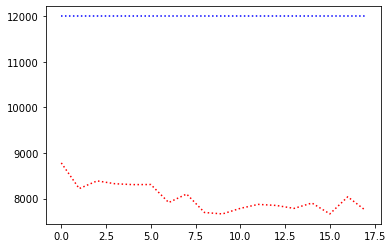

record the last path to gazebo for showing up


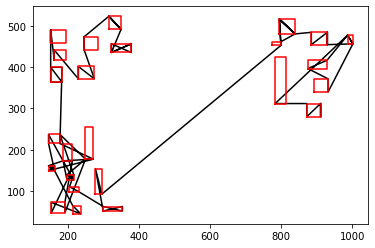

epoch:0, batch:1900/2500, reward:7536.0576171875


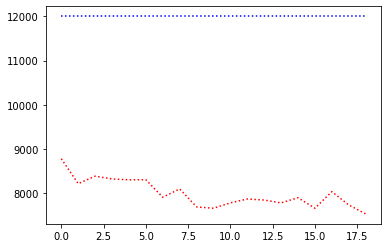

record the last path to gazebo for showing up


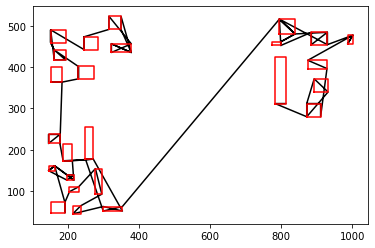

epoch:0, batch:2000/2500, reward:7583.2373046875


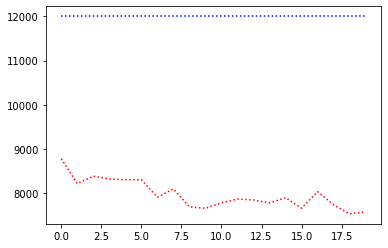

record the last path to gazebo for showing up


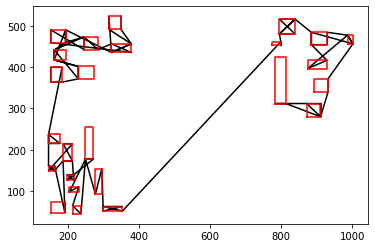

epoch:0, batch:2100/2500, reward:7533.767578125


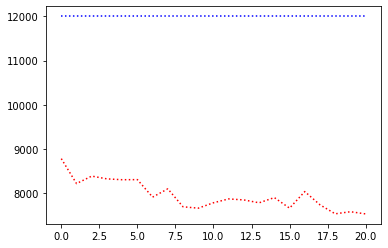

record the last path to gazebo for showing up


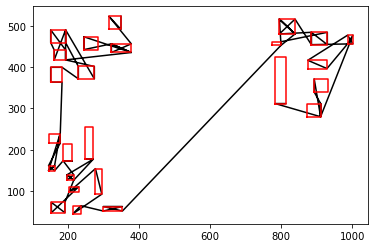

epoch:0, batch:2200/2500, reward:7617.7294921875


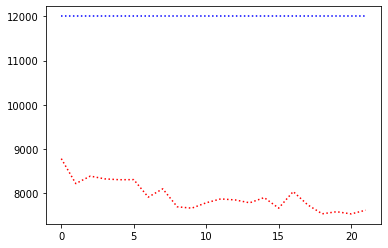

record the last path to gazebo for showing up


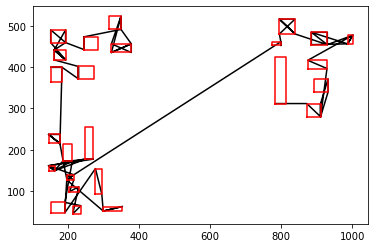

epoch:0, batch:2300/2500, reward:7588.66015625


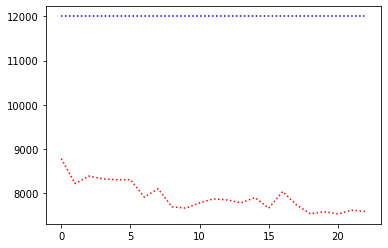

record the last path to gazebo for showing up


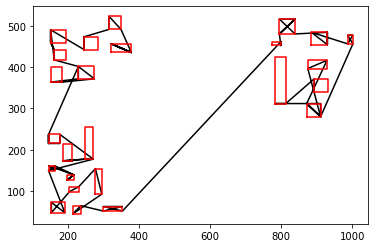

epoch:0, batch:2400/2500, reward:7561.3515625


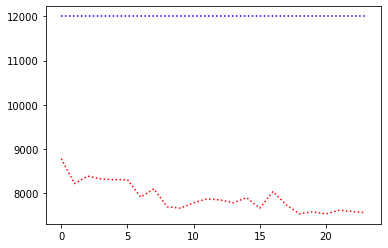

record the last path to gazebo for showing up


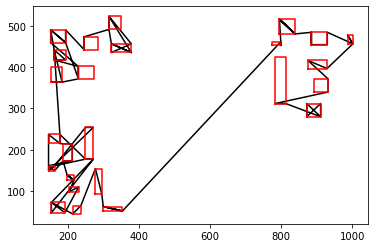

epoch:0, batch:2500/2500, reward:7558.64453125


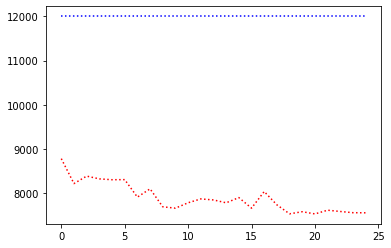

record the last path to gazebo for showing up


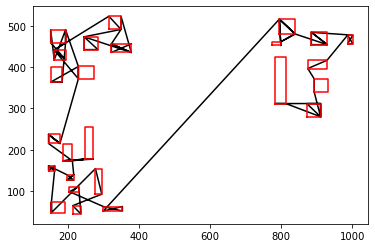

R_val =  tensor(7745.0566, device='cuda:0')
C_val =  tensor(11136.2539, device='cuda:0')
R_val =  tensor(7745.0566, device='cuda:0')
C_val =  tensor(11136.2539, device='cuda:0')
R_val =  tensor(7745.0566, device='cuda:0')
C_val =  tensor(11136.2539, device='cuda:0')
R_val =  tensor(7745.0566, device='cuda:0')
C_val =  tensor(11136.2539, device='cuda:0')
R_val =  tensor(7745.0566, device='cuda:0')
C_val =  tensor(11136.2539, device='cuda:0')
Avg Actor 7745.056640625 --- Avg Critic 11136.25390625
My actor is going on the right road Hallelujah :) Updated
Epoch: 0, epoch time: 59.948min, tot time: 0.042day, L_actor: 7745.057, L_critic: 11136.254, update: True
Save Checkpoints
epoch:1, batch:100/2500, reward:7410.7177734375


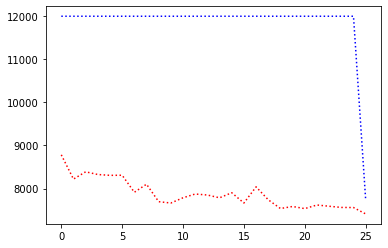

record the last path to gazebo for showing up


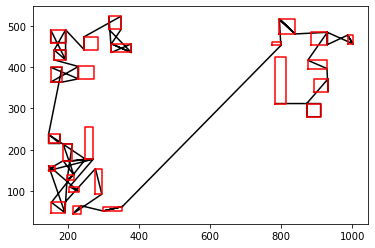

epoch:1, batch:200/2500, reward:7342.91259765625


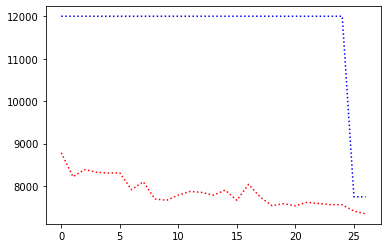

record the last path to gazebo for showing up


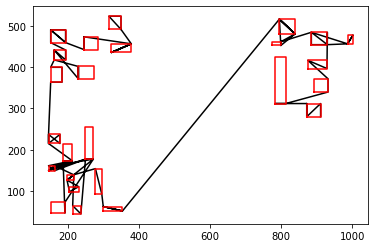

epoch:1, batch:300/2500, reward:7338.88037109375


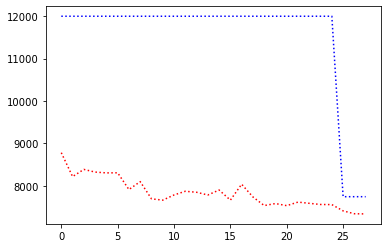

record the last path to gazebo for showing up


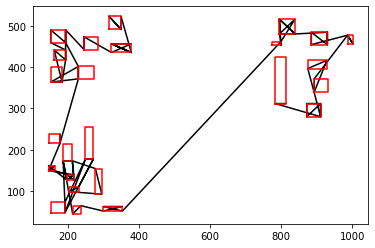

epoch:1, batch:400/2500, reward:7260.40234375


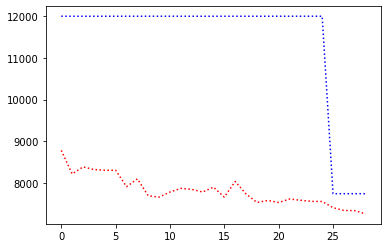

record the last path to gazebo for showing up


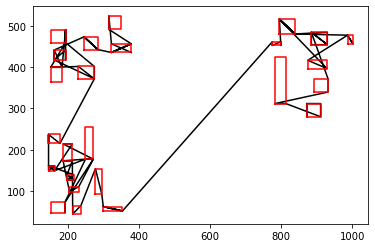

epoch:1, batch:500/2500, reward:7212.63134765625


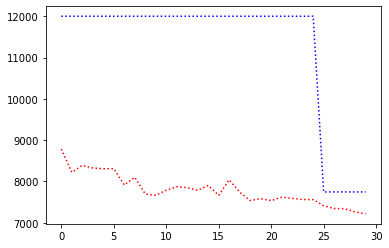

record the last path to gazebo for showing up


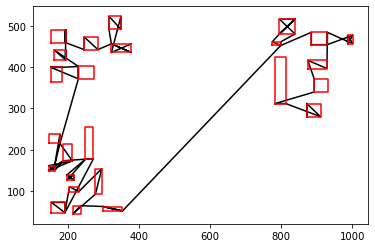

epoch:1, batch:600/2500, reward:7226.1181640625


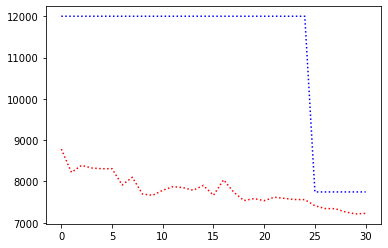

record the last path to gazebo for showing up


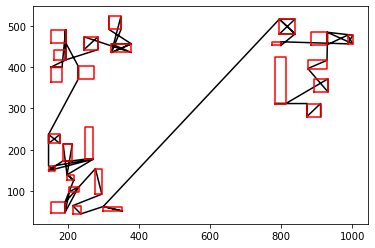

epoch:1, batch:700/2500, reward:7226.78564453125


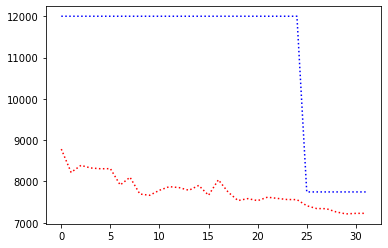

record the last path to gazebo for showing up


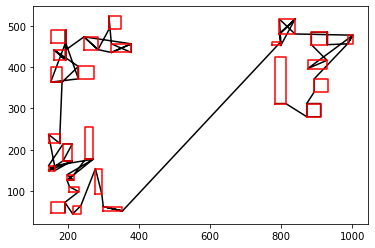

epoch:1, batch:800/2500, reward:7142.044921875


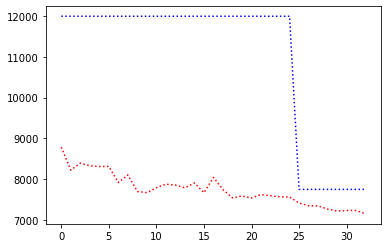

record the last path to gazebo for showing up


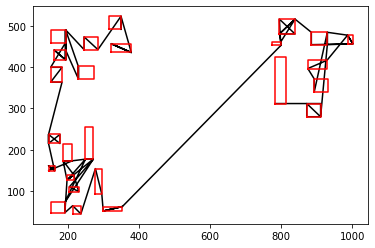

epoch:1, batch:900/2500, reward:7241.4443359375


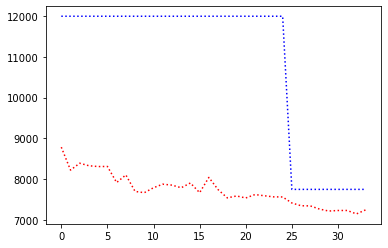

record the last path to gazebo for showing up


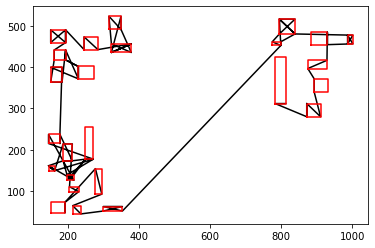

epoch:1, batch:1000/2500, reward:7094.05322265625


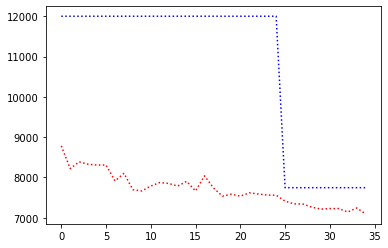

record the last path to gazebo for showing up


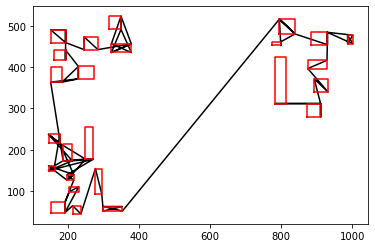

epoch:1, batch:1100/2500, reward:7143.35107421875


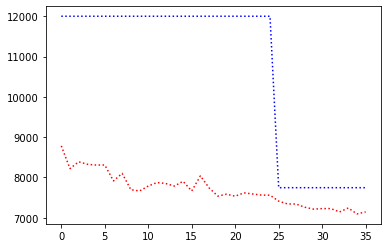

record the last path to gazebo for showing up


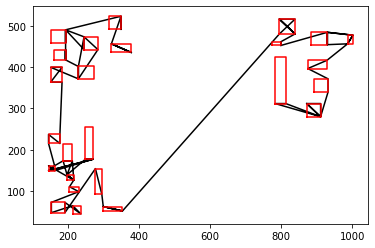

epoch:1, batch:1200/2500, reward:7070.99072265625


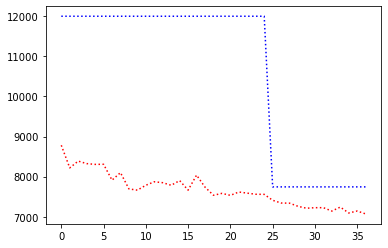

record the last path to gazebo for showing up


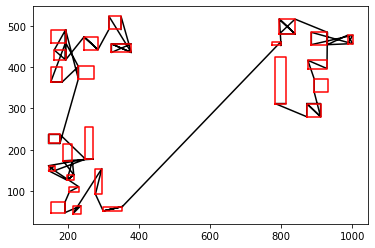

epoch:1, batch:1300/2500, reward:7156.86328125


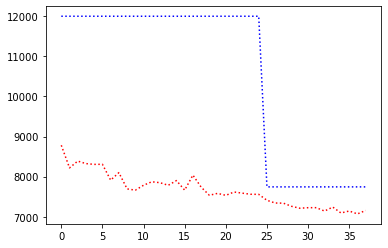

record the last path to gazebo for showing up


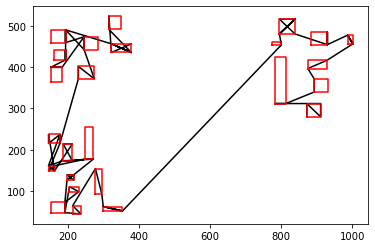

epoch:1, batch:1400/2500, reward:7130.83837890625


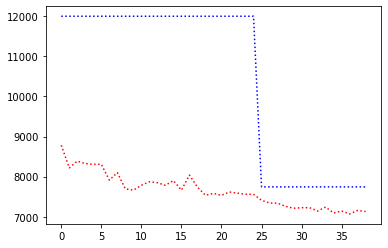

record the last path to gazebo for showing up


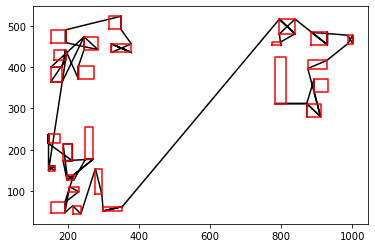

epoch:1, batch:1500/2500, reward:7054.1318359375


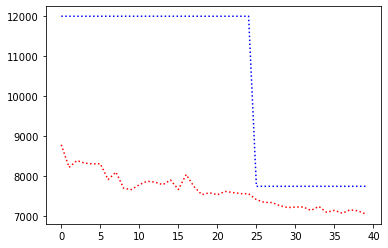

record the last path to gazebo for showing up


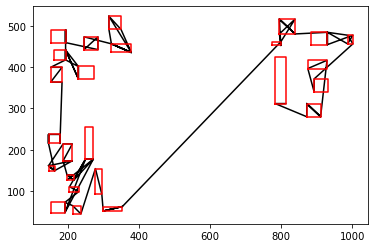

epoch:1, batch:1600/2500, reward:7082.33544921875


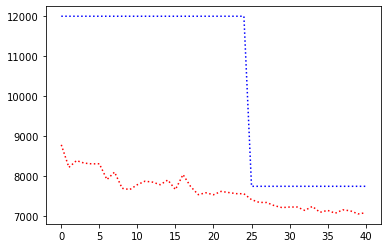

record the last path to gazebo for showing up


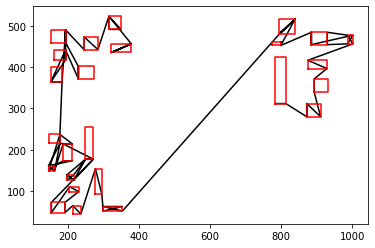

epoch:1, batch:1700/2500, reward:7068.6953125


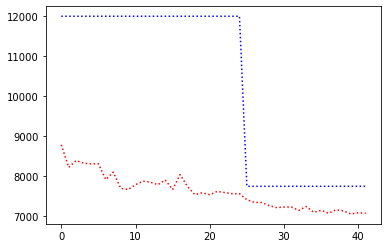

record the last path to gazebo for showing up


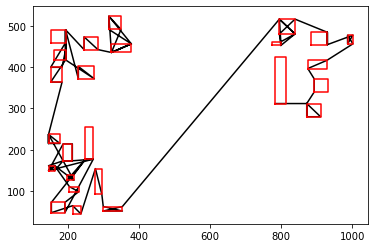

epoch:1, batch:1800/2500, reward:7000.380859375


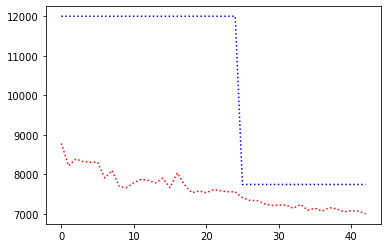

record the last path to gazebo for showing up


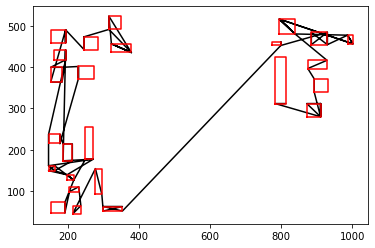

epoch:1, batch:1900/2500, reward:6999.7119140625


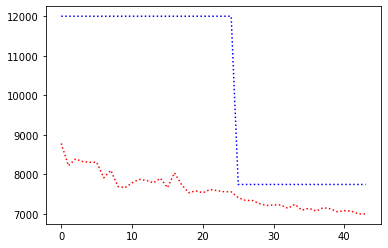

record the last path to gazebo for showing up


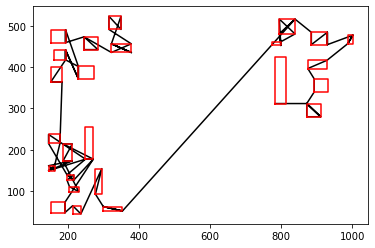

epoch:1, batch:2000/2500, reward:7030.39013671875


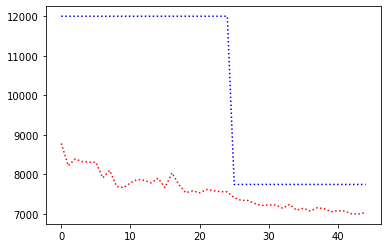

record the last path to gazebo for showing up


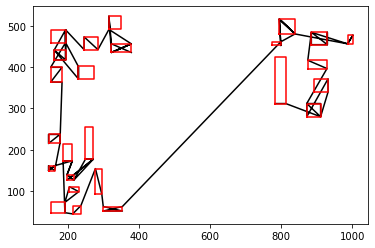

epoch:1, batch:2100/2500, reward:7042.017578125


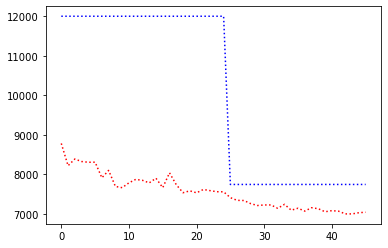

record the last path to gazebo for showing up


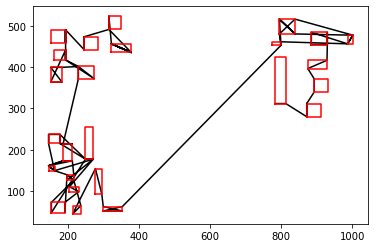

epoch:1, batch:2200/2500, reward:7027.14697265625


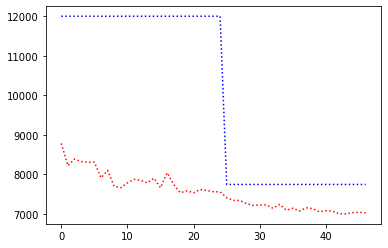

record the last path to gazebo for showing up


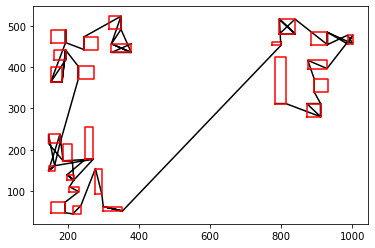

epoch:1, batch:2300/2500, reward:7045.49365234375


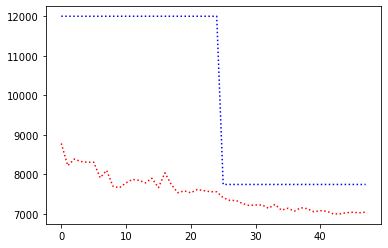

record the last path to gazebo for showing up


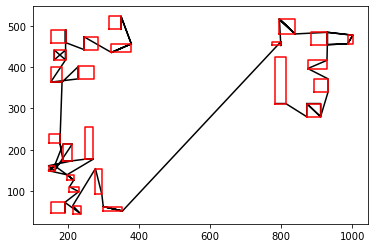

epoch:1, batch:2400/2500, reward:7020.9052734375


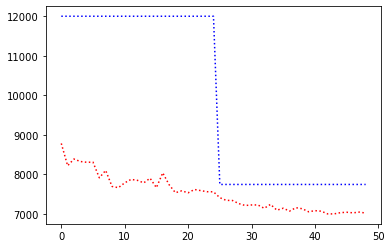

record the last path to gazebo for showing up


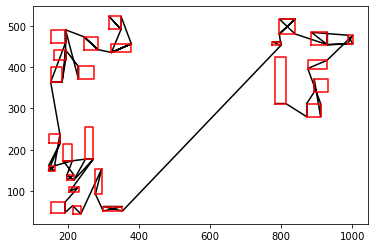

epoch:1, batch:2500/2500, reward:7005.48828125


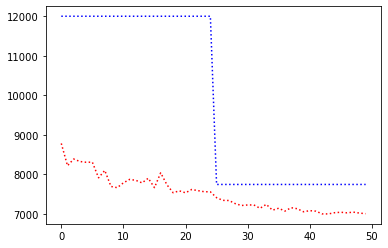

record the last path to gazebo for showing up


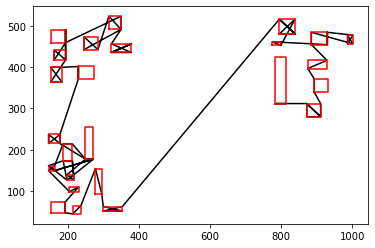

R_val =  tensor(7411.9326, device='cuda:0')
C_val =  tensor(7745.0566, device='cuda:0')
R_val =  tensor(7411.9326, device='cuda:0')
C_val =  tensor(7745.0566, device='cuda:0')
R_val =  tensor(7411.9326, device='cuda:0')
C_val =  tensor(7745.0566, device='cuda:0')
R_val =  tensor(7411.9326, device='cuda:0')
C_val =  tensor(7745.0566, device='cuda:0')
R_val =  tensor(7411.9326, device='cuda:0')
C_val =  tensor(7745.0566, device='cuda:0')
Avg Actor 7411.9326171875 --- Avg Critic 7745.056640625
My actor is going on the right road Hallelujah :) Updated
Epoch: 1, epoch time: 59.070min, tot time: 0.083day, L_actor: 7411.933, L_critic: 7745.057, update: True
Save Checkpoints
epoch:2, batch:100/2500, reward:7003.8955078125


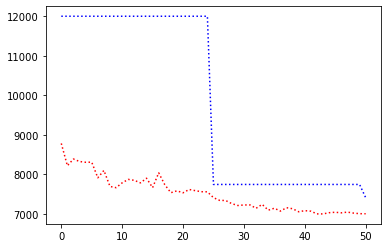

record the last path to gazebo for showing up


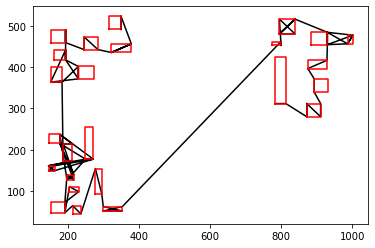

epoch:2, batch:200/2500, reward:6929.67919921875


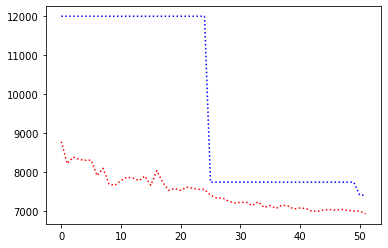

record the last path to gazebo for showing up


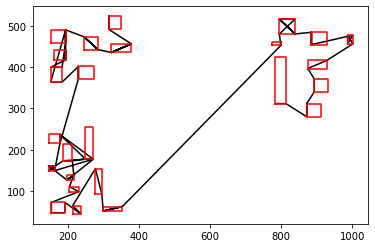

epoch:2, batch:300/2500, reward:6915.0546875


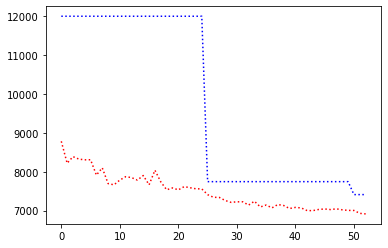

record the last path to gazebo for showing up


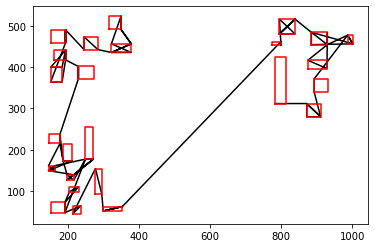

epoch:2, batch:400/2500, reward:6912.46142578125


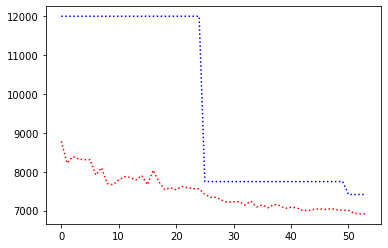

record the last path to gazebo for showing up


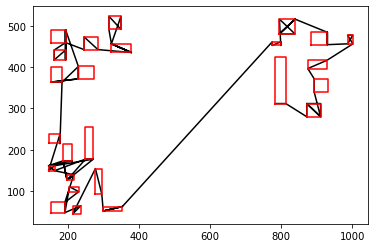

epoch:2, batch:500/2500, reward:6896.90869140625


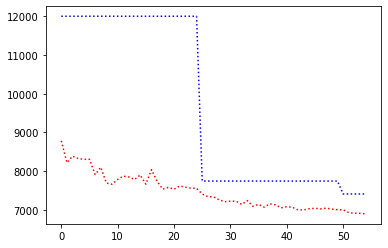

record the last path to gazebo for showing up


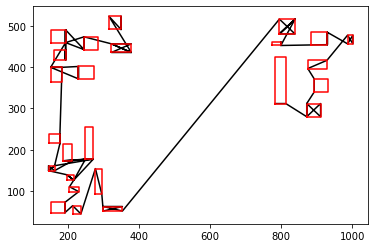

epoch:2, batch:600/2500, reward:6972.4755859375


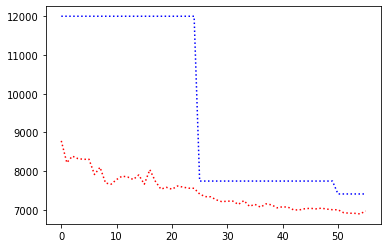

record the last path to gazebo for showing up


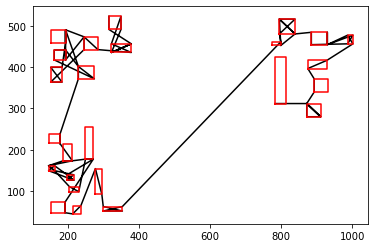

epoch:2, batch:700/2500, reward:6940.853515625


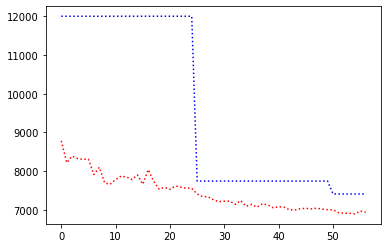

record the last path to gazebo for showing up


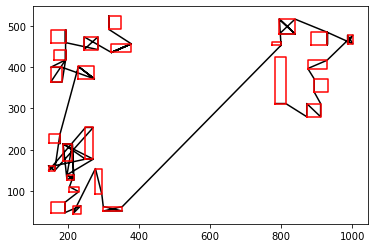

epoch:2, batch:800/2500, reward:6910.95654296875


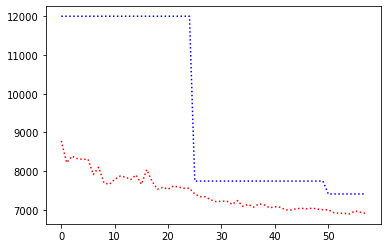

record the last path to gazebo for showing up


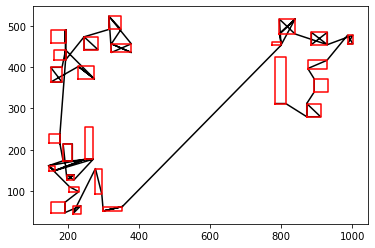

epoch:2, batch:900/2500, reward:6946.7412109375


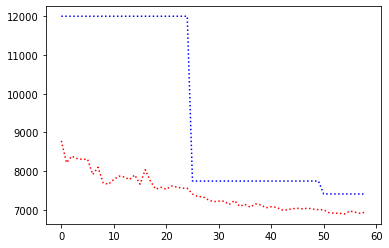

record the last path to gazebo for showing up


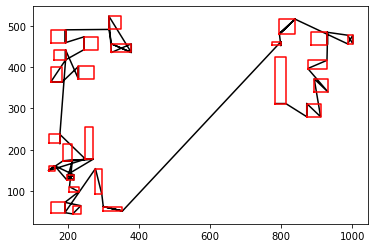

epoch:2, batch:1000/2500, reward:6968.3203125


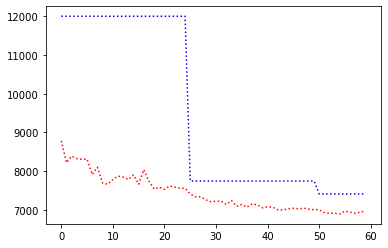

record the last path to gazebo for showing up


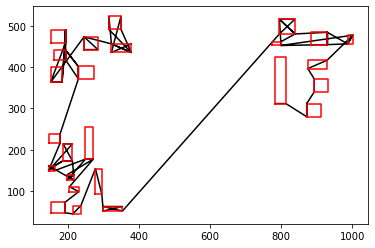

epoch:2, batch:1100/2500, reward:7077.37890625


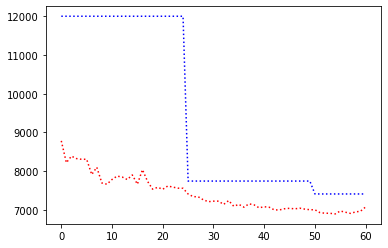

record the last path to gazebo for showing up


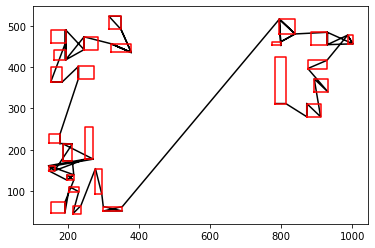

epoch:2, batch:1200/2500, reward:6941.345703125


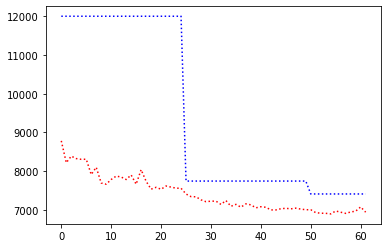

record the last path to gazebo for showing up


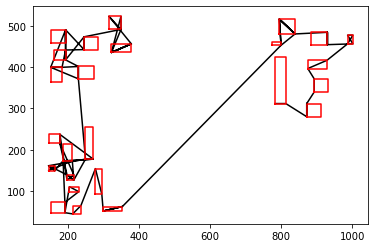

epoch:2, batch:1300/2500, reward:7029.0673828125


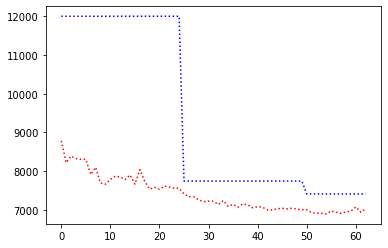

record the last path to gazebo for showing up


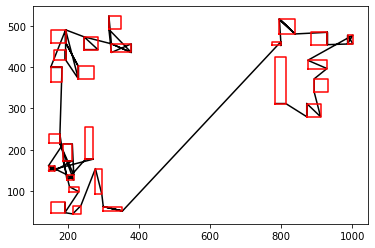

epoch:2, batch:1400/2500, reward:6973.14501953125


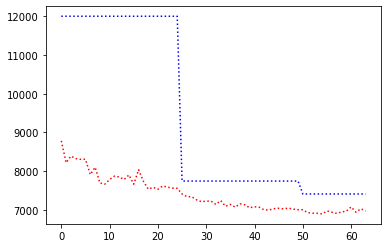

record the last path to gazebo for showing up


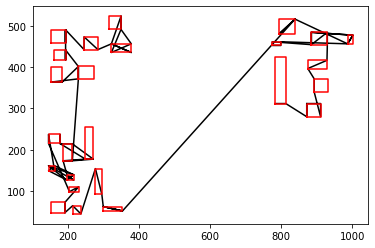

epoch:2, batch:1500/2500, reward:6884.0009765625


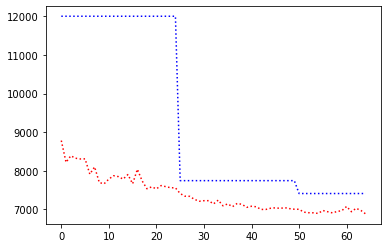

record the last path to gazebo for showing up


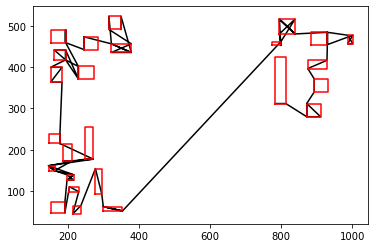

epoch:2, batch:1600/2500, reward:6792.716796875


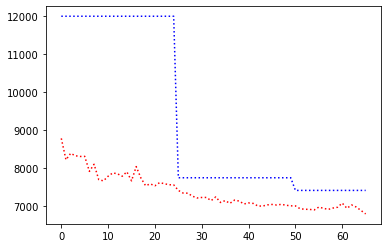

record the last path to gazebo for showing up


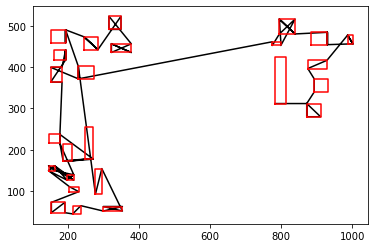

epoch:2, batch:1700/2500, reward:6917.4208984375


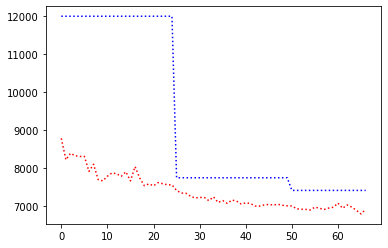

record the last path to gazebo for showing up


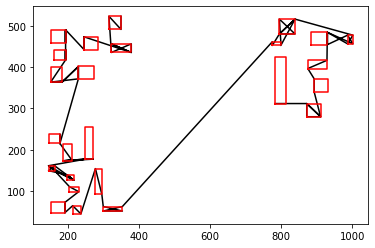

epoch:2, batch:1800/2500, reward:6759.2578125


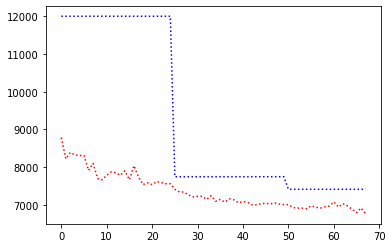

record the last path to gazebo for showing up


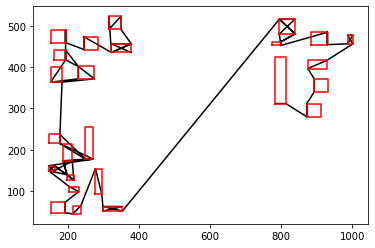

epoch:2, batch:1900/2500, reward:6737.35546875


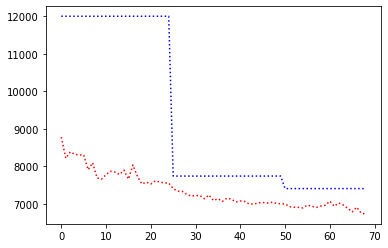

record the last path to gazebo for showing up


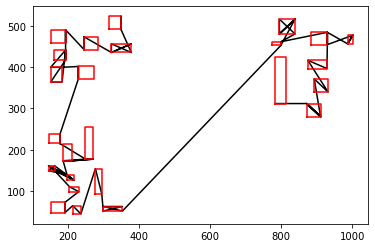

epoch:2, batch:2000/2500, reward:6741.166015625


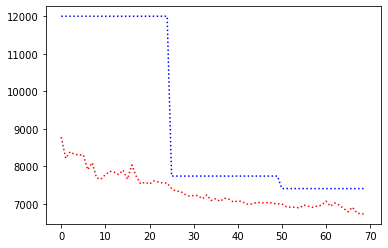

record the last path to gazebo for showing up


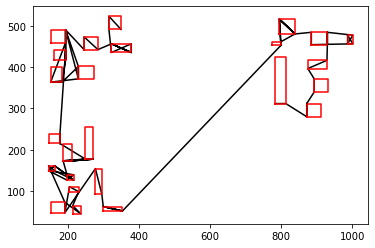

epoch:2, batch:2100/2500, reward:6758.9150390625


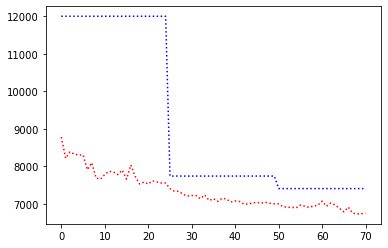

record the last path to gazebo for showing up


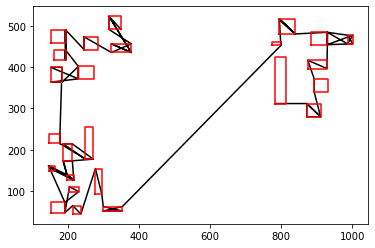

epoch:2, batch:2200/2500, reward:6753.33203125


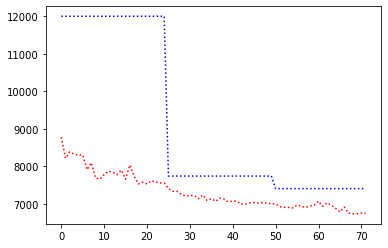

record the last path to gazebo for showing up


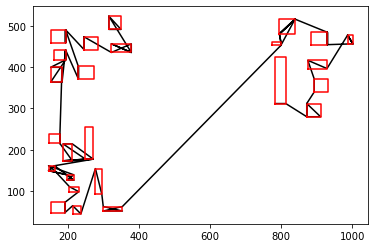

epoch:2, batch:2300/2500, reward:6725.8642578125


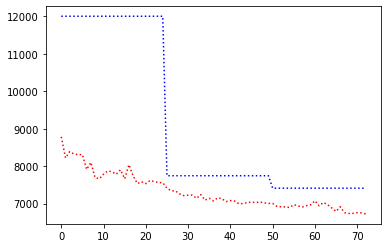

record the last path to gazebo for showing up


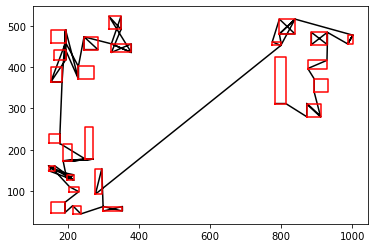

epoch:2, batch:2400/2500, reward:6700.42724609375


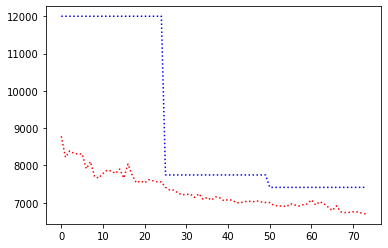

record the last path to gazebo for showing up


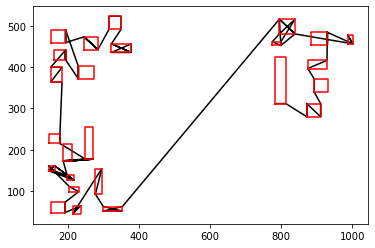

epoch:2, batch:2500/2500, reward:6908.65478515625


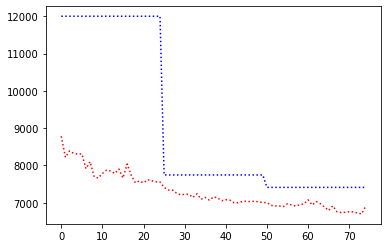

record the last path to gazebo for showing up


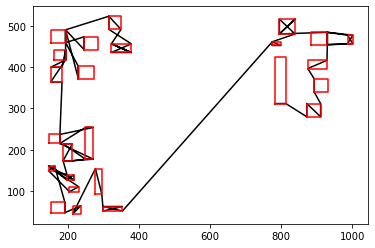

R_val =  tensor(7036.2534, device='cuda:0')
C_val =  tensor(7411.9326, device='cuda:0')
R_val =  tensor(7036.2534, device='cuda:0')
C_val =  tensor(7411.9326, device='cuda:0')
R_val =  tensor(7036.2534, device='cuda:0')
C_val =  tensor(7411.9326, device='cuda:0')
R_val =  tensor(7036.2534, device='cuda:0')
C_val =  tensor(7411.9326, device='cuda:0')
R_val =  tensor(7036.2534, device='cuda:0')
C_val =  tensor(7411.9326, device='cuda:0')
Avg Actor 7036.25341796875 --- Avg Critic 7411.9326171875
My actor is going on the right road Hallelujah :) Updated
Epoch: 2, epoch time: 58.642min, tot time: 0.124day, L_actor: 7036.253, L_critic: 7411.933, update: True
Save Checkpoints
epoch:3, batch:100/2500, reward:6730.0478515625


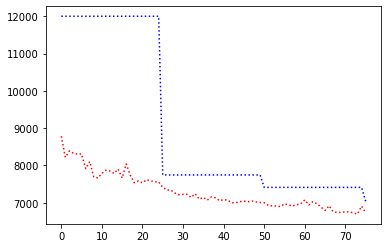

record the last path to gazebo for showing up


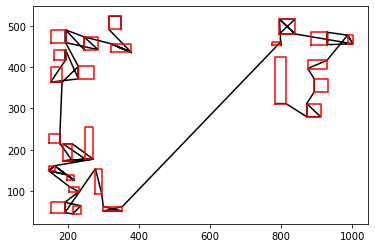

epoch:3, batch:200/2500, reward:6679.99609375


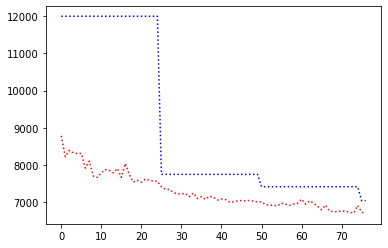

record the last path to gazebo for showing up


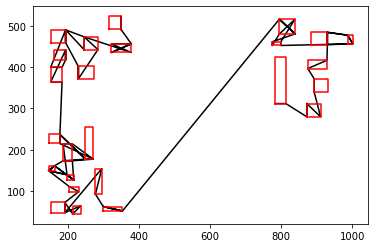

epoch:3, batch:300/2500, reward:6764.42822265625


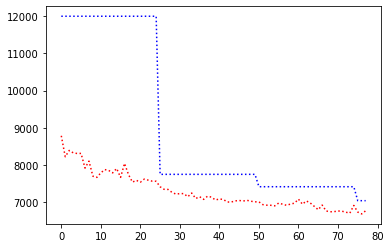

record the last path to gazebo for showing up


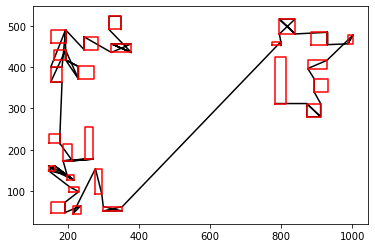

epoch:3, batch:400/2500, reward:6666.67724609375


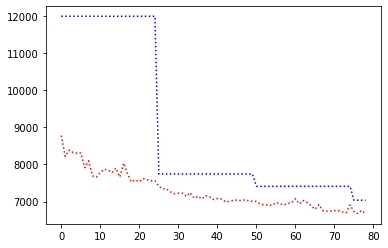

record the last path to gazebo for showing up


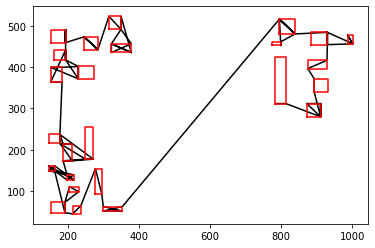

epoch:3, batch:500/2500, reward:6760.26123046875


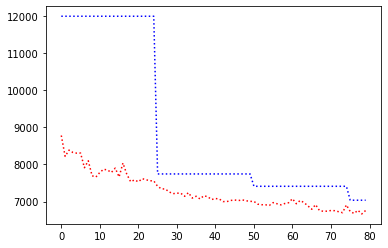

record the last path to gazebo for showing up


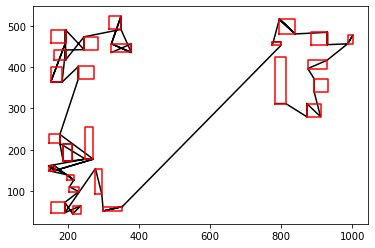

epoch:3, batch:600/2500, reward:6636.419921875


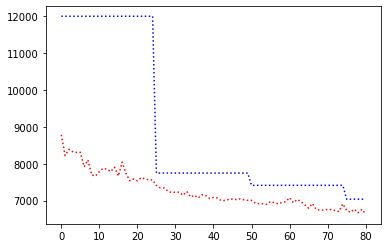

record the last path to gazebo for showing up


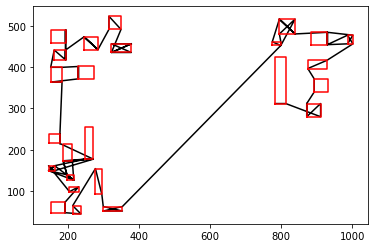

epoch:3, batch:700/2500, reward:6727.17578125


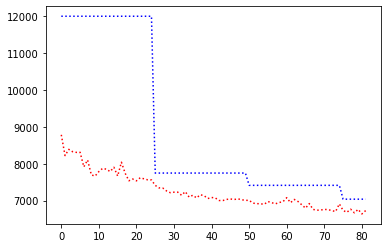

record the last path to gazebo for showing up


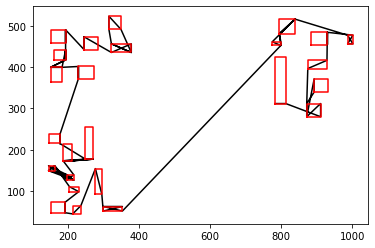

epoch:3, batch:800/2500, reward:6650.42236328125


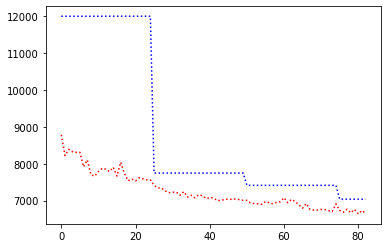

record the last path to gazebo for showing up


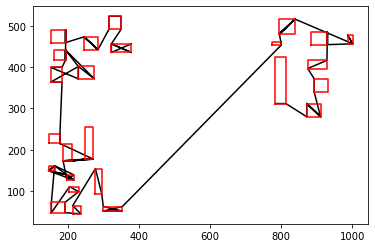

epoch:3, batch:900/2500, reward:6572.49951171875


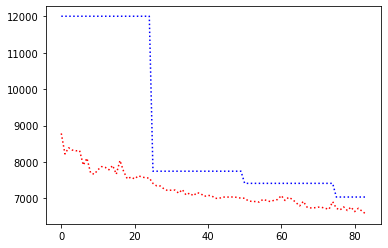

record the last path to gazebo for showing up


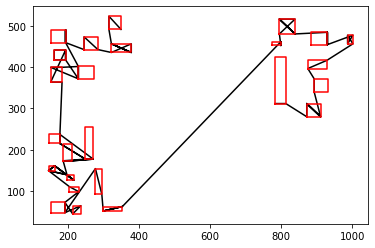

epoch:3, batch:1000/2500, reward:6529.0888671875


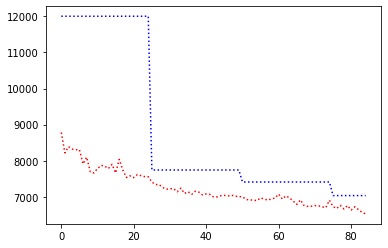

record the last path to gazebo for showing up


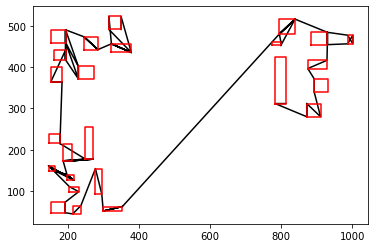

epoch:3, batch:1100/2500, reward:6583.35986328125


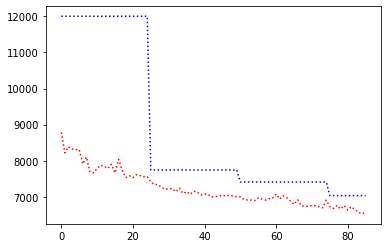

record the last path to gazebo for showing up


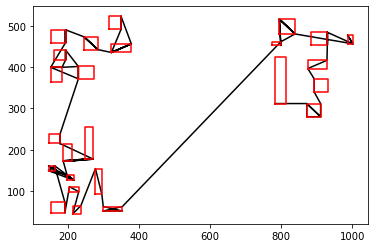

epoch:3, batch:1200/2500, reward:6601.0546875


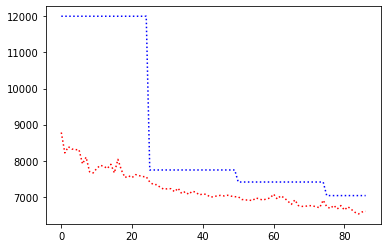

record the last path to gazebo for showing up


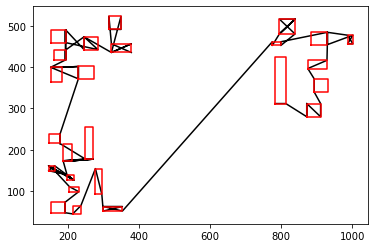

epoch:3, batch:1300/2500, reward:6567.0908203125


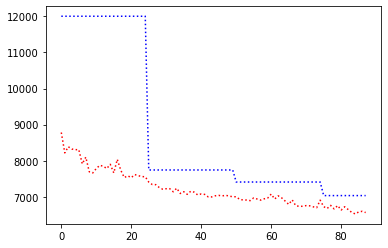

record the last path to gazebo for showing up


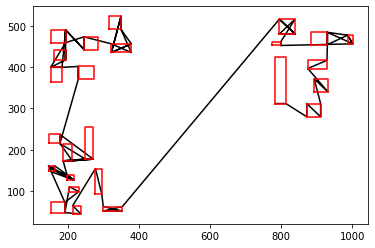

epoch:3, batch:1400/2500, reward:6605.35107421875


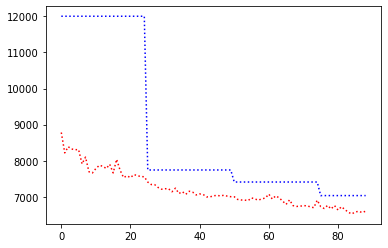

record the last path to gazebo for showing up


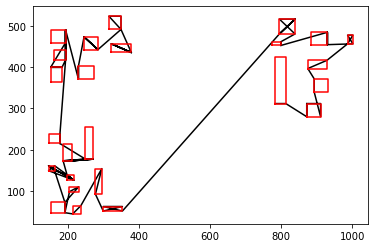

epoch:3, batch:1500/2500, reward:6561.8583984375


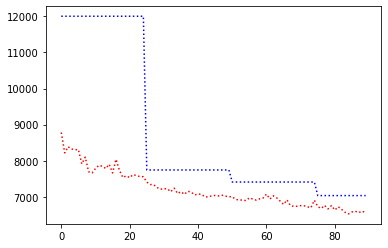

record the last path to gazebo for showing up


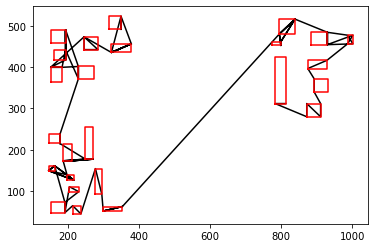

epoch:3, batch:1600/2500, reward:6609.83984375


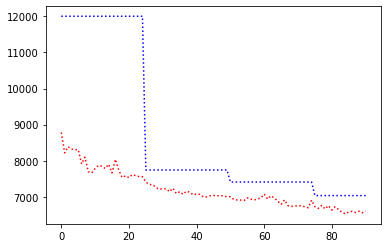

record the last path to gazebo for showing up


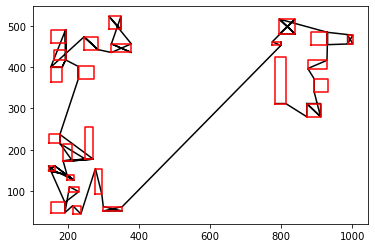

epoch:3, batch:1700/2500, reward:6584.369140625


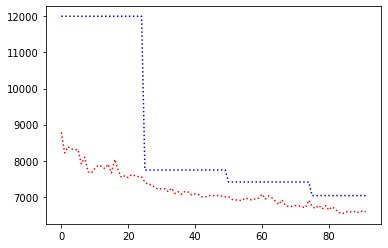

record the last path to gazebo for showing up


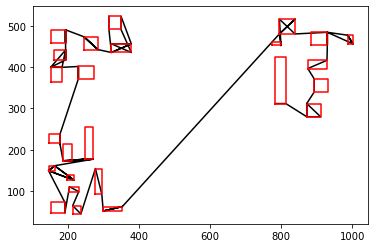

epoch:3, batch:1800/2500, reward:6535.1962890625


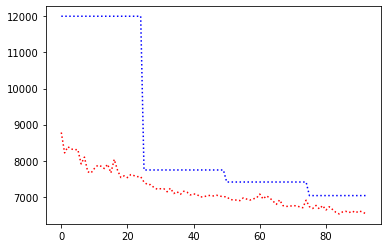

record the last path to gazebo for showing up


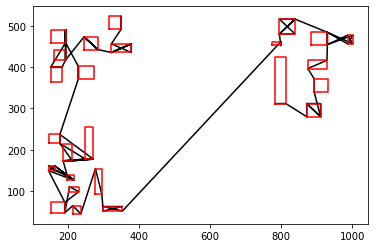

epoch:3, batch:1900/2500, reward:6525.869140625


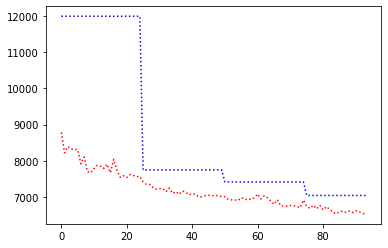

record the last path to gazebo for showing up


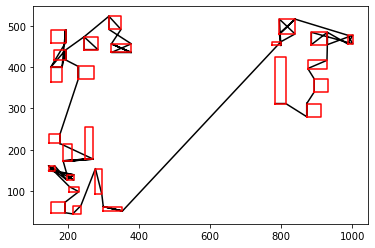

epoch:3, batch:2000/2500, reward:6588.333984375


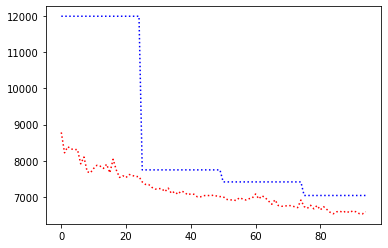

record the last path to gazebo for showing up


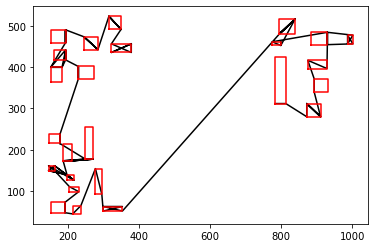

epoch:3, batch:2100/2500, reward:6505.3701171875


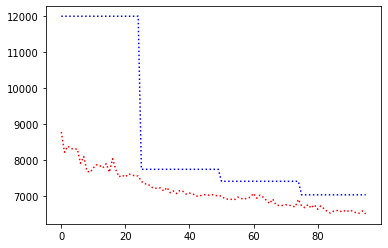

record the last path to gazebo for showing up


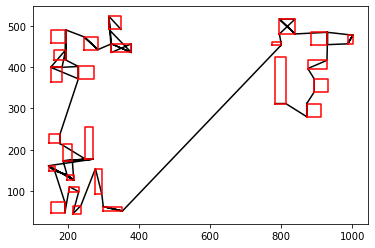

epoch:3, batch:2200/2500, reward:6555.1396484375


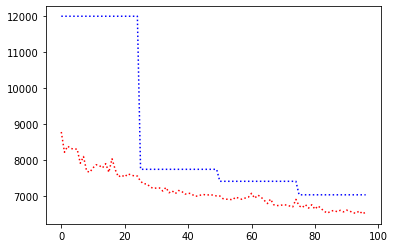

record the last path to gazebo for showing up


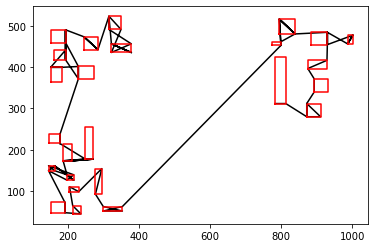

epoch:3, batch:2300/2500, reward:6542.1572265625


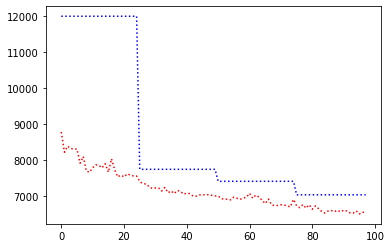

record the last path to gazebo for showing up


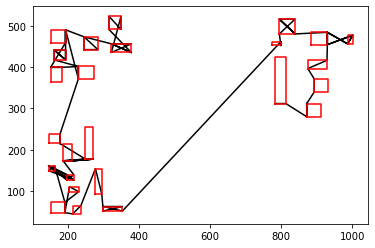

epoch:3, batch:2400/2500, reward:6607.5419921875


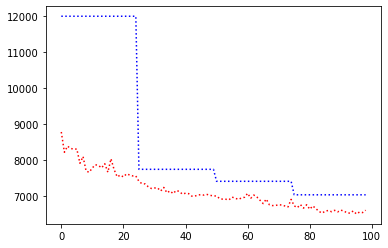

record the last path to gazebo for showing up


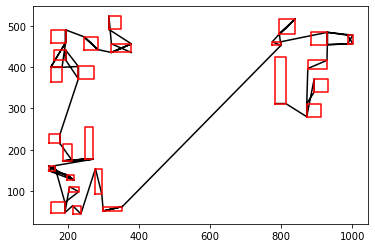

epoch:3, batch:2500/2500, reward:6609.2919921875


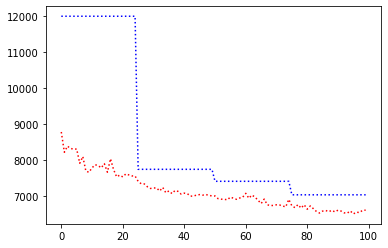

record the last path to gazebo for showing up


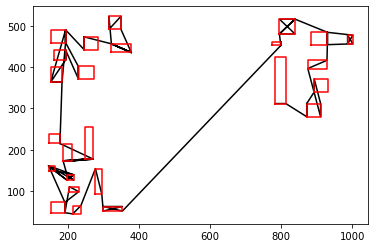

R_val =  tensor(6754.6089, device='cuda:0')
C_val =  tensor(7036.2534, device='cuda:0')
R_val =  tensor(6754.6089, device='cuda:0')
C_val =  tensor(7036.2534, device='cuda:0')
R_val =  tensor(6754.6089, device='cuda:0')
C_val =  tensor(7036.2534, device='cuda:0')
R_val =  tensor(6754.6089, device='cuda:0')
C_val =  tensor(7036.2534, device='cuda:0')
R_val =  tensor(6754.6089, device='cuda:0')
C_val =  tensor(7036.2534, device='cuda:0')
Avg Actor 6754.60888671875 --- Avg Critic 7036.25341796875
My actor is going on the right road Hallelujah :) Updated
Epoch: 3, epoch time: 58.639min, tot time: 0.165day, L_actor: 6754.609, L_critic: 7036.253, update: True
Save Checkpoints
epoch:4, batch:100/2500, reward:6504.0126953125


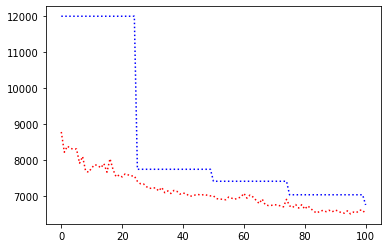

record the last path to gazebo for showing up


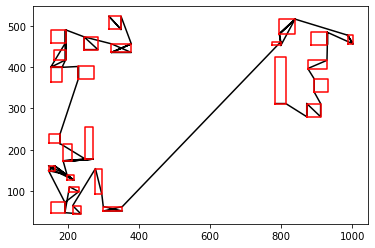

epoch:4, batch:200/2500, reward:6489.13427734375


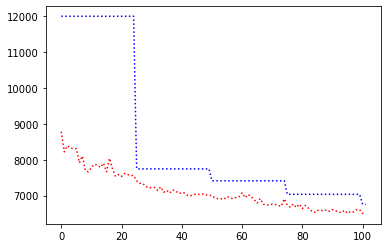

record the last path to gazebo for showing up


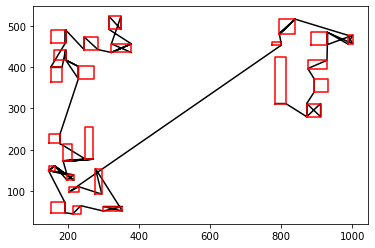

epoch:4, batch:300/2500, reward:6447.884765625


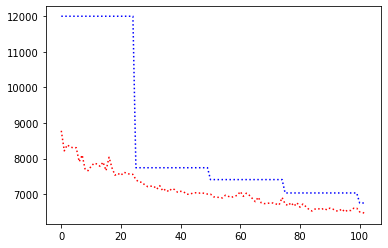

record the last path to gazebo for showing up


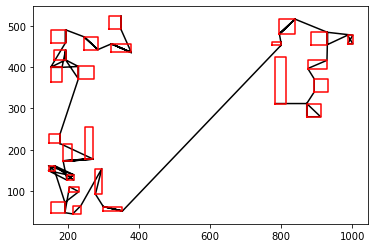

epoch:4, batch:400/2500, reward:6464.849609375


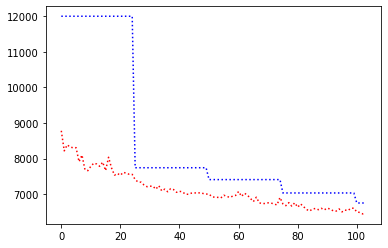

record the last path to gazebo for showing up


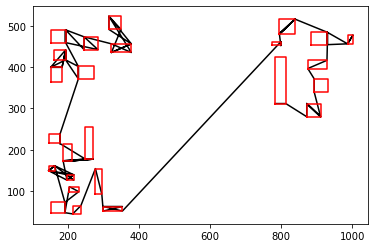

epoch:4, batch:500/2500, reward:6495.619140625


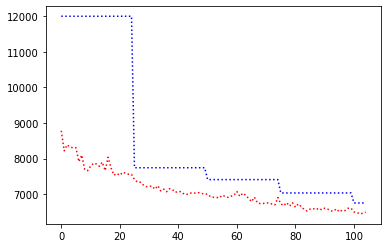

record the last path to gazebo for showing up


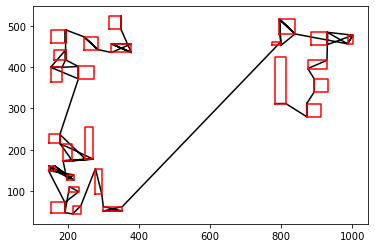

epoch:4, batch:600/2500, reward:6421.1689453125


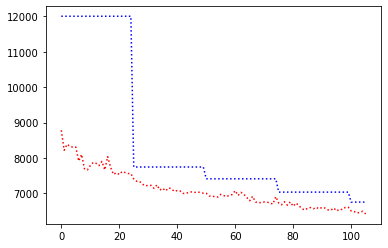

record the last path to gazebo for showing up


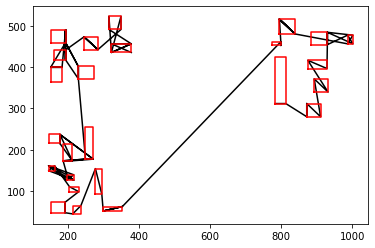

epoch:4, batch:700/2500, reward:6459.560546875


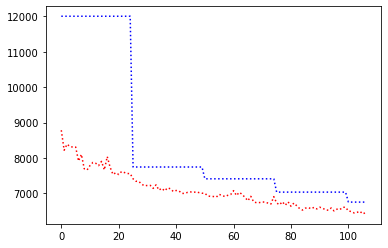

record the last path to gazebo for showing up


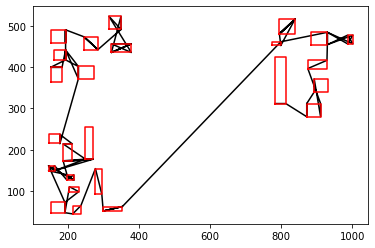

epoch:4, batch:800/2500, reward:6473.55322265625


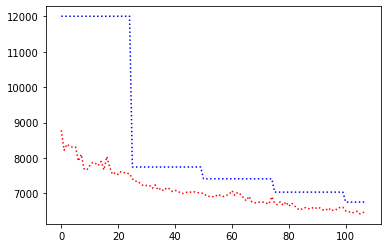

record the last path to gazebo for showing up


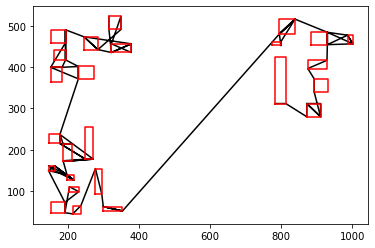

epoch:4, batch:900/2500, reward:6448.6767578125


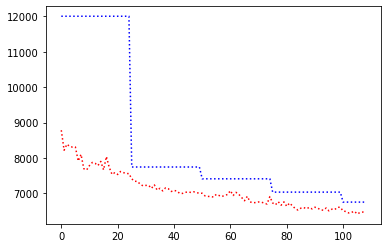

record the last path to gazebo for showing up


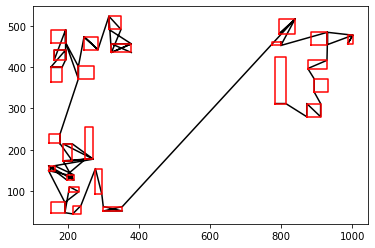

epoch:4, batch:1000/2500, reward:6433.72900390625


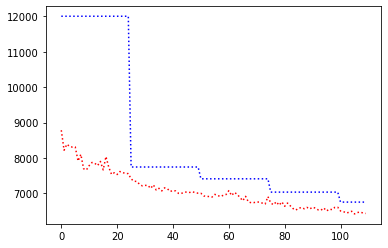

record the last path to gazebo for showing up


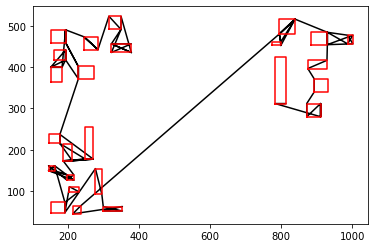

epoch:4, batch:1100/2500, reward:6433.1484375


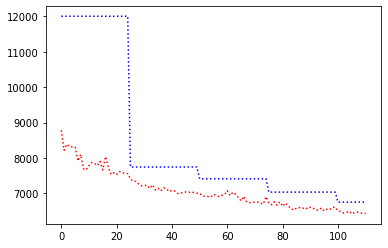

record the last path to gazebo for showing up


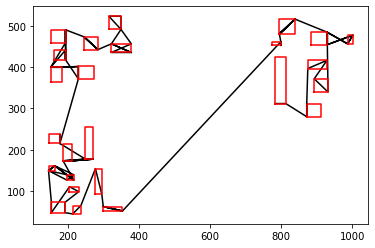

epoch:4, batch:1200/2500, reward:6391.666015625


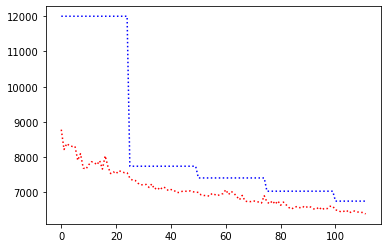

record the last path to gazebo for showing up


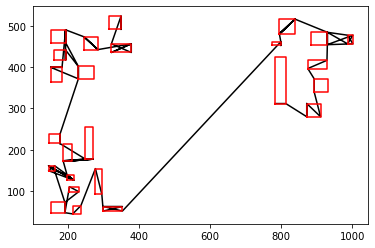

epoch:4, batch:1300/2500, reward:6468.16650390625


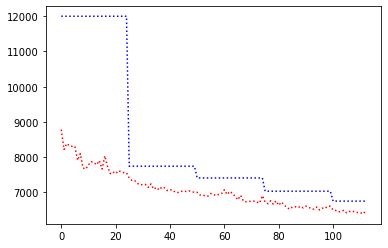

record the last path to gazebo for showing up


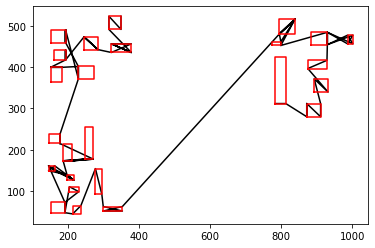

epoch:4, batch:1400/2500, reward:6441.6796875


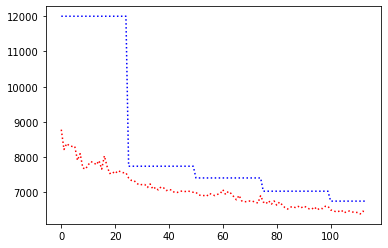

record the last path to gazebo for showing up


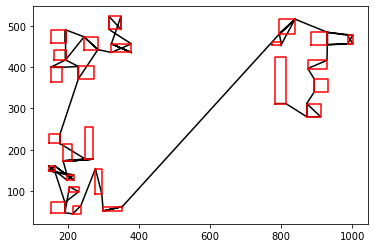

epoch:4, batch:1500/2500, reward:6435.486328125


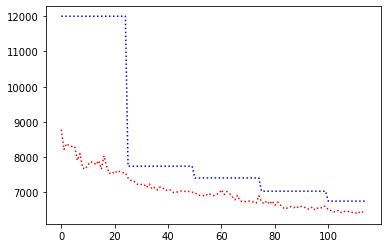

record the last path to gazebo for showing up


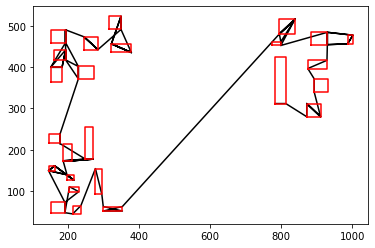

epoch:4, batch:1600/2500, reward:6375.857421875


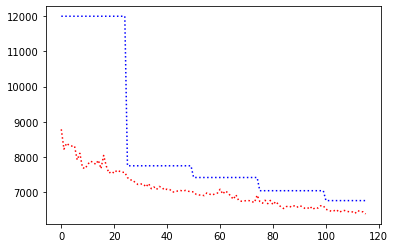

record the last path to gazebo for showing up


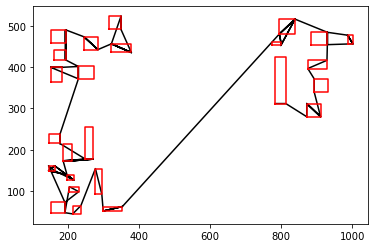

epoch:4, batch:1700/2500, reward:6373.47998046875


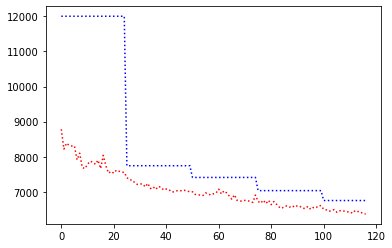

record the last path to gazebo for showing up


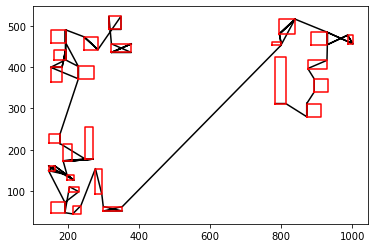

epoch:4, batch:1800/2500, reward:6431.6015625


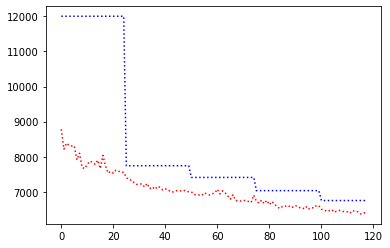

record the last path to gazebo for showing up


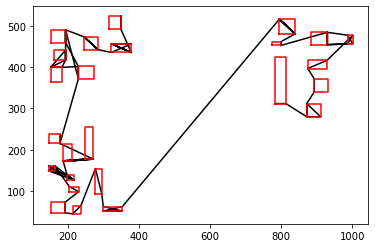

epoch:4, batch:1900/2500, reward:6393.1328125


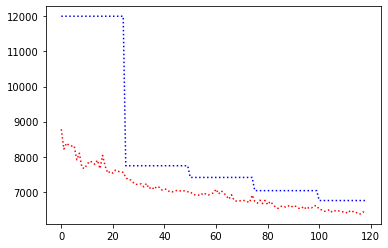

record the last path to gazebo for showing up


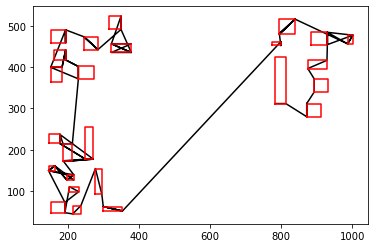

epoch:4, batch:2000/2500, reward:6408.7958984375


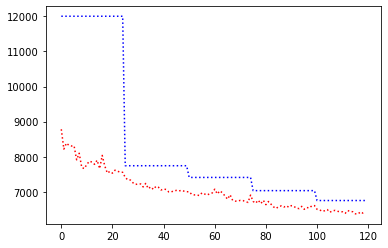

record the last path to gazebo for showing up


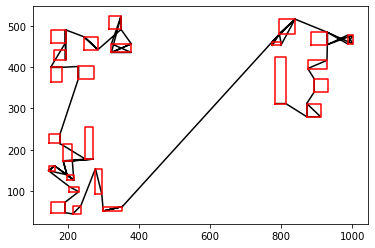

epoch:4, batch:2100/2500, reward:6379.0712890625


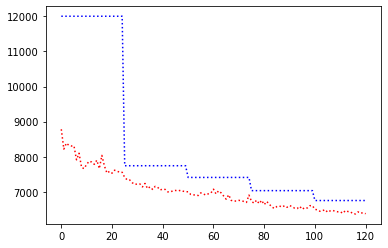

record the last path to gazebo for showing up


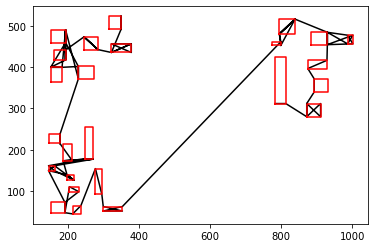

epoch:4, batch:2200/2500, reward:6353.74462890625


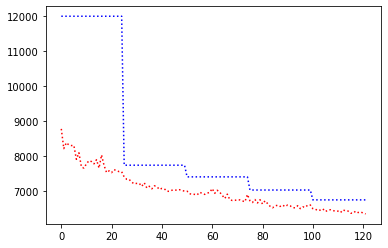

record the last path to gazebo for showing up


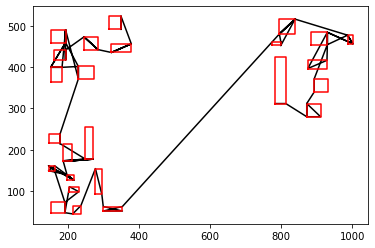

epoch:4, batch:2300/2500, reward:6415.52392578125


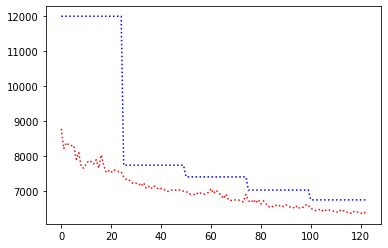

record the last path to gazebo for showing up


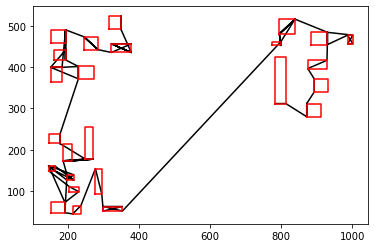

epoch:4, batch:2400/2500, reward:6408.1796875


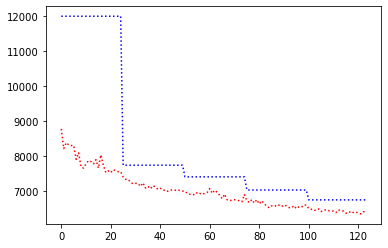

record the last path to gazebo for showing up


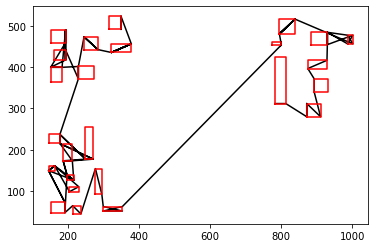

epoch:4, batch:2500/2500, reward:6373.81005859375


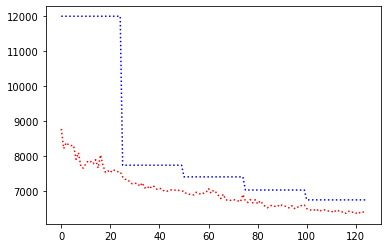

record the last path to gazebo for showing up


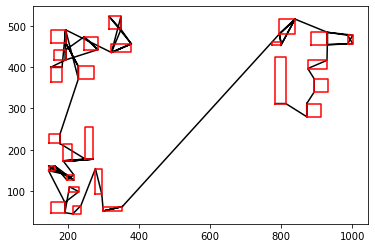

R_val =  tensor(6451.8359, device='cuda:0')
C_val =  tensor(6754.6089, device='cuda:0')
R_val =  tensor(6451.8359, device='cuda:0')
C_val =  tensor(6754.6089, device='cuda:0')
R_val =  tensor(6451.8359, device='cuda:0')
C_val =  tensor(6754.6089, device='cuda:0')
R_val =  tensor(6451.8359, device='cuda:0')
C_val =  tensor(6754.6089, device='cuda:0')
R_val =  tensor(6451.8359, device='cuda:0')
C_val =  tensor(6754.6089, device='cuda:0')
Avg Actor 6451.8359375 --- Avg Critic 6754.60888671875
My actor is going on the right road Hallelujah :) Updated
Epoch: 4, epoch time: 58.724min, tot time: 0.205day, L_actor: 6451.836, L_critic: 6754.609, update: True
Save Checkpoints
epoch:5, batch:100/2500, reward:6338.1552734375


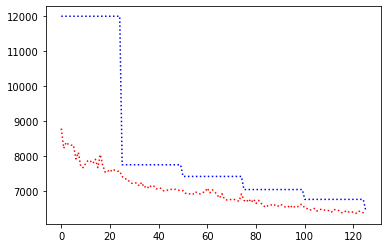

record the last path to gazebo for showing up


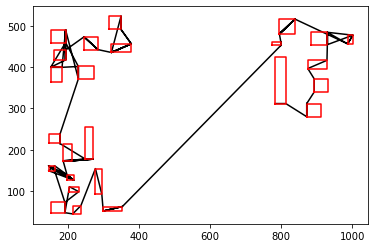

epoch:5, batch:200/2500, reward:6282.26416015625


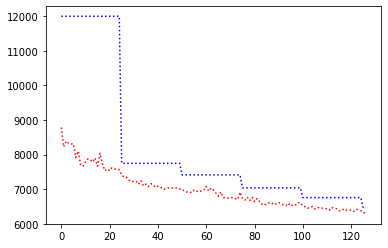

record the last path to gazebo for showing up


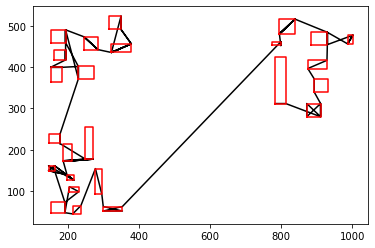

epoch:5, batch:300/2500, reward:6297.48046875


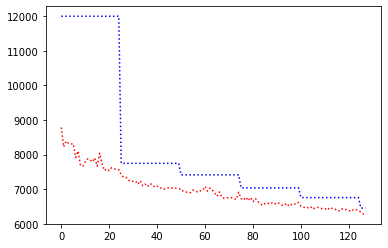

record the last path to gazebo for showing up


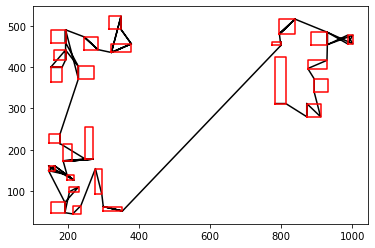

epoch:5, batch:400/2500, reward:6464.7353515625


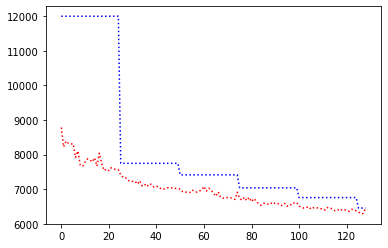

record the last path to gazebo for showing up


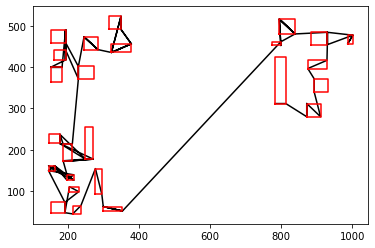

epoch:5, batch:500/2500, reward:6268.216796875


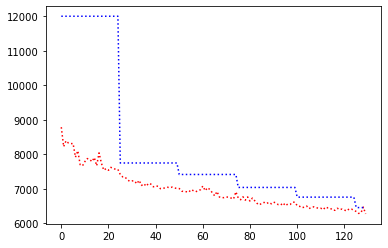

record the last path to gazebo for showing up


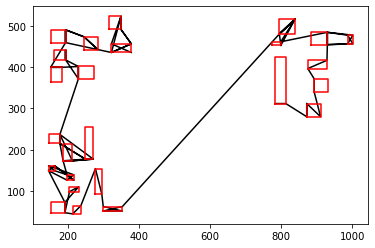

epoch:5, batch:600/2500, reward:6289.00390625


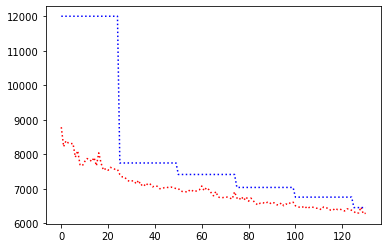

record the last path to gazebo for showing up


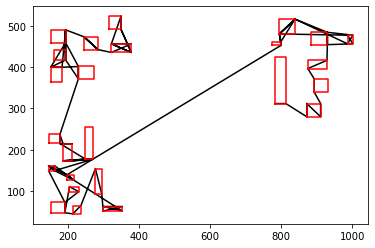

epoch:5, batch:700/2500, reward:6236.66552734375


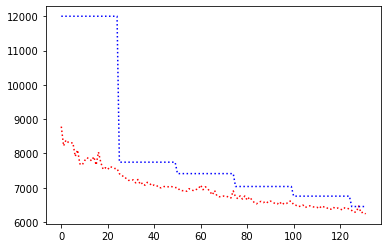

record the last path to gazebo for showing up


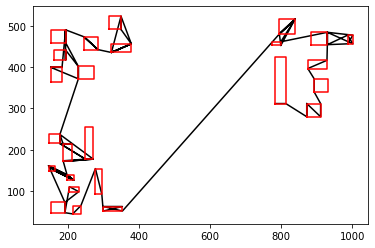

epoch:5, batch:800/2500, reward:6216.45458984375


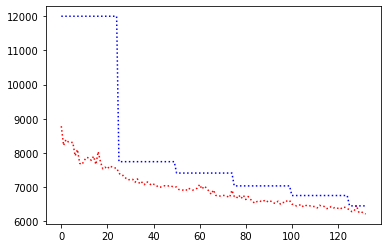

record the last path to gazebo for showing up


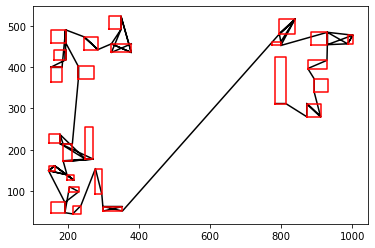

epoch:5, batch:900/2500, reward:6171.80859375


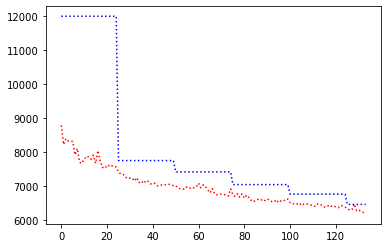

record the last path to gazebo for showing up


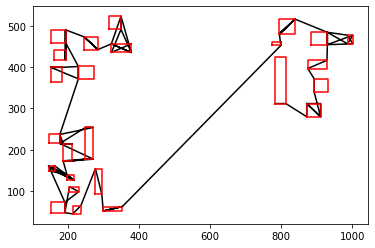

epoch:5, batch:1000/2500, reward:6222.19140625


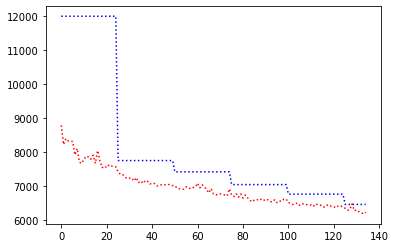

record the last path to gazebo for showing up


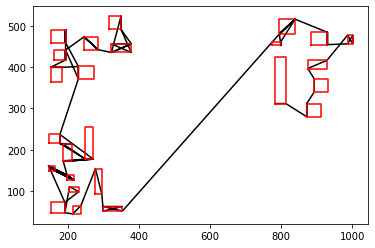

epoch:5, batch:1100/2500, reward:6159.27001953125


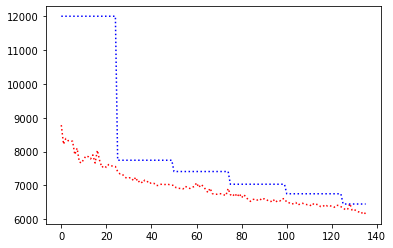

record the last path to gazebo for showing up


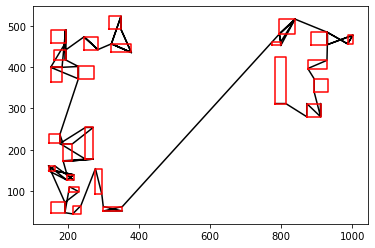

epoch:5, batch:1200/2500, reward:6196.3037109375


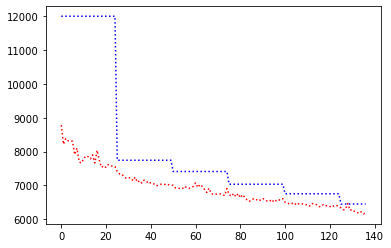

record the last path to gazebo for showing up


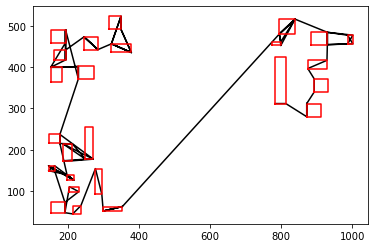

epoch:5, batch:1300/2500, reward:6162.505859375


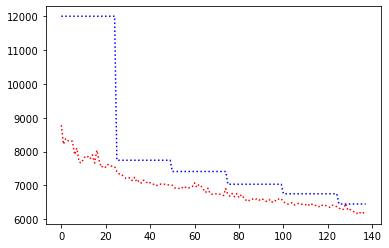

record the last path to gazebo for showing up


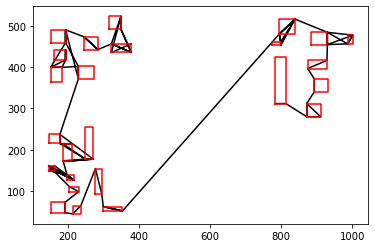

epoch:5, batch:1400/2500, reward:6189.5517578125


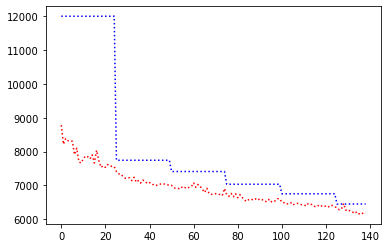

record the last path to gazebo for showing up


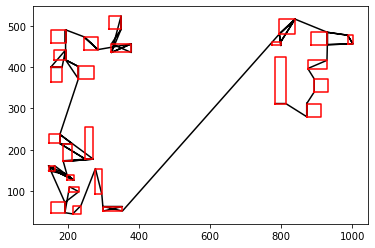

epoch:5, batch:1500/2500, reward:6247.05908203125


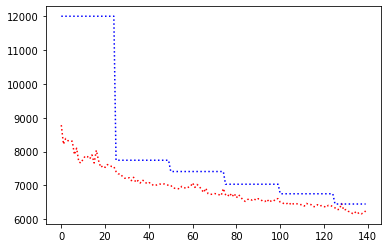

record the last path to gazebo for showing up


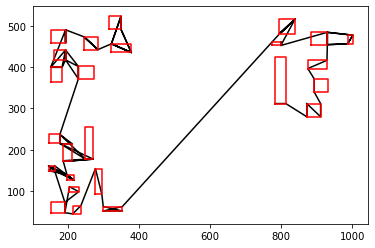

epoch:5, batch:1600/2500, reward:6184.22802734375


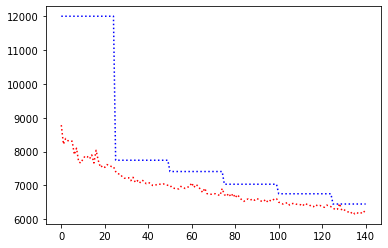

record the last path to gazebo for showing up


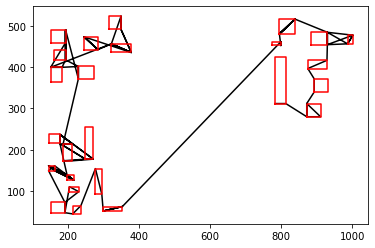

epoch:5, batch:1700/2500, reward:6243.6923828125


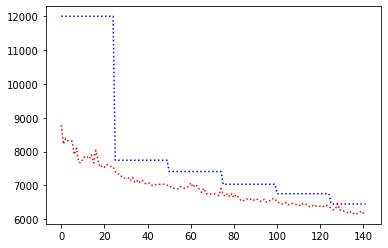

record the last path to gazebo for showing up


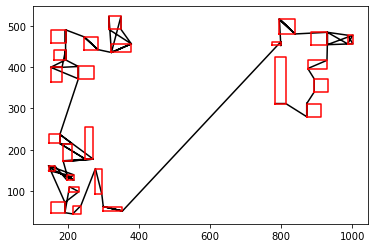

epoch:5, batch:1800/2500, reward:6250.140625


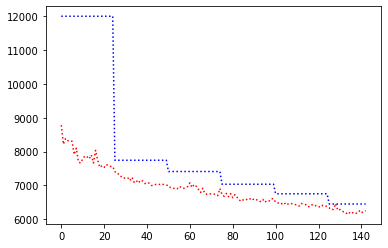

record the last path to gazebo for showing up


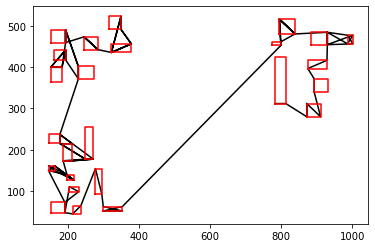

epoch:5, batch:1900/2500, reward:6209.03515625


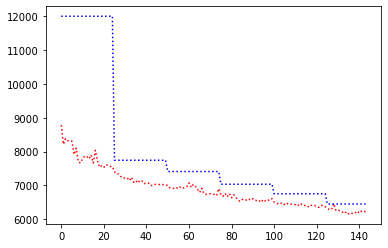

record the last path to gazebo for showing up


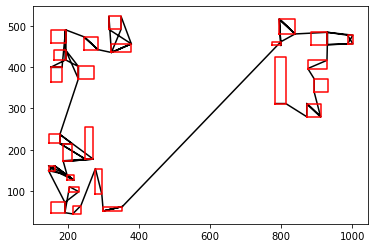

epoch:5, batch:2000/2500, reward:6146.380859375


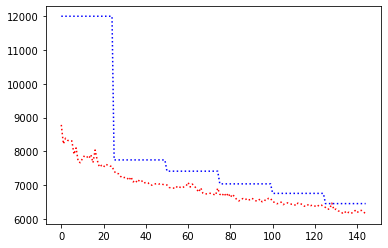

record the last path to gazebo for showing up


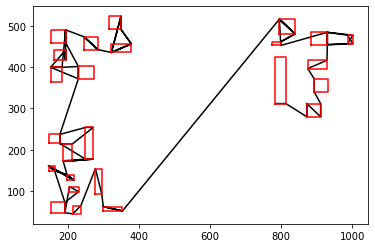

epoch:5, batch:2100/2500, reward:6092.16259765625


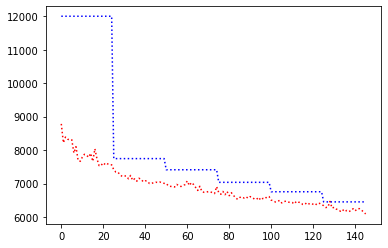

record the last path to gazebo for showing up


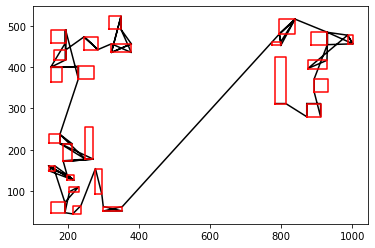

epoch:5, batch:2200/2500, reward:6130.154296875


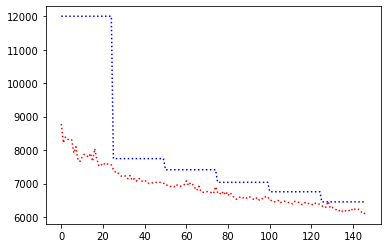

record the last path to gazebo for showing up


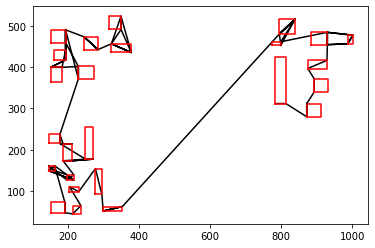

epoch:5, batch:2300/2500, reward:6133.3828125


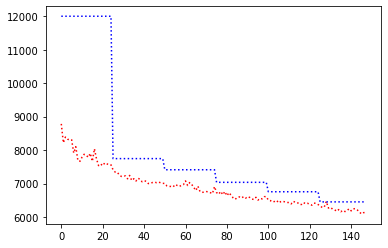

record the last path to gazebo for showing up


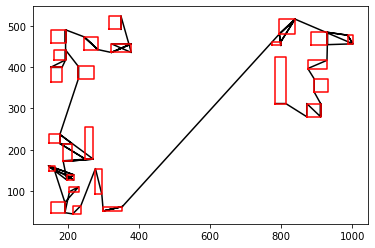

epoch:5, batch:2400/2500, reward:6223.775390625


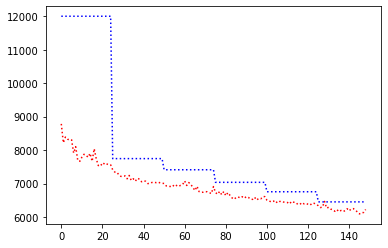

record the last path to gazebo for showing up


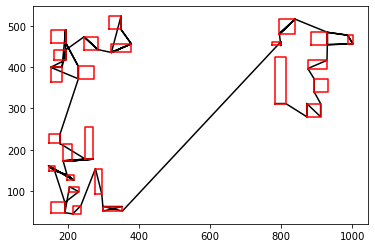

epoch:5, batch:2500/2500, reward:6172.4384765625


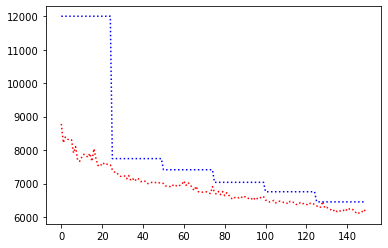

record the last path to gazebo for showing up


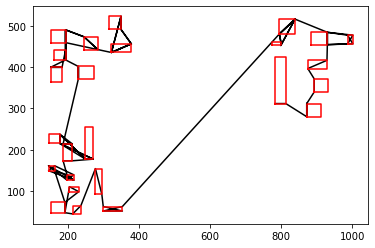

R_val =  tensor(6358.6719, device='cuda:0')
C_val =  tensor(6451.8359, device='cuda:0')
R_val =  tensor(6358.6719, device='cuda:0')
C_val =  tensor(6451.8359, device='cuda:0')
R_val =  tensor(6358.6719, device='cuda:0')
C_val =  tensor(6451.8359, device='cuda:0')
R_val =  tensor(6358.6719, device='cuda:0')
C_val =  tensor(6451.8359, device='cuda:0')
R_val =  tensor(6358.6719, device='cuda:0')
C_val =  tensor(6451.8359, device='cuda:0')
Avg Actor 6358.671875 --- Avg Critic 6451.8359375
My actor is going on the right road Hallelujah :) Updated
Epoch: 5, epoch time: 58.890min, tot time: 0.247day, L_actor: 6358.672, L_critic: 6451.836, update: True
Save Checkpoints
epoch:6, batch:100/2500, reward:6161.2529296875


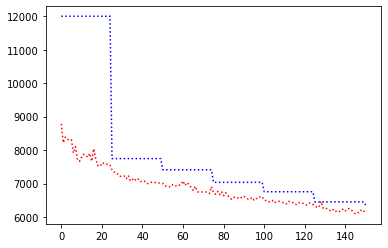

record the last path to gazebo for showing up


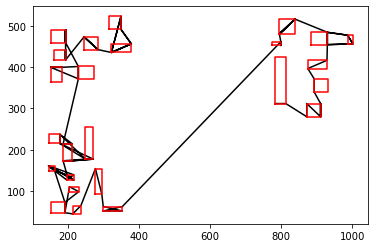

epoch:6, batch:200/2500, reward:6175.47705078125


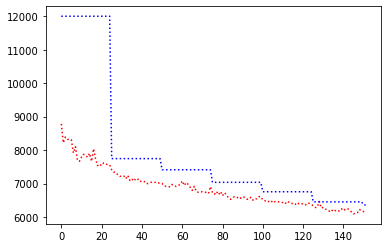

record the last path to gazebo for showing up


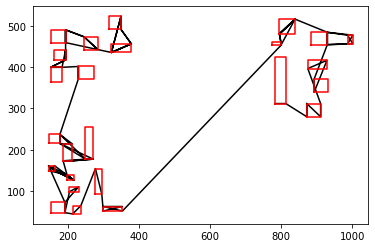

epoch:6, batch:300/2500, reward:6157.849609375


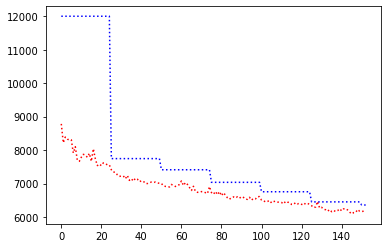

record the last path to gazebo for showing up


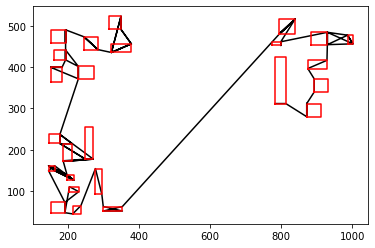

epoch:6, batch:400/2500, reward:6149.8779296875


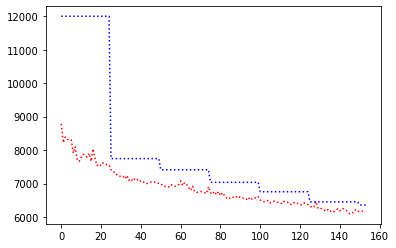

record the last path to gazebo for showing up


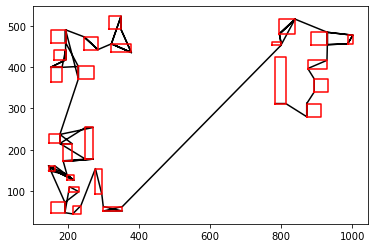

epoch:6, batch:500/2500, reward:6150.0537109375


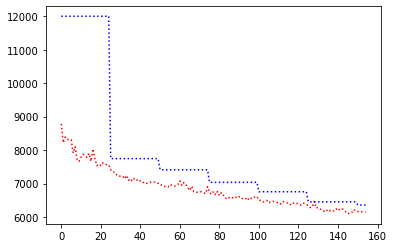

record the last path to gazebo for showing up


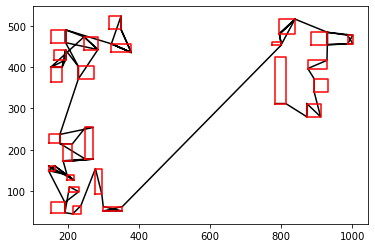

epoch:6, batch:600/2500, reward:6175.232421875


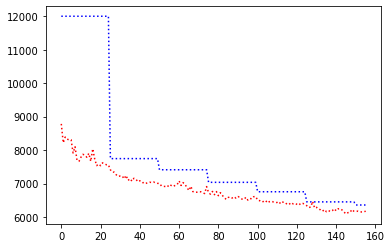

record the last path to gazebo for showing up


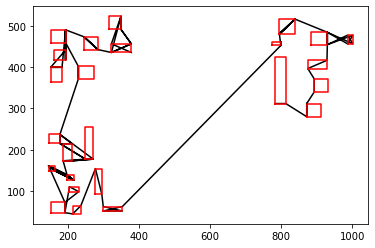

epoch:6, batch:700/2500, reward:6142.63671875


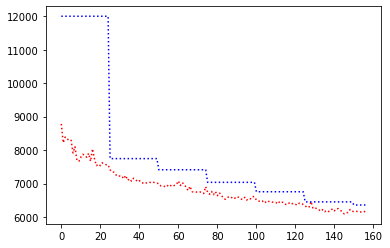

record the last path to gazebo for showing up


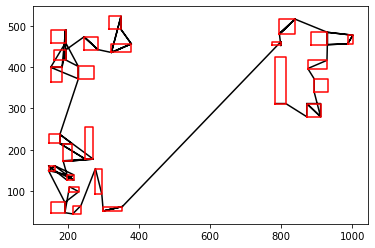

epoch:6, batch:800/2500, reward:6096.07373046875


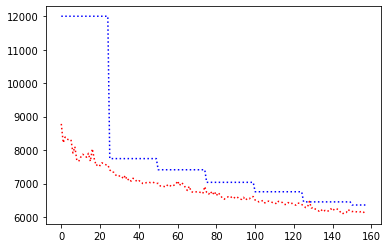

record the last path to gazebo for showing up


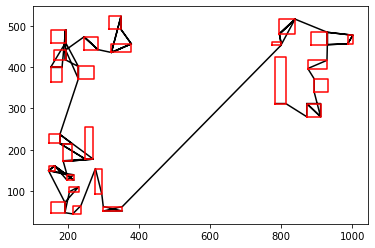

epoch:6, batch:900/2500, reward:6069.60205078125


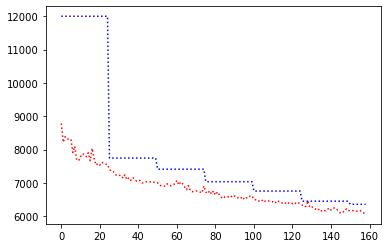

record the last path to gazebo for showing up


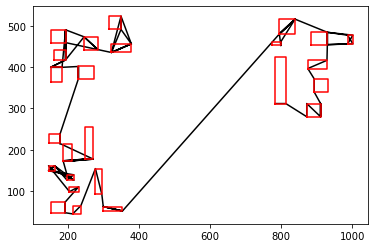

epoch:6, batch:1000/2500, reward:6039.9833984375


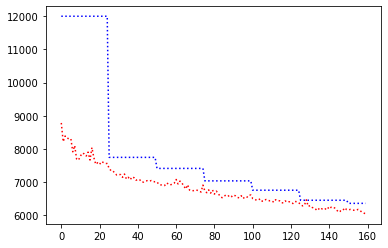

record the last path to gazebo for showing up


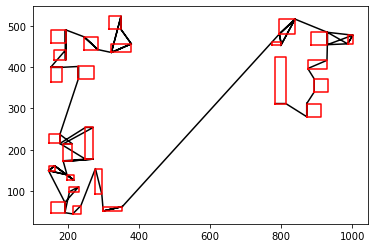

epoch:6, batch:1100/2500, reward:6087.2470703125


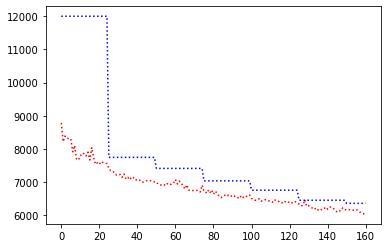

record the last path to gazebo for showing up


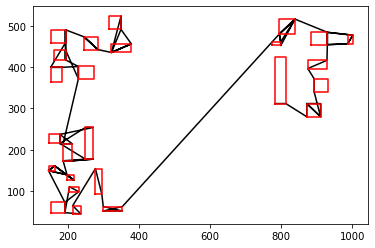

epoch:6, batch:1200/2500, reward:6090.220703125


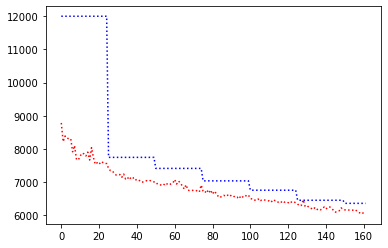

record the last path to gazebo for showing up


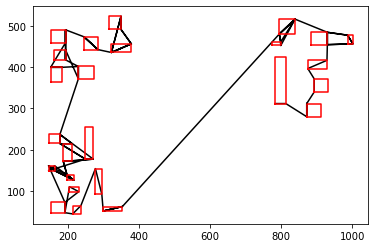

epoch:6, batch:1300/2500, reward:6064.14453125


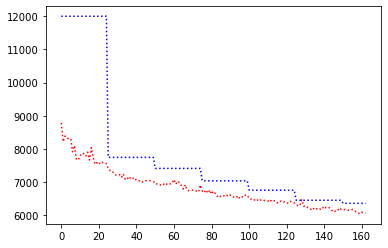

record the last path to gazebo for showing up


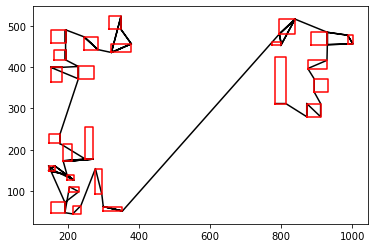

epoch:6, batch:1400/2500, reward:6044.11865234375


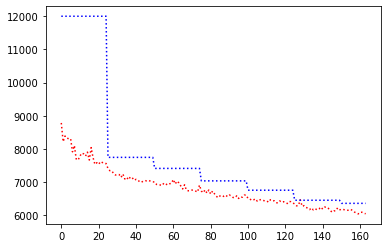

record the last path to gazebo for showing up


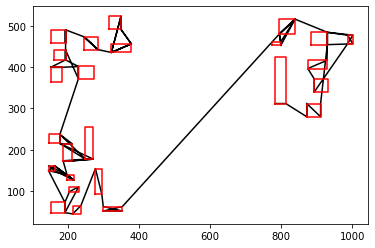

epoch:6, batch:1500/2500, reward:6028.4697265625


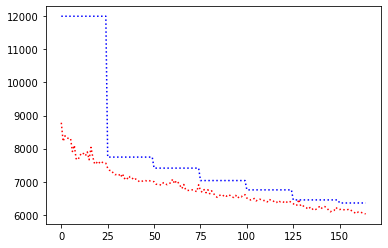

record the last path to gazebo for showing up


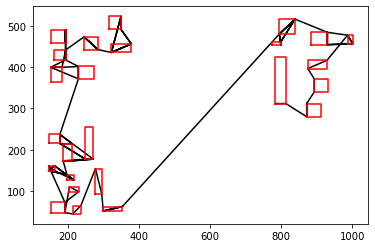

epoch:6, batch:1600/2500, reward:6032.71533203125


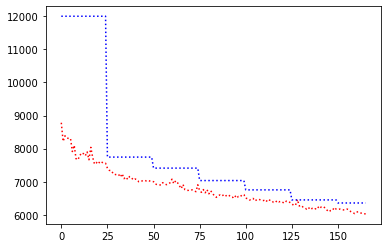

record the last path to gazebo for showing up


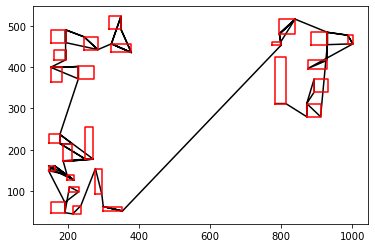

epoch:6, batch:1700/2500, reward:6074.7021484375


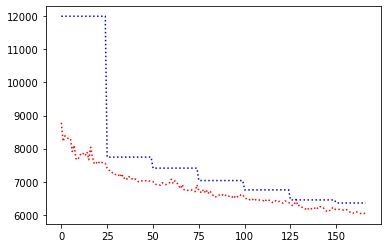

record the last path to gazebo for showing up


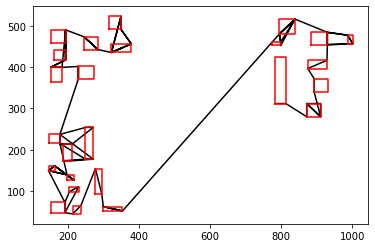

epoch:6, batch:1800/2500, reward:6033.4052734375


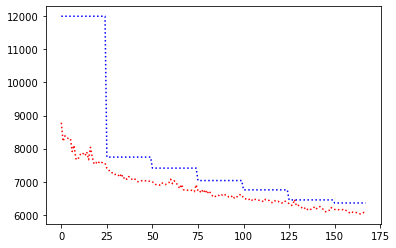

record the last path to gazebo for showing up


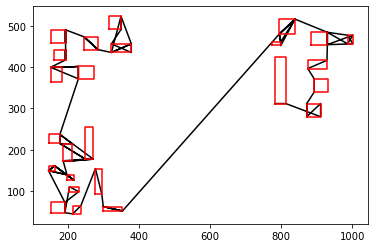

epoch:6, batch:1900/2500, reward:6061.60107421875


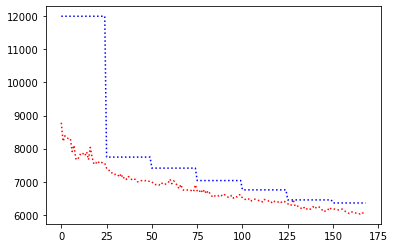

record the last path to gazebo for showing up


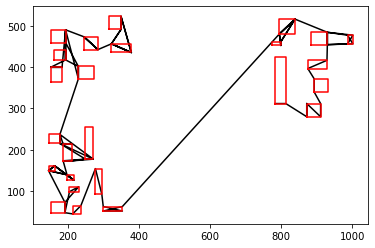

epoch:6, batch:2000/2500, reward:6032.44677734375


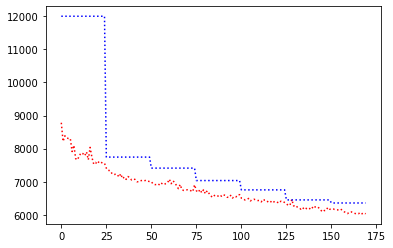

record the last path to gazebo for showing up


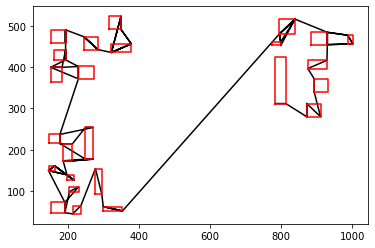

epoch:6, batch:2100/2500, reward:6076.27783203125


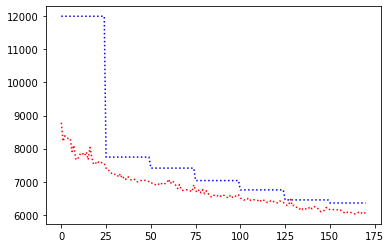

record the last path to gazebo for showing up


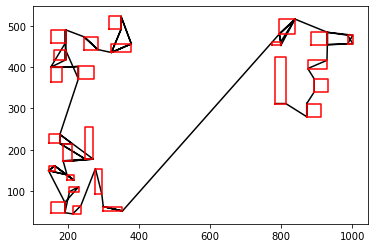

epoch:6, batch:2200/2500, reward:6053.8857421875


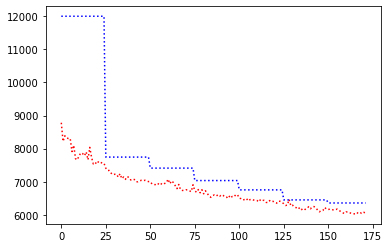

record the last path to gazebo for showing up


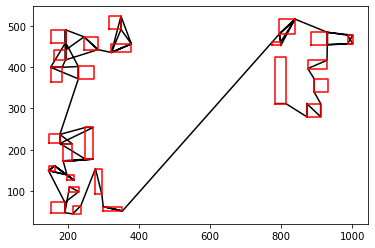

epoch:6, batch:2300/2500, reward:6066.6162109375


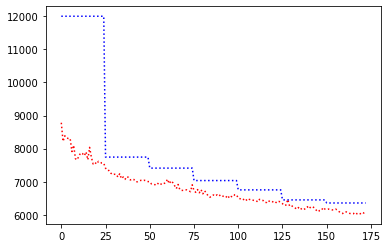

record the last path to gazebo for showing up


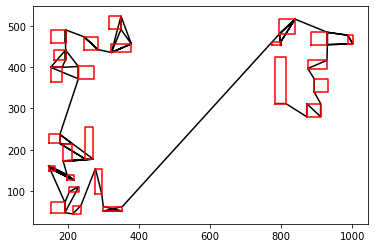

epoch:6, batch:2400/2500, reward:6036.61474609375


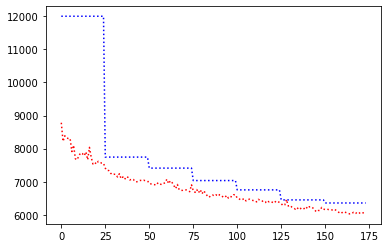

record the last path to gazebo for showing up


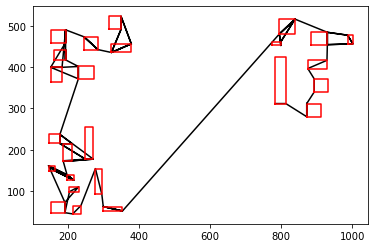

epoch:6, batch:2500/2500, reward:6495.63623046875


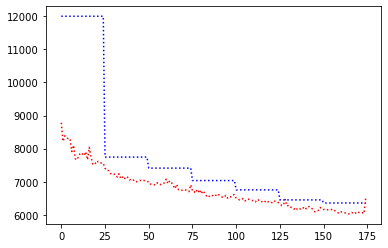

record the last path to gazebo for showing up


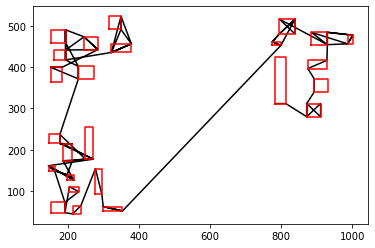

R_val =  tensor(7237.4570, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(7237.4570, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(7237.4570, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(7237.4570, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(7237.4570, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
Avg Actor 7237.45703125 --- Avg Critic 6358.671875
Epoch: 6, epoch time: 58.763min, tot time: 0.287day, L_actor: 7237.457, L_critic: 6358.672, update: False
Save Checkpoints
epoch:7, batch:100/2500, reward:6211.42578125


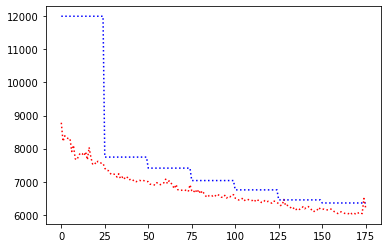

record the last path to gazebo for showing up


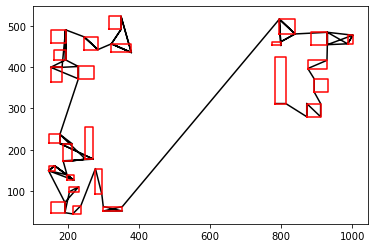

epoch:7, batch:200/2500, reward:6172.6787109375


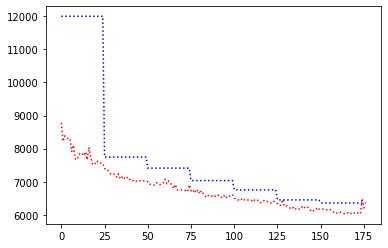

record the last path to gazebo for showing up


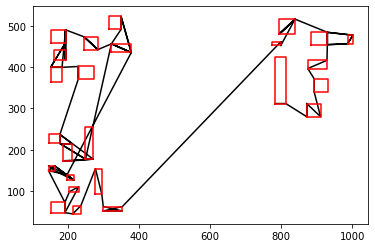

epoch:7, batch:300/2500, reward:6141.2607421875


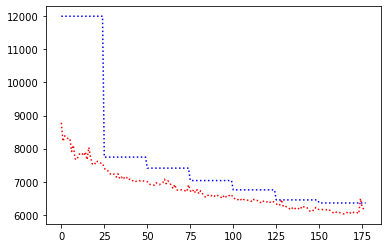

record the last path to gazebo for showing up


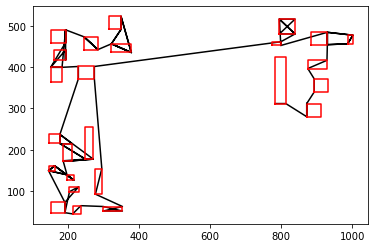

epoch:7, batch:400/2500, reward:6187.4189453125


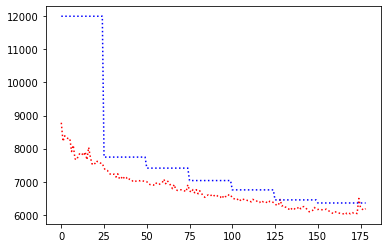

record the last path to gazebo for showing up


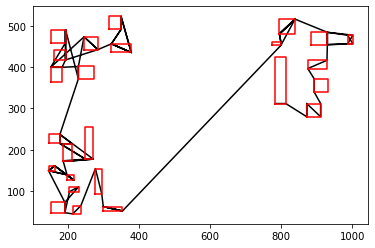

epoch:7, batch:500/2500, reward:6135.5498046875


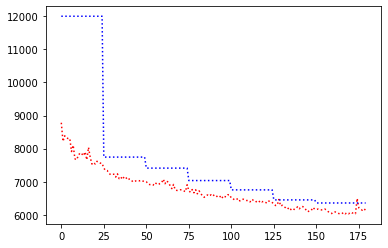

record the last path to gazebo for showing up


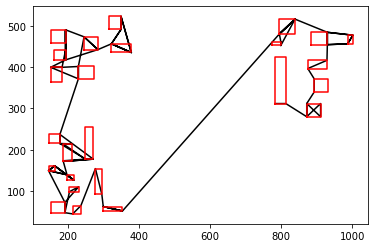

epoch:7, batch:600/2500, reward:6125.2646484375


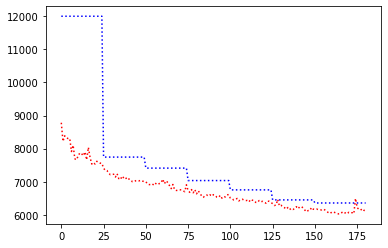

record the last path to gazebo for showing up


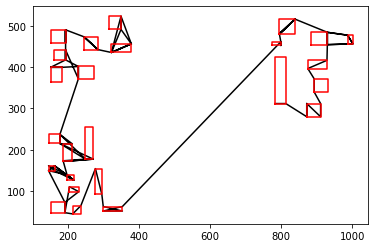

epoch:7, batch:700/2500, reward:6160.9423828125


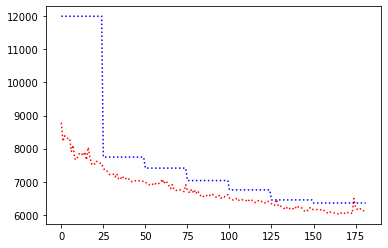

record the last path to gazebo for showing up


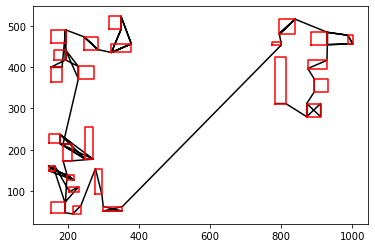

epoch:7, batch:800/2500, reward:6125.74609375


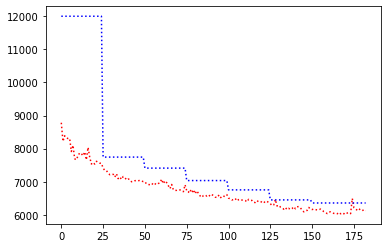

record the last path to gazebo for showing up


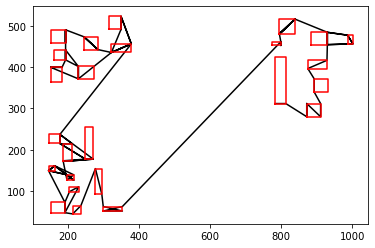

epoch:7, batch:900/2500, reward:6153.7724609375


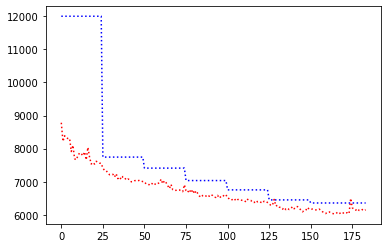

record the last path to gazebo for showing up


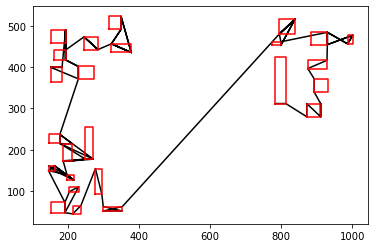

epoch:7, batch:1000/2500, reward:6110.990234375


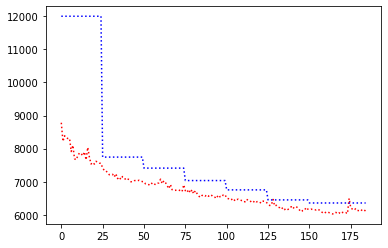

record the last path to gazebo for showing up


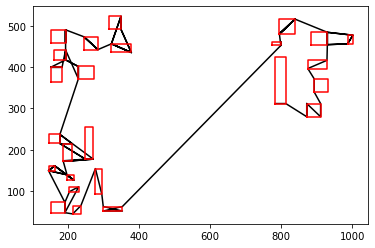

epoch:7, batch:1100/2500, reward:6132.44140625


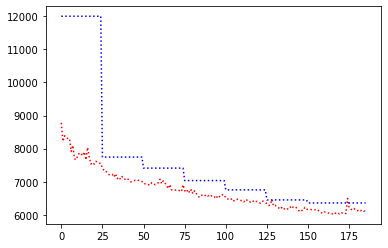

record the last path to gazebo for showing up


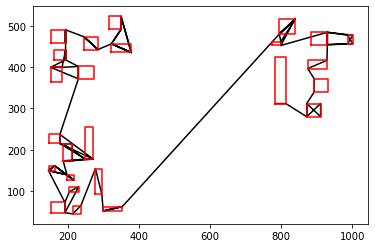

epoch:7, batch:1200/2500, reward:6121.18408203125


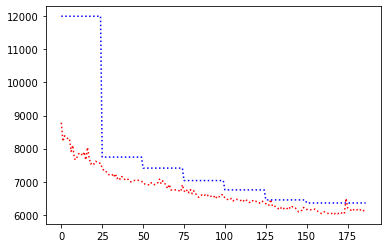

record the last path to gazebo for showing up


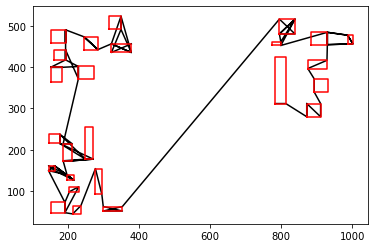

epoch:7, batch:1300/2500, reward:6122.43359375


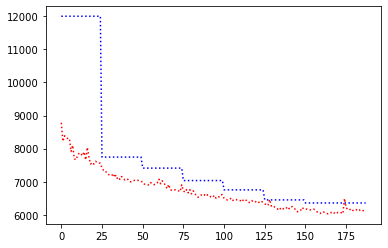

record the last path to gazebo for showing up


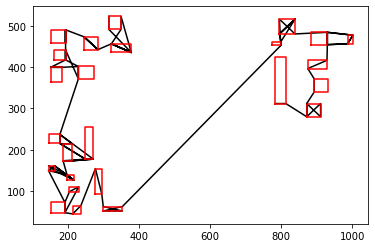

epoch:7, batch:1400/2500, reward:6118.0927734375


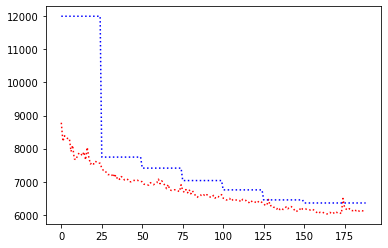

record the last path to gazebo for showing up


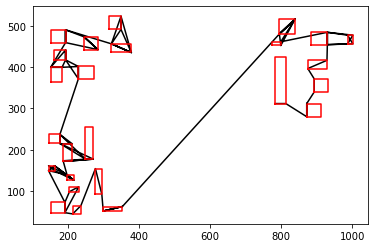

epoch:7, batch:1500/2500, reward:6122.6162109375


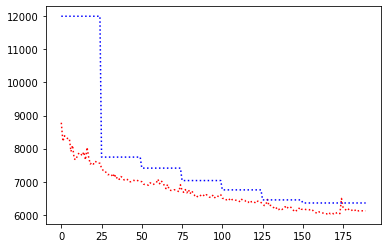

record the last path to gazebo for showing up


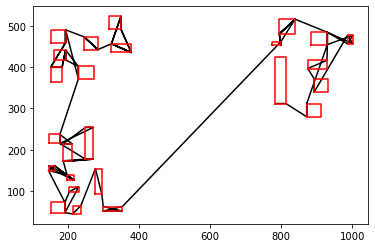

epoch:7, batch:1600/2500, reward:6070.01025390625


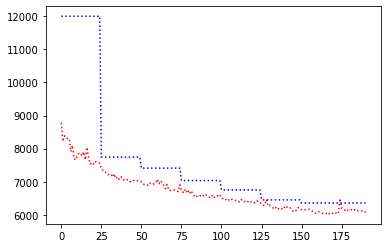

record the last path to gazebo for showing up


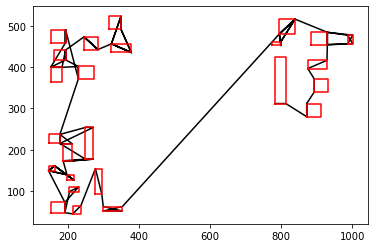

epoch:7, batch:1700/2500, reward:6131.7529296875


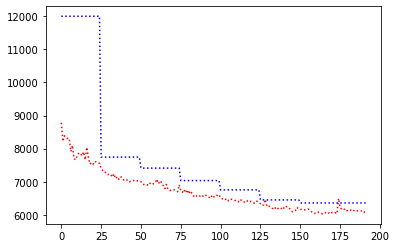

record the last path to gazebo for showing up


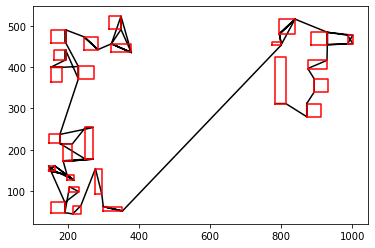

epoch:7, batch:1800/2500, reward:6092.3662109375


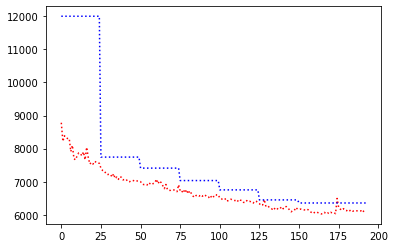

record the last path to gazebo for showing up


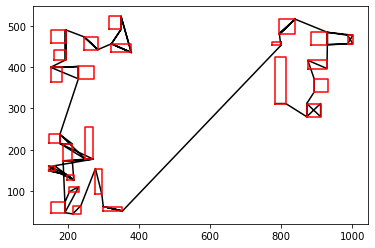

epoch:7, batch:1900/2500, reward:6154.068359375


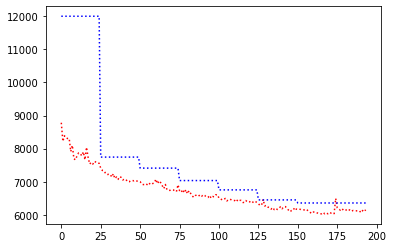

record the last path to gazebo for showing up


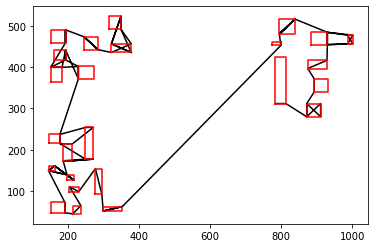

epoch:7, batch:2000/2500, reward:6118.5986328125


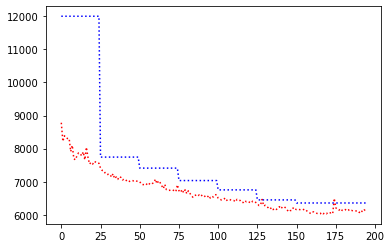

record the last path to gazebo for showing up


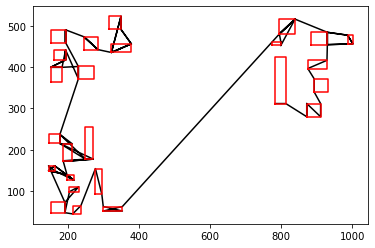

epoch:7, batch:2100/2500, reward:6143.9111328125


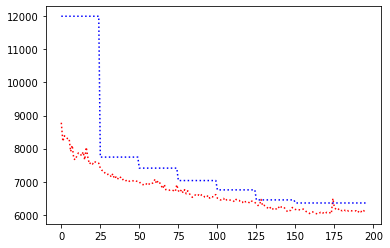

record the last path to gazebo for showing up


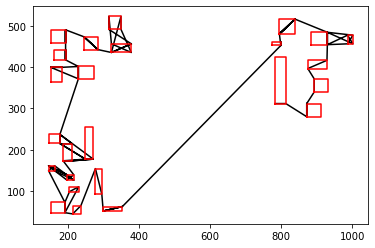

epoch:7, batch:2200/2500, reward:6087.28564453125


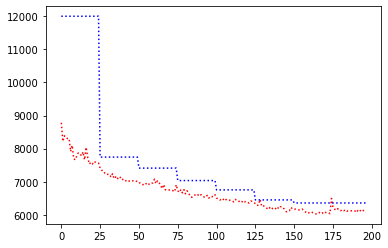

record the last path to gazebo for showing up


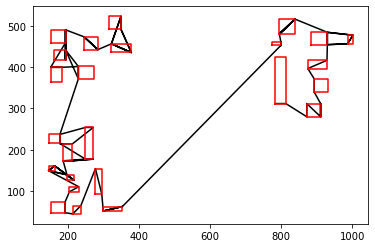

epoch:7, batch:2300/2500, reward:6109.841796875


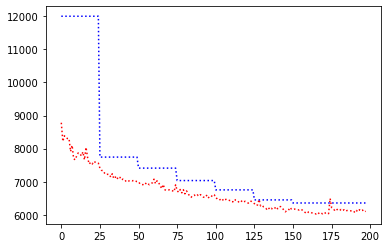

record the last path to gazebo for showing up


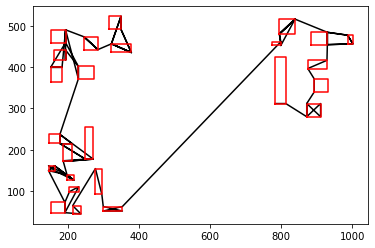

epoch:7, batch:2400/2500, reward:6078.77734375


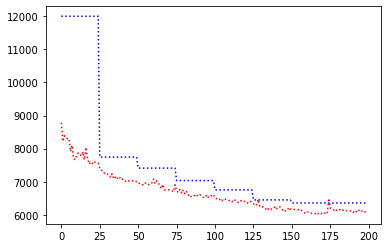

record the last path to gazebo for showing up


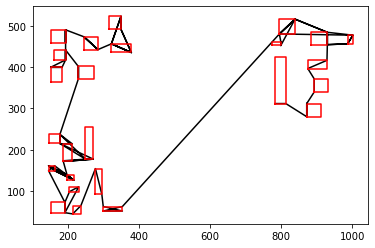

epoch:7, batch:2500/2500, reward:6071.01708984375


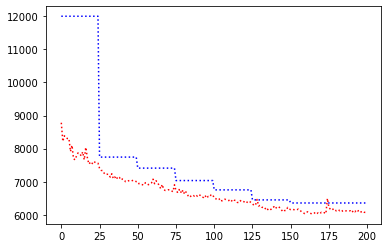

record the last path to gazebo for showing up


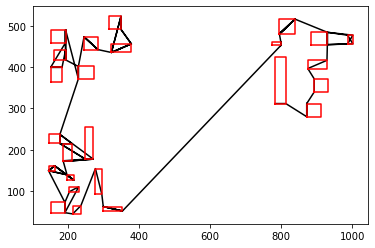

R_val =  tensor(6279.2842, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(6279.2842, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(6279.2842, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(6279.2842, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
R_val =  tensor(6279.2842, device='cuda:0')
C_val =  tensor(6358.6719, device='cuda:0')
Avg Actor 6279.2841796875 --- Avg Critic 6358.671875
My actor is going on the right road Hallelujah :) Updated
Epoch: 7, epoch time: 59.162min, tot time: 0.329day, L_actor: 6279.284, L_critic: 6358.672, update: True
Save Checkpoints
epoch:8, batch:100/2500, reward:6106.71533203125


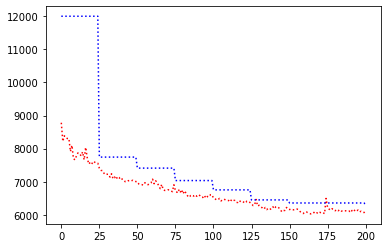

record the last path to gazebo for showing up


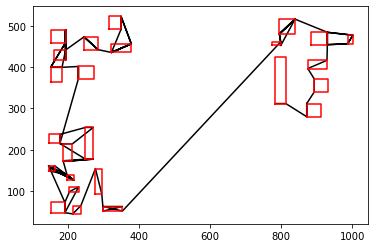

epoch:8, batch:200/2500, reward:6068.896484375


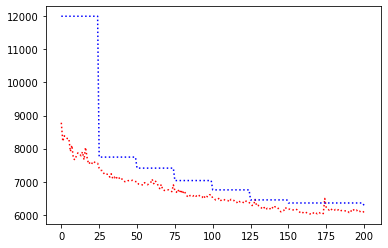

record the last path to gazebo for showing up


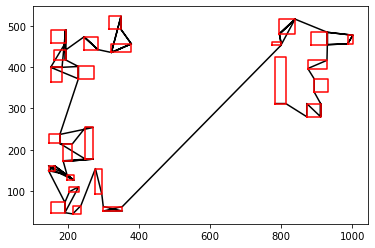

epoch:8, batch:300/2500, reward:6098.1708984375


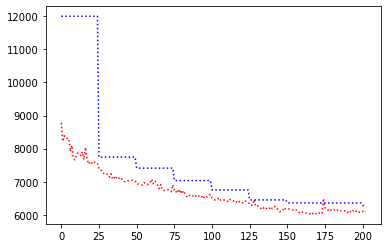

record the last path to gazebo for showing up


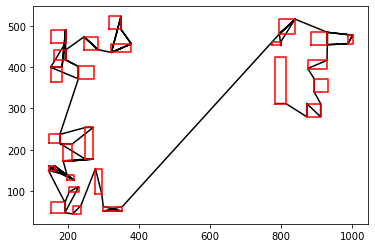

epoch:8, batch:400/2500, reward:6068.19287109375


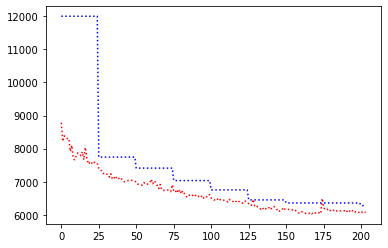

record the last path to gazebo for showing up


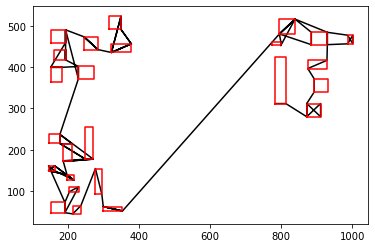

epoch:8, batch:500/2500, reward:6064.01171875


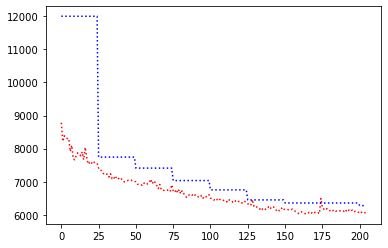

record the last path to gazebo for showing up


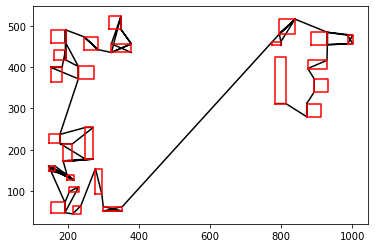

epoch:8, batch:600/2500, reward:6089.38671875


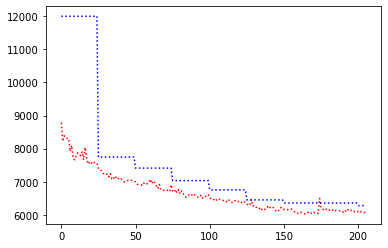

record the last path to gazebo for showing up


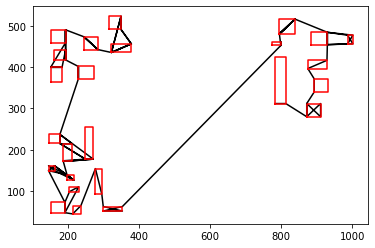

epoch:8, batch:700/2500, reward:6084.93359375


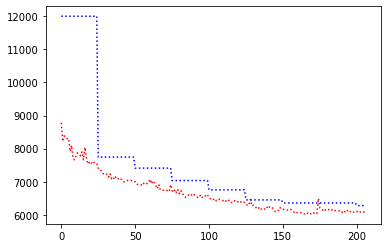

record the last path to gazebo for showing up


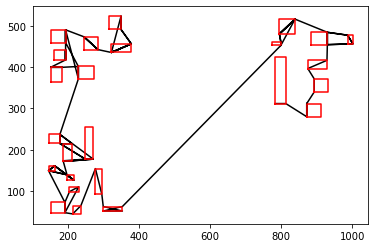

epoch:8, batch:800/2500, reward:6135.58203125


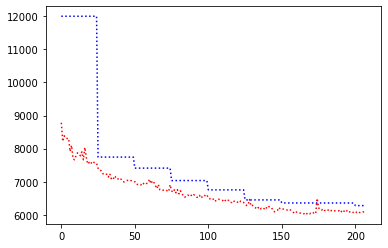

record the last path to gazebo for showing up


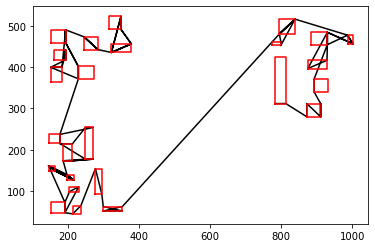

epoch:8, batch:900/2500, reward:6132.486328125


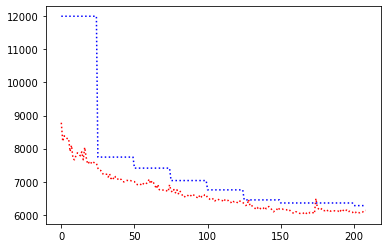

record the last path to gazebo for showing up


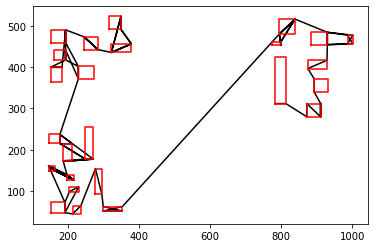

epoch:8, batch:1000/2500, reward:6119.06005859375


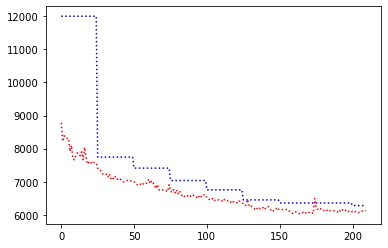

record the last path to gazebo for showing up


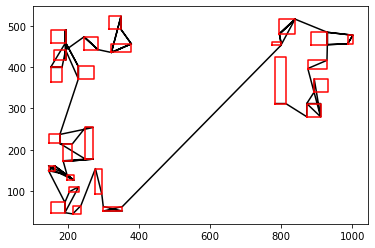

epoch:8, batch:1100/2500, reward:6108.86328125


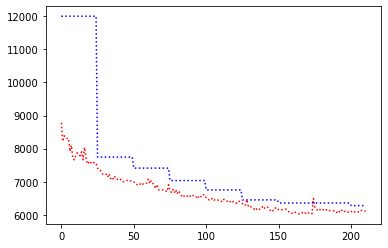

record the last path to gazebo for showing up


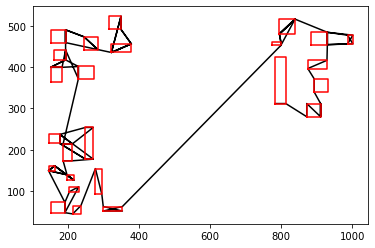

epoch:8, batch:1200/2500, reward:6121.86328125


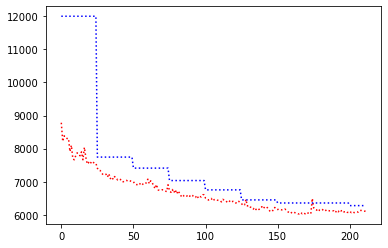

record the last path to gazebo for showing up


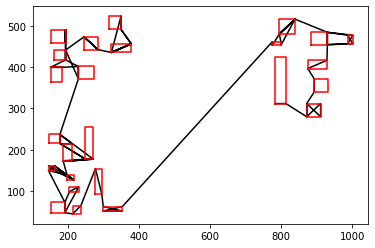

epoch:8, batch:1300/2500, reward:6120.6064453125


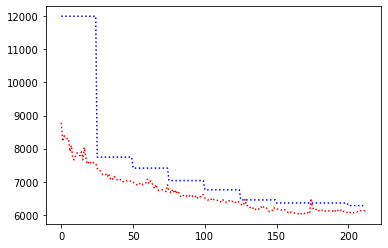

record the last path to gazebo for showing up


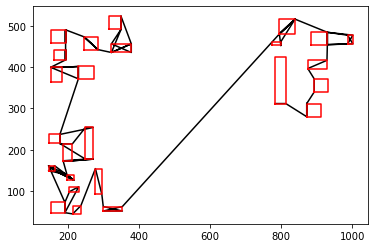

epoch:8, batch:1400/2500, reward:6102.9931640625


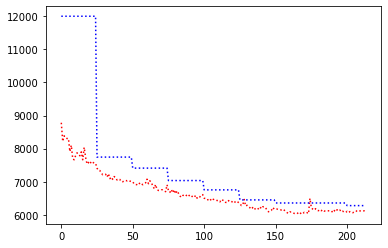

record the last path to gazebo for showing up


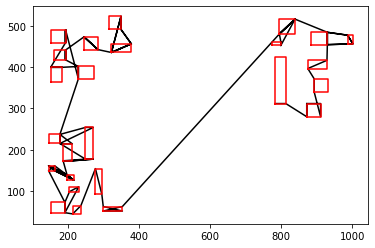

epoch:8, batch:1500/2500, reward:6085.677734375


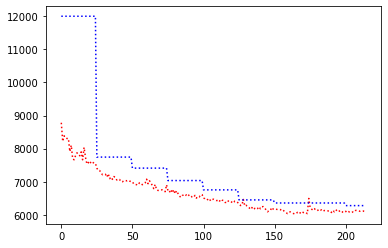

record the last path to gazebo for showing up


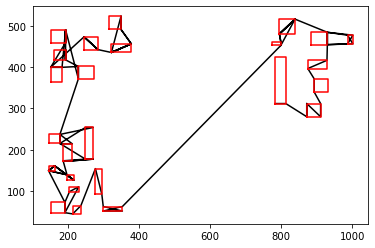

epoch:8, batch:1600/2500, reward:6096.970703125


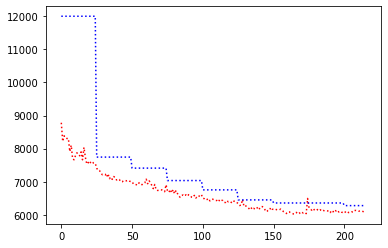

record the last path to gazebo for showing up


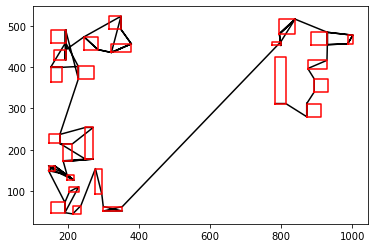

epoch:8, batch:1700/2500, reward:6097.56982421875


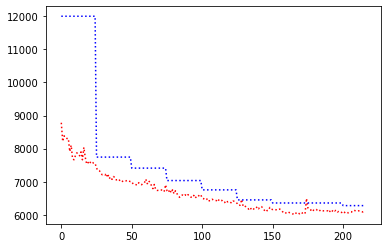

record the last path to gazebo for showing up


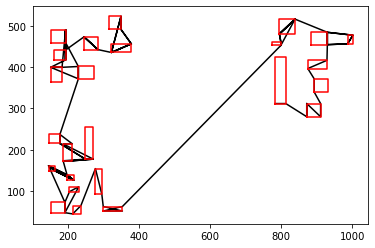

epoch:8, batch:1800/2500, reward:6092.3359375


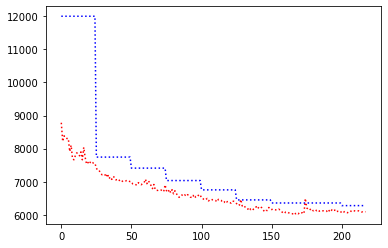

record the last path to gazebo for showing up


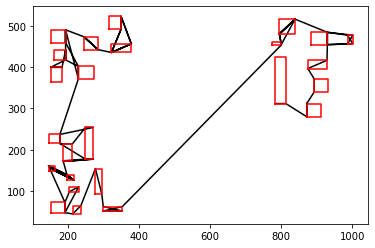

epoch:8, batch:1900/2500, reward:6059.7001953125


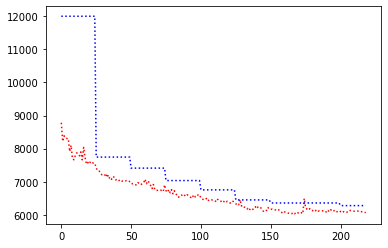

record the last path to gazebo for showing up


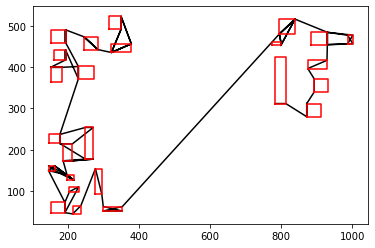

epoch:8, batch:2000/2500, reward:6062.0400390625


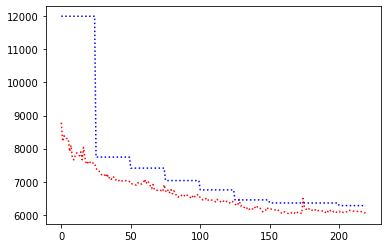

record the last path to gazebo for showing up


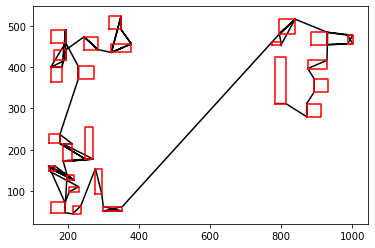

epoch:8, batch:2100/2500, reward:6085.9931640625


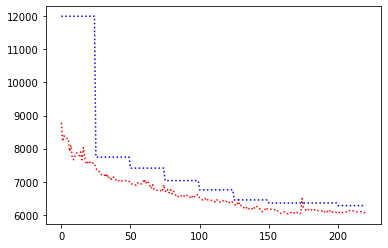

record the last path to gazebo for showing up


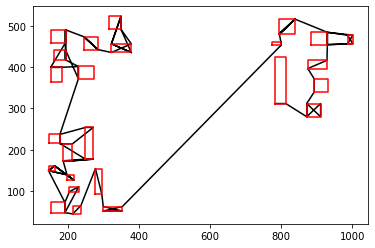

epoch:8, batch:2200/2500, reward:6073.30322265625


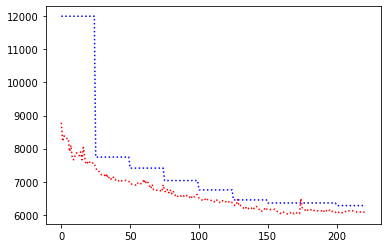

record the last path to gazebo for showing up


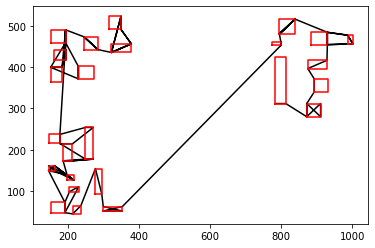

epoch:8, batch:2300/2500, reward:6091.21875


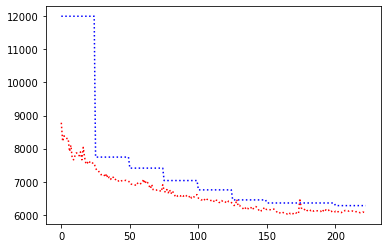

record the last path to gazebo for showing up


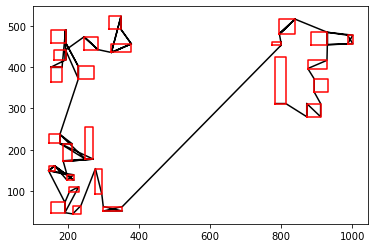

epoch:8, batch:2400/2500, reward:6074.1474609375


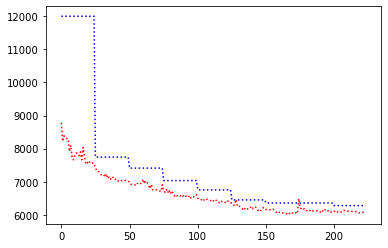

record the last path to gazebo for showing up


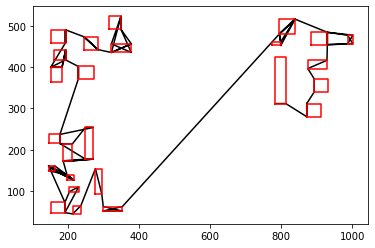

epoch:8, batch:2500/2500, reward:6100.0322265625


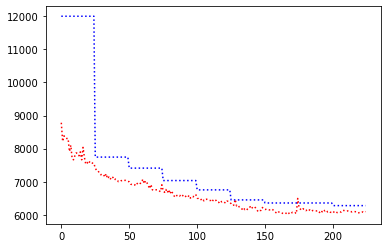

record the last path to gazebo for showing up


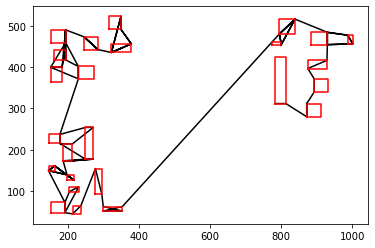

R_val =  tensor(6214.9531, device='cuda:0')
C_val =  tensor(6279.2842, device='cuda:0')
R_val =  tensor(6214.9531, device='cuda:0')
C_val =  tensor(6279.2842, device='cuda:0')
R_val =  tensor(6214.9531, device='cuda:0')
C_val =  tensor(6279.2842, device='cuda:0')
R_val =  tensor(6214.9531, device='cuda:0')
C_val =  tensor(6279.2842, device='cuda:0')
R_val =  tensor(6214.9531, device='cuda:0')
C_val =  tensor(6279.2842, device='cuda:0')
Avg Actor 6214.953125 --- Avg Critic 6279.2841796875
My actor is going on the right road Hallelujah :) Updated
Epoch: 8, epoch time: 58.638min, tot time: 0.370day, L_actor: 6214.953, L_critic: 6279.284, update: True
Save Checkpoints
epoch:9, batch:100/2500, reward:6062.5625


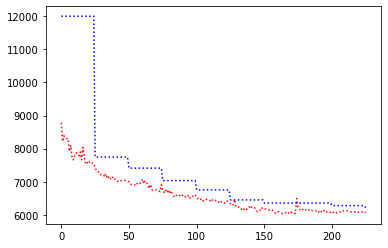

record the last path to gazebo for showing up


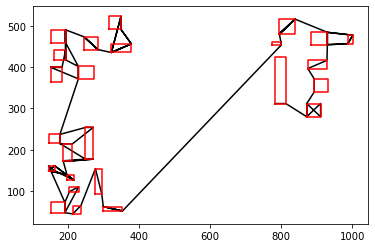

epoch:9, batch:200/2500, reward:6076.212890625


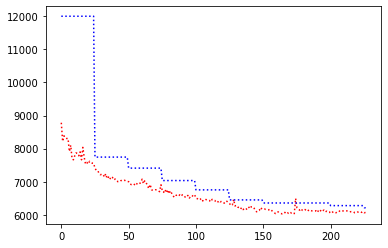

record the last path to gazebo for showing up


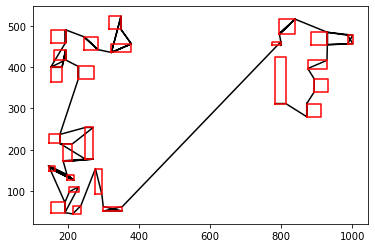

epoch:9, batch:300/2500, reward:6064.9609375


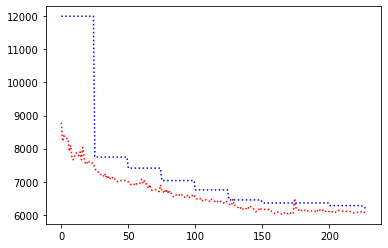

record the last path to gazebo for showing up


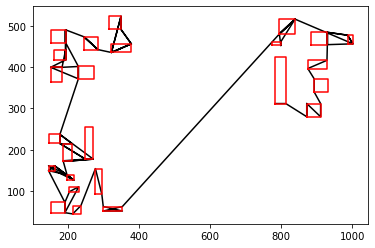

epoch:9, batch:400/2500, reward:6053.90234375


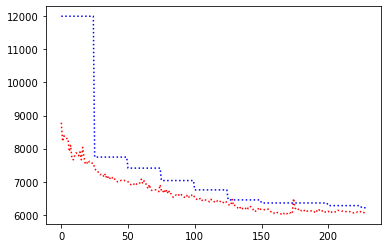

record the last path to gazebo for showing up


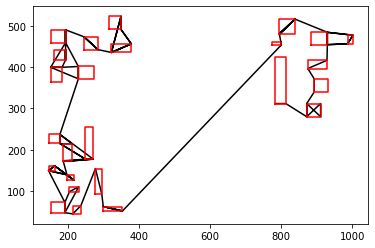

epoch:9, batch:500/2500, reward:6068.228515625


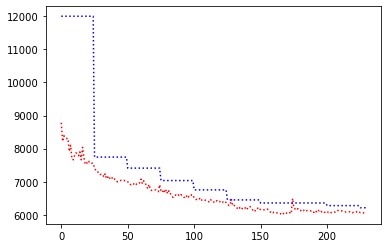

record the last path to gazebo for showing up


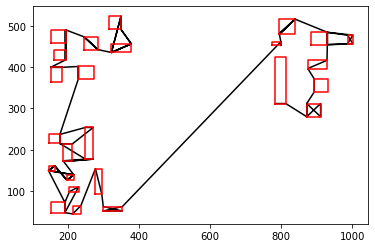

epoch:9, batch:600/2500, reward:6103.103515625


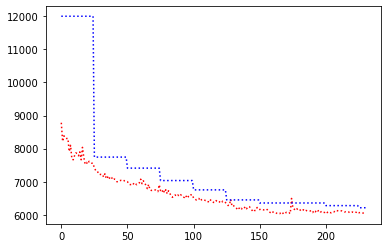

record the last path to gazebo for showing up


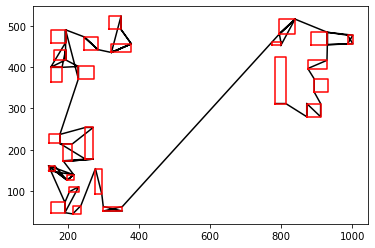

epoch:9, batch:700/2500, reward:6095.0693359375


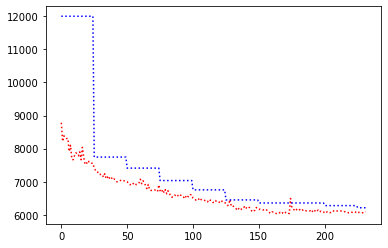

record the last path to gazebo for showing up


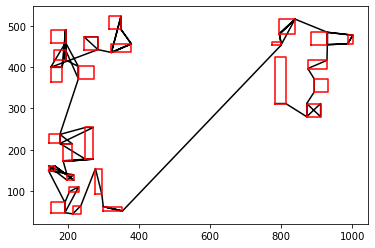

epoch:9, batch:800/2500, reward:6058.3759765625


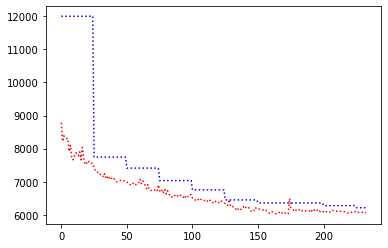

record the last path to gazebo for showing up


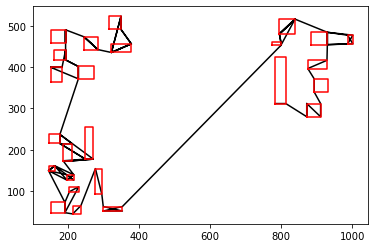

epoch:9, batch:900/2500, reward:6100.556640625


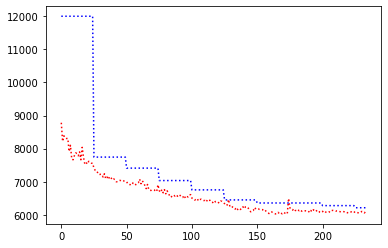

record the last path to gazebo for showing up


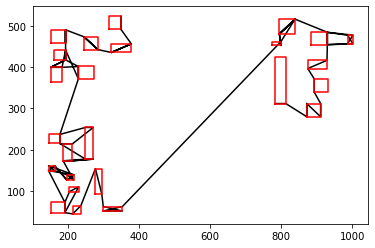

epoch:9, batch:1000/2500, reward:6076.67578125


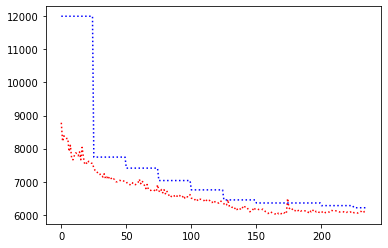

record the last path to gazebo for showing up


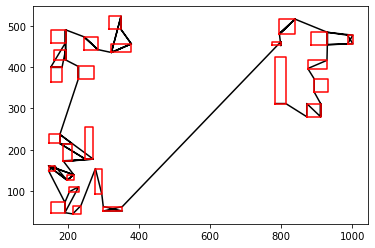

epoch:9, batch:1100/2500, reward:6090.111328125


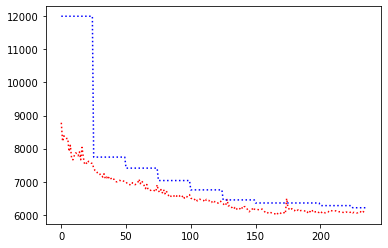

record the last path to gazebo for showing up


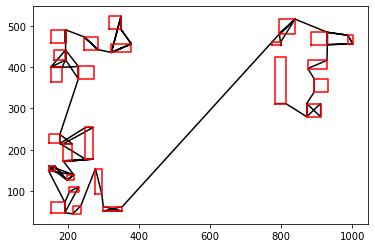

epoch:9, batch:1200/2500, reward:6033.3642578125


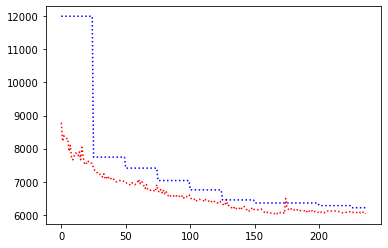

record the last path to gazebo for showing up


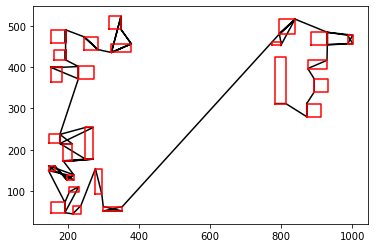

epoch:9, batch:1300/2500, reward:6085.181640625


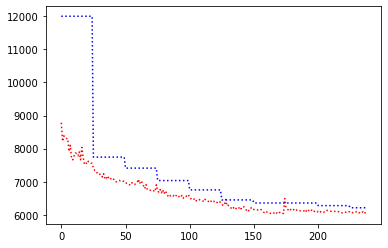

record the last path to gazebo for showing up


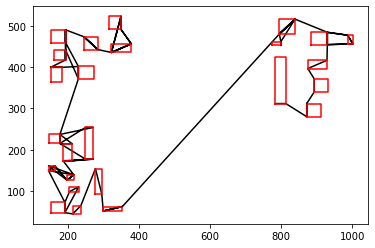

epoch:9, batch:1400/2500, reward:6036.04638671875


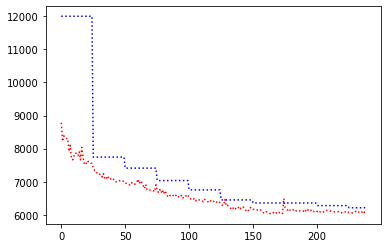

record the last path to gazebo for showing up


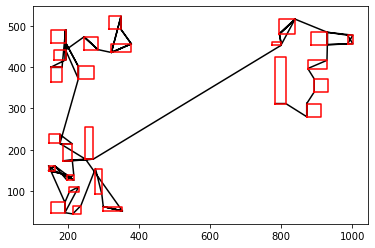

epoch:9, batch:1500/2500, reward:7331.4033203125


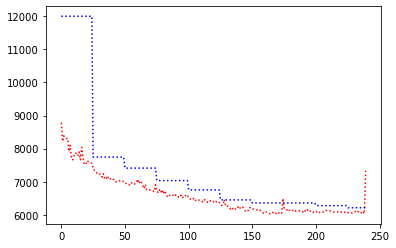

record the last path to gazebo for showing up


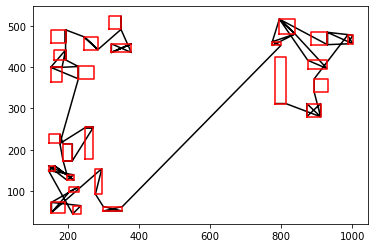

epoch:9, batch:1600/2500, reward:8001.330078125


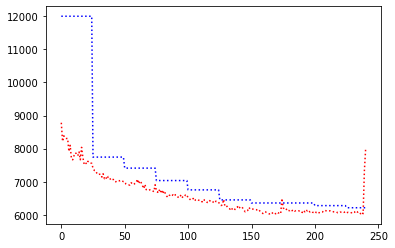

record the last path to gazebo for showing up


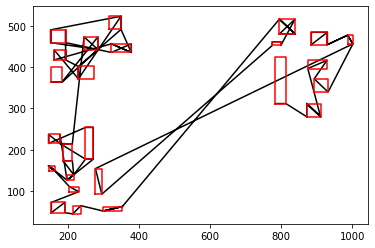

epoch:9, batch:1700/2500, reward:7886.86328125


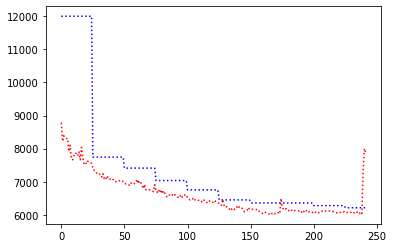

record the last path to gazebo for showing up


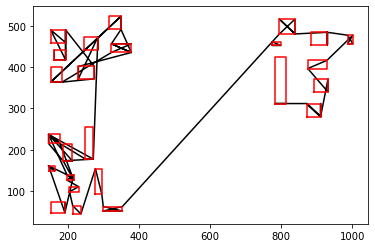

epoch:9, batch:1800/2500, reward:7566.0615234375


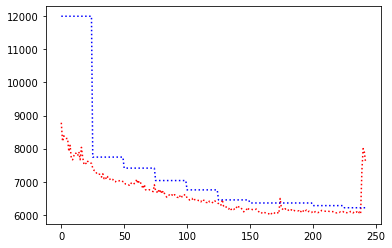

record the last path to gazebo for showing up


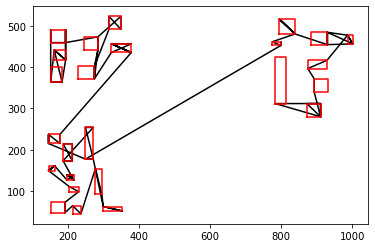

epoch:9, batch:1900/2500, reward:8134.158203125


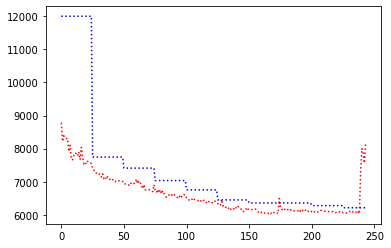

record the last path to gazebo for showing up


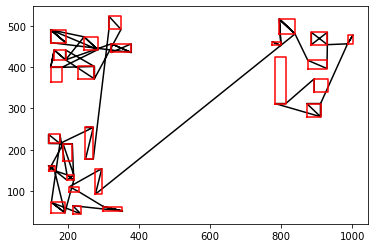

epoch:9, batch:2000/2500, reward:7254.2021484375


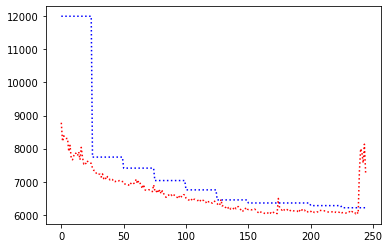

record the last path to gazebo for showing up


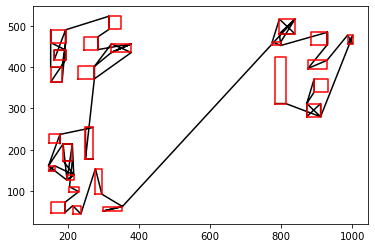

epoch:9, batch:2100/2500, reward:7197.03125


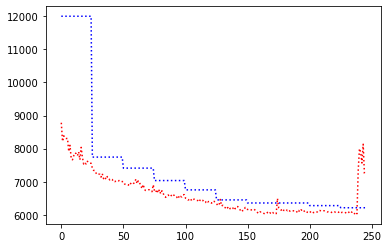

record the last path to gazebo for showing up


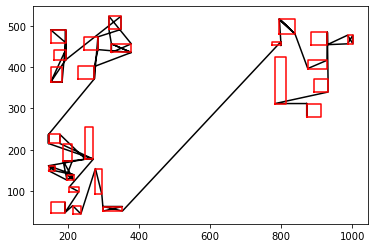

epoch:9, batch:2200/2500, reward:7218.9404296875


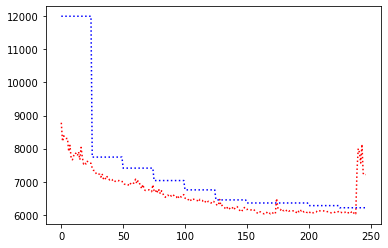

record the last path to gazebo for showing up


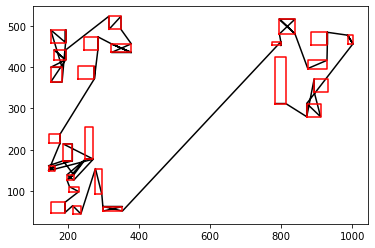

epoch:9, batch:2300/2500, reward:7229.8115234375


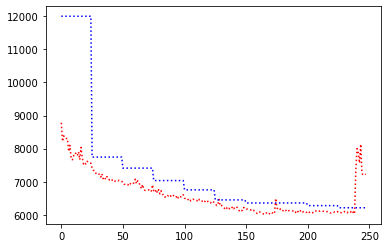

record the last path to gazebo for showing up


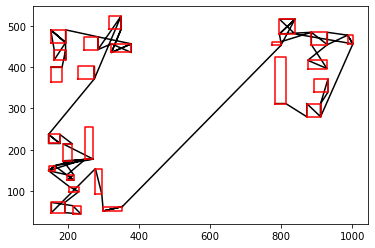

epoch:9, batch:2400/2500, reward:7242.0439453125


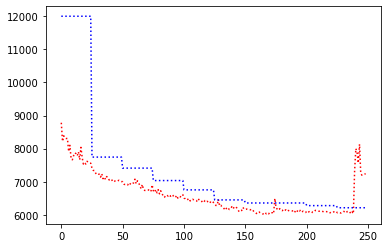

record the last path to gazebo for showing up


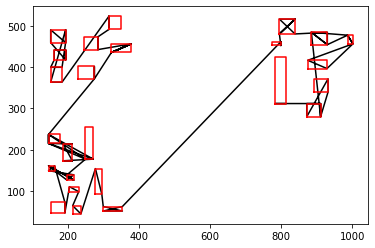

epoch:9, batch:2500/2500, reward:7178.1337890625


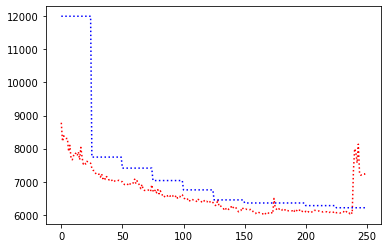

record the last path to gazebo for showing up


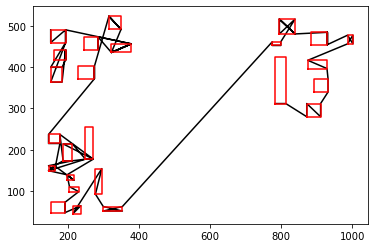

R_val =  tensor(7452.1899, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(7452.1899, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(7452.1899, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(7452.1899, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(7452.1899, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
Avg Actor 7452.18994140625 --- Avg Critic 6214.953125
Epoch: 9, epoch time: 59.081min, tot time: 0.411day, L_actor: 7452.190, L_critic: 6214.953, update: False
Save Checkpoints
epoch:10, batch:100/2500, reward:7124.9482421875


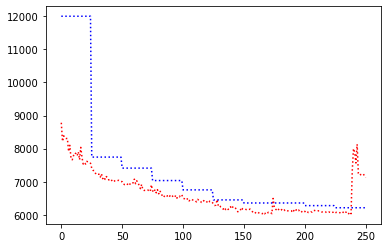

record the last path to gazebo for showing up


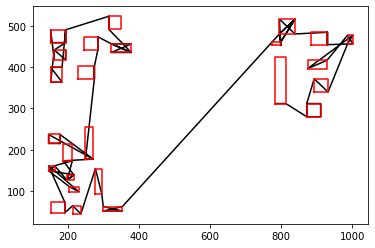

epoch:10, batch:200/2500, reward:7147.3203125


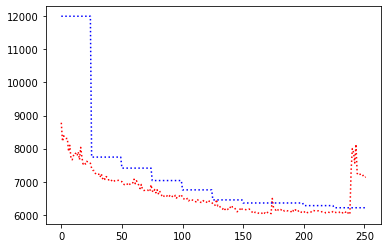

record the last path to gazebo for showing up


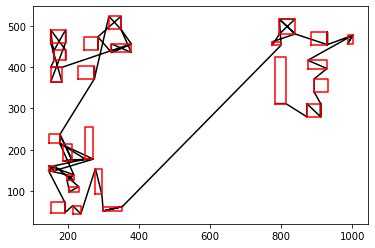

epoch:10, batch:300/2500, reward:7157.140625


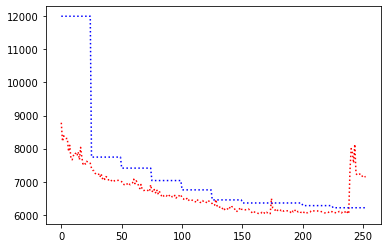

record the last path to gazebo for showing up


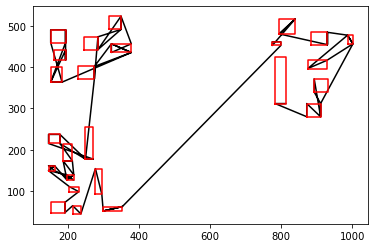

epoch:10, batch:400/2500, reward:7117.72314453125


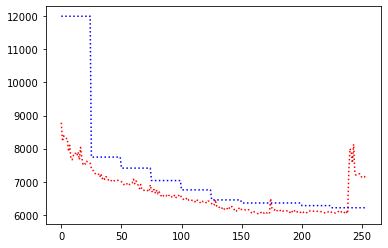

record the last path to gazebo for showing up


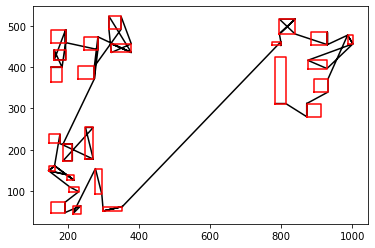

epoch:10, batch:500/2500, reward:7050.3642578125


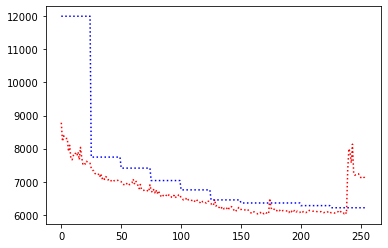

record the last path to gazebo for showing up


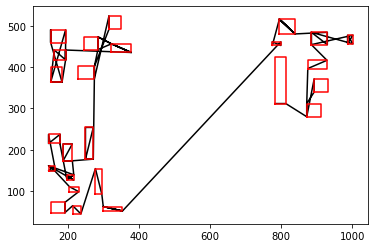

epoch:10, batch:600/2500, reward:7046.2861328125


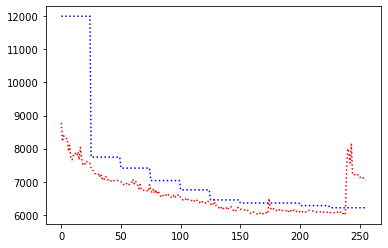

record the last path to gazebo for showing up


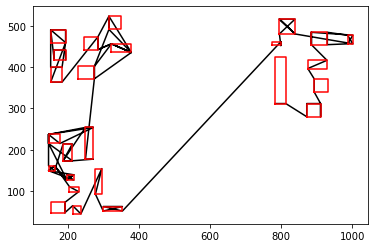

epoch:10, batch:700/2500, reward:7039.20458984375


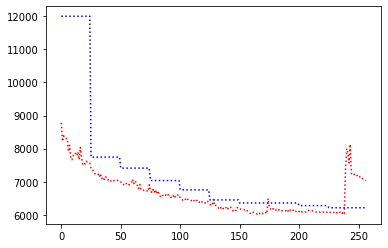

record the last path to gazebo for showing up


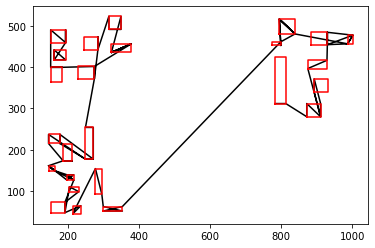

epoch:10, batch:800/2500, reward:7011.06005859375


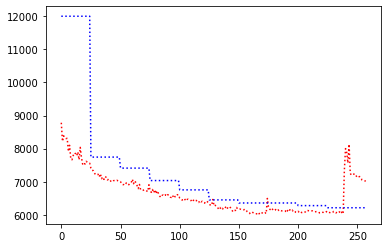

record the last path to gazebo for showing up


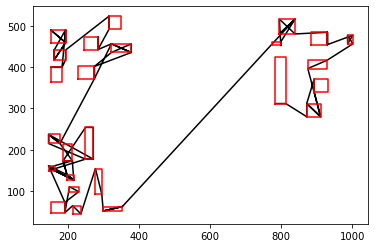

epoch:10, batch:900/2500, reward:7106.10498046875


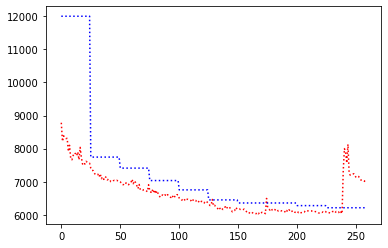

record the last path to gazebo for showing up


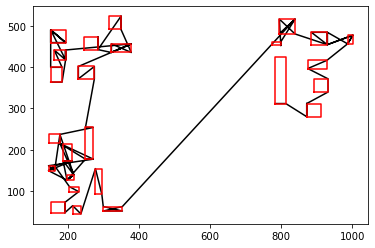

epoch:10, batch:1000/2500, reward:7007.919921875


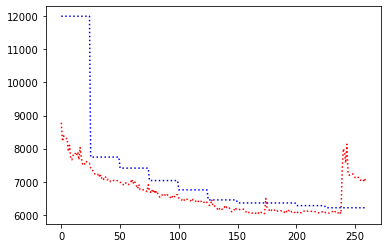

record the last path to gazebo for showing up


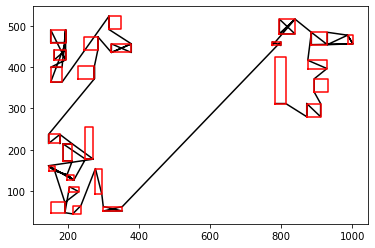

epoch:10, batch:1100/2500, reward:6941.5185546875


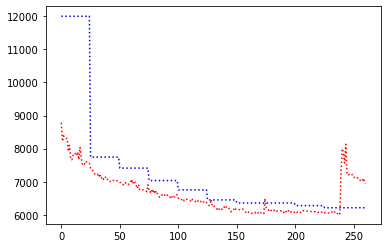

record the last path to gazebo for showing up


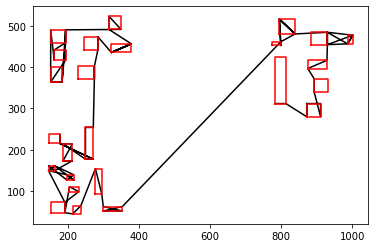

epoch:10, batch:1200/2500, reward:7054.3134765625


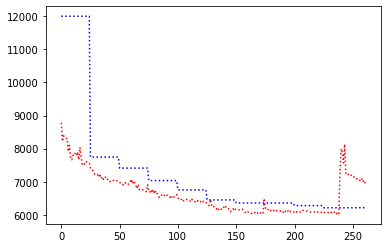

record the last path to gazebo for showing up


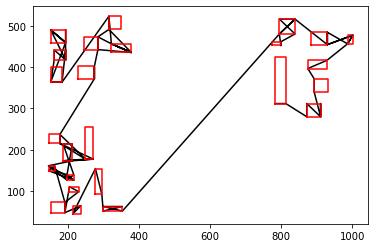

epoch:10, batch:1300/2500, reward:6971.076171875


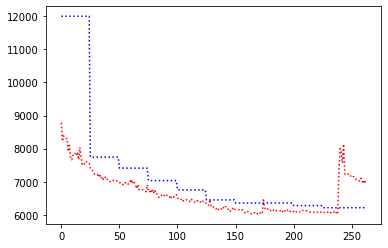

record the last path to gazebo for showing up


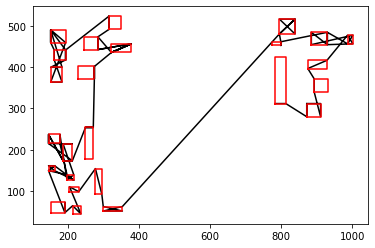

epoch:10, batch:1400/2500, reward:7017.44189453125


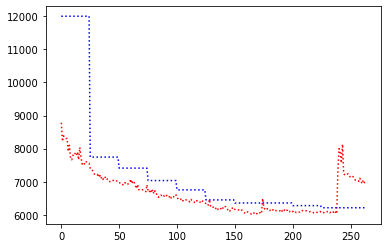

record the last path to gazebo for showing up


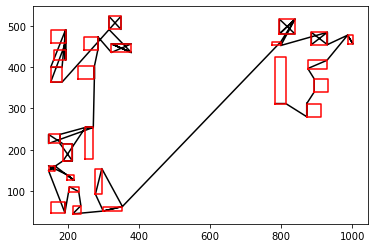

epoch:10, batch:1500/2500, reward:6879.53125


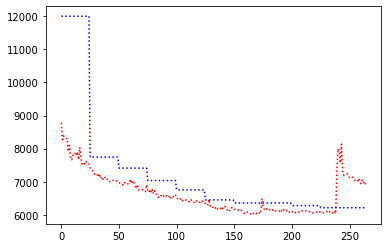

record the last path to gazebo for showing up


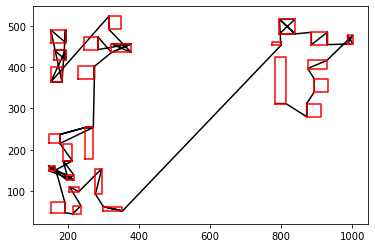

epoch:10, batch:1600/2500, reward:6704.6533203125


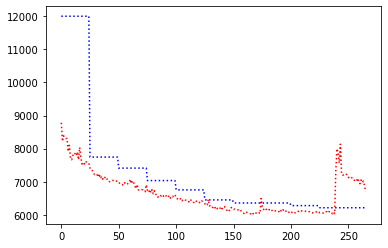

record the last path to gazebo for showing up


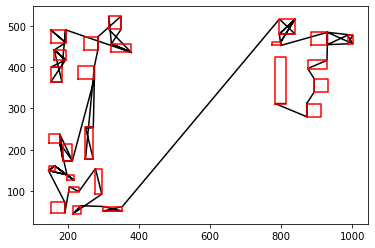

epoch:10, batch:1700/2500, reward:6647.43603515625


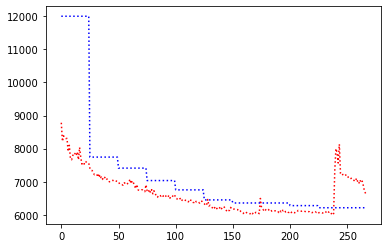

record the last path to gazebo for showing up


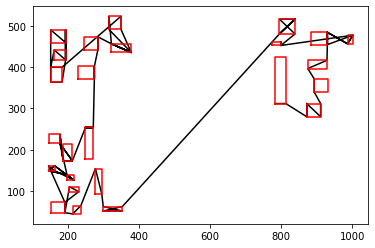

epoch:10, batch:1800/2500, reward:6670.998046875


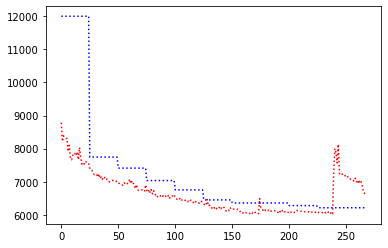

record the last path to gazebo for showing up


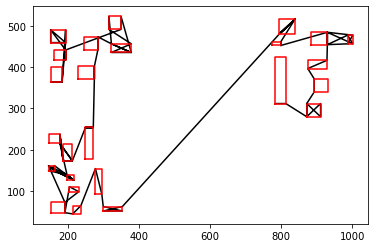

epoch:10, batch:1900/2500, reward:6600.9052734375


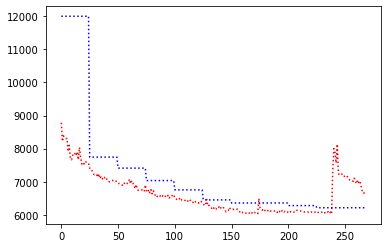

record the last path to gazebo for showing up


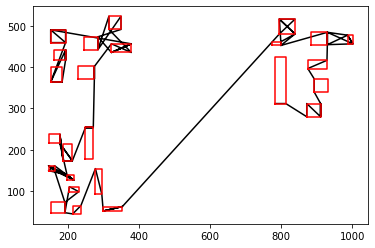

epoch:10, batch:2000/2500, reward:6560.09228515625


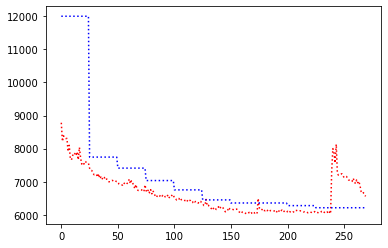

record the last path to gazebo for showing up


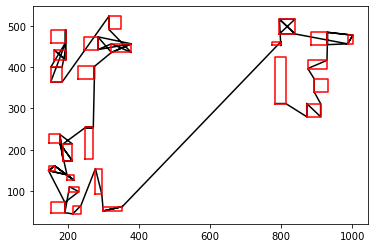

epoch:10, batch:2100/2500, reward:6574.470703125


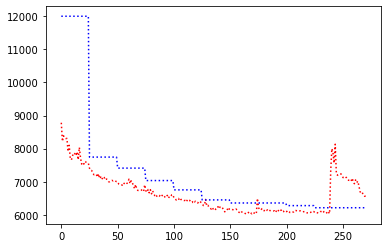

record the last path to gazebo for showing up


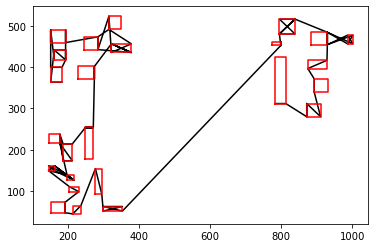

epoch:10, batch:2200/2500, reward:6556.1904296875


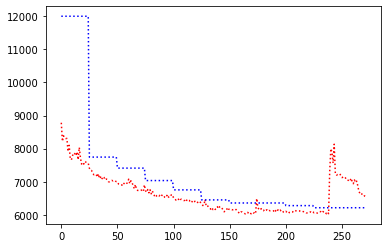

record the last path to gazebo for showing up


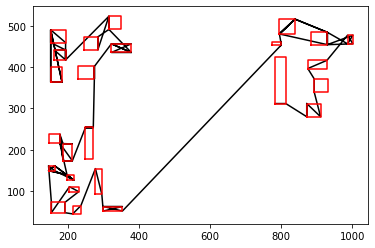

epoch:10, batch:2300/2500, reward:6594.6796875


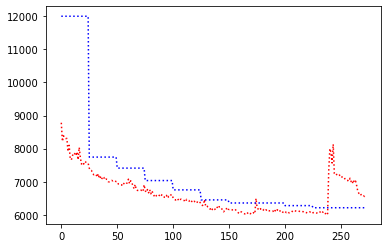

record the last path to gazebo for showing up


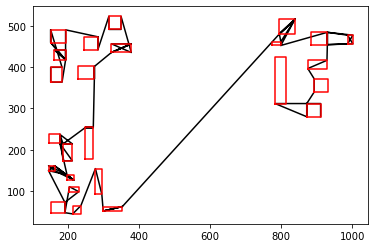

epoch:10, batch:2400/2500, reward:6563.9853515625


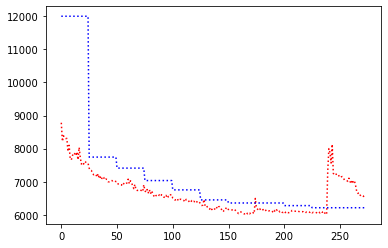

record the last path to gazebo for showing up


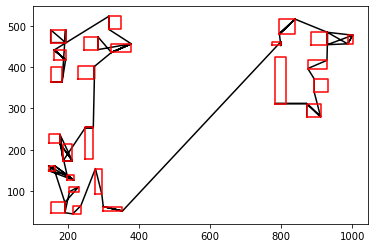

epoch:10, batch:2500/2500, reward:6532.291015625


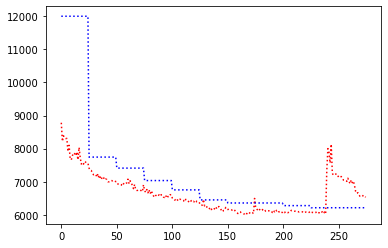

record the last path to gazebo for showing up


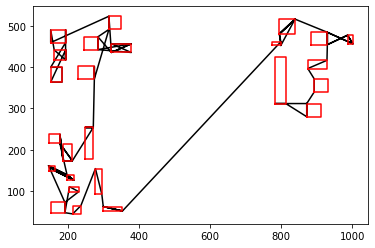

R_val =  tensor(6604.9585, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(6604.9585, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(6604.9585, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(6604.9585, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
R_val =  tensor(6604.9585, device='cuda:0')
C_val =  tensor(6214.9531, device='cuda:0')
Avg Actor 6604.95849609375 --- Avg Critic 6214.953125
Epoch: 10, epoch time: 58.866min, tot time: 0.452day, L_actor: 6604.958, L_critic: 6214.953, update: False
Save Checkpoints
epoch:11, batch:100/2500, reward:6498.8251953125


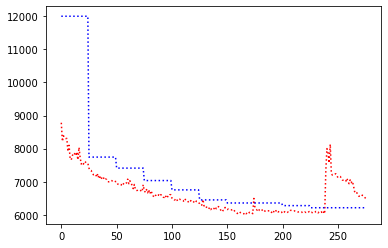

record the last path to gazebo for showing up


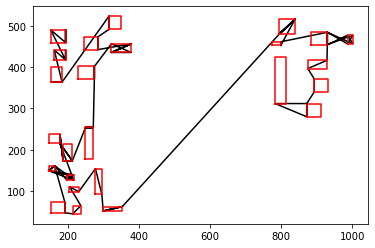

epoch:11, batch:200/2500, reward:6520.4248046875


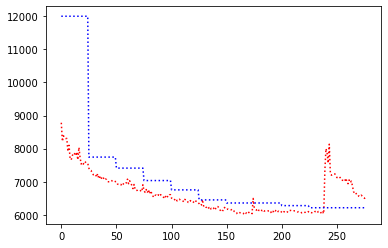

record the last path to gazebo for showing up


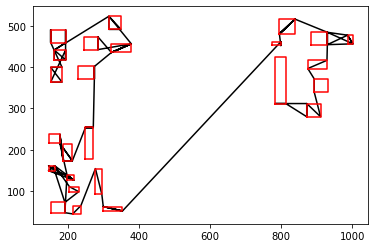

epoch:11, batch:300/2500, reward:6462.412109375


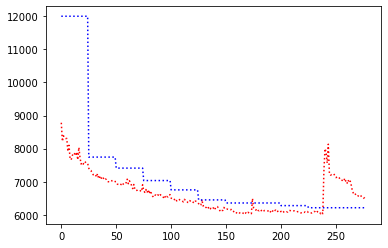

record the last path to gazebo for showing up


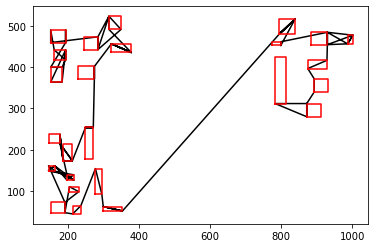

epoch:11, batch:400/2500, reward:6509.78125


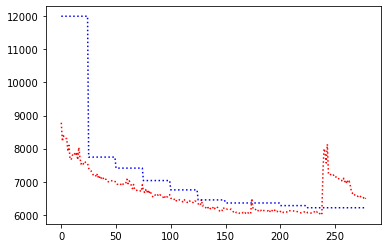

record the last path to gazebo for showing up


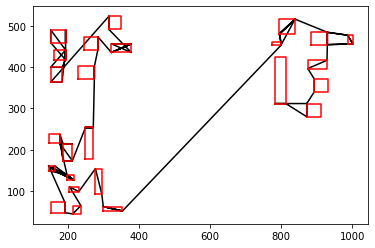

epoch:11, batch:500/2500, reward:6454.607421875


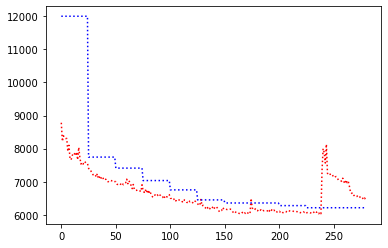

record the last path to gazebo for showing up


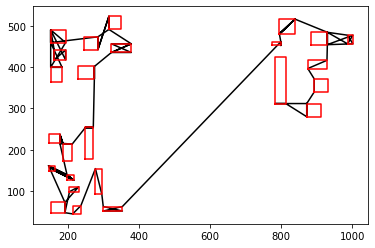

epoch:11, batch:600/2500, reward:6479.1689453125


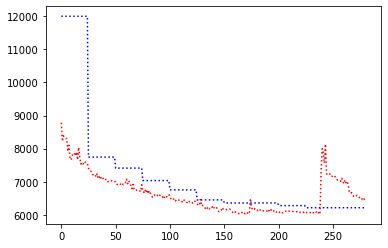

record the last path to gazebo for showing up


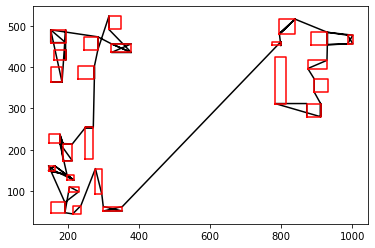

epoch:11, batch:700/2500, reward:6560.07763671875


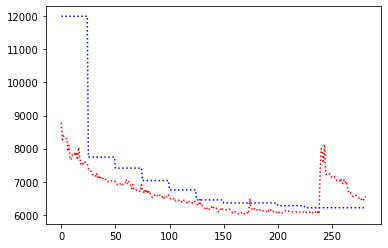

record the last path to gazebo for showing up


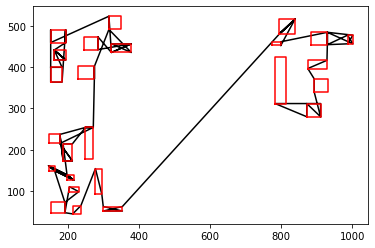

epoch:11, batch:800/2500, reward:6503.55078125


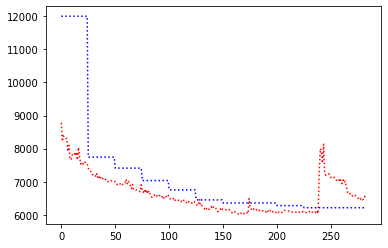

record the last path to gazebo for showing up


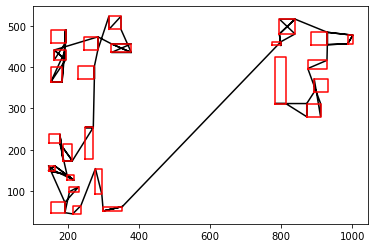

In [ ]:
import yaml
from torch.distributions.categorical import Categorical
# visualization
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
from tqdm import tqdm_notebook
import torch.nn.functional as F
####### my own import file ##########
from listofpathpoint import input_handler
import cnc_input
import copy
#from hybrid_models import HPN
####### my own import file ##########
'''
so, the models we have are TransEncoderNet,
                            Attention
                            LSTM
                            HPN
each one have initial parameters and the forward part, 
once we have the forward part, the back propagation will 
finished automatically by pytorch  
'''
TOL = 1e-3
TINY = 1e-15
learning_rate = 1e-4   #learning rate
B = 128          #batch size
B_valLoop = 5
steps = 2500
n_epoch = 100       # epochs
map_number = 0
record_actor = []
record_critic = []
dimension = 4
speed_of_nozzle = 30
range_of_wait = 10
scale_of_the_map = (800,500,speed_of_nozzle*range_of_wait)

print('======================')
print('prepare to train')
print('======================')
print('Hyper parameters:')
print('learning rate', learning_rate)
print('batch size', B)
print('steps', steps)
print('epoch', n_epoch)
print('======================')

'''
instantiate a training network and a baseline network
'''


try:
    del Actor  # remove existing model
    del Critic # remove existing model
except:
    pass
Actor = HPN(n_feature = dimension, n_hidden = 128)
Critic = HPN(n_feature = dimension, n_hidden = 128)
optimizer = optim.Adam(Actor.parameters(), lr=learning_rate)

# Putting Critic model on the eval mode
Actor = Actor.to(device)
Critic = Critic.to(device)
Critic.eval()

epoch_ckpt = 0
tot_time_ckpt = 0

val_mean = []
val_std = []
maplist = ['10&15data/25_chips/25_3corners.json'
          ,'10&15data/25_chips/25_3corners.json','10&15data/25_chips/25_3corners.json'\
          ,'10&15data/25_chips/25_3corners.json','10&15data/25_chips/25_3corners.json'\
          ,'10&15data/25_chips/25_3corners.json'
          ]
          
plot_performance_train = []
plot_performance_baseline = []
# recording the result of the resent epoch makes it available for future
#*********************# Uncomment these lines to load the previous check point
"""
checkpoint_file = "checkpoint/mutimap_20.pkl"
checkpoint = torch.load(checkpoint_file, map_location=device)
epoch_ckpt = checkpoint['epoch'] + 1
tot_time_ckpt = checkpoint['tot_time']
plot_performance_train = checkpoint['plot_performance_train']
plot_performance_baseline = checkpoint['plot_performance_baseline']
Critic.load_state_dict(checkpoint['model_baseline'])
Actor.load_state_dict(checkpoint['model_train'])
optimizer.load_state_dict(checkpoint['optimizer'])

print('Re-start training with saved checkpoint file={:s}\n  Checkpoint at epoch= {:d} and time={:.3f}min\n'.format(checkpoint_file,epoch_ckpt-1,tot_time_ckpt/60))
"""

#***********************# Uncomment these lines to load the previous check point

# Main training loop
# The core training concept mainly upon Sampling from the actor
# then taking the greedy action from the critic

start_training_time = time.time()
time_stamp = datetime.datetime.now().strftime("%y-%m-%d--%H-%M-%S") # Load the time stamp

C = 0       # baseline => the object which the actor can compare
R = 0       # reward
C_critic = torch.Tensor([12000])
if torch.cuda.is_available():
    C_critic = C_critic.cuda()
temp = input_handler(maplist[map_number])
X_temp, mask_list_num = temp.final_ver_points()
print(mask_list_num)
#change the waiting time to the distance that we can measure
size = len(X_temp)
zero_to_bsz = torch.arange(B, device = device) # a list contains 0 to (batch size -1)

for corner in X_temp:
    corner[dimension -2] *= speed_of_nozzle
size_rec = mask_list_num[-1]
print(size_rec)

X_temp = torch.FloatTensor(X_temp)
visit_count_initial = X_temp[:,3]
visit_count_rec = []
for i in range(0,len(visit_count_initial),4):
    visit_count_rec.append(int(visit_count_initial[i]))
X = X_temp.repeat(B,1,1)
if torch.cuda.is_available():
    X = X.cuda()

for epoch in range(0, n_epoch):
    # re-start training with saved checkpoint
    epoch += epoch_ckpt # adding the number of the former epochs
    # Train the model for one epoch
    start = time.time() # record the starting time
    Actor.train() 
    path_gazebo = []
    for i_all in range(1, steps+1): # 1 ~ 2500 steps
        # mask some points that are not the first visited points
        if torch.cuda.is_available():
            R = torch.zeros(B).cuda()
            reward_recorder = torch.zeros(B,size_rec).cuda()
            idx_recorder = torch.zeros(B,size_rec).cuda()
            logprobs = 0
            reward = torch.zeros(B).cuda()
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
        else:
            R = torch.zeros(B)
            reward_recorder = torch.zeros(B,size_rec)
            idx_recorder = torch.zeros(B,size_rec)
            logprobs = 0
            reward = torch.zeros(B)
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
        x = torch.zeros(B,dimension)# Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None        # set Y_ini to the out corner
        Transcontext = None
        Y0 = None
        visit_count = visit_count_initial.repeat(B,1)
        if torch.cuda.is_available():
            visit_count = visit_count.cuda()
        # Actor Sampling phase
        for k in range(size_rec):
            Y = X.view(B,size,dimension)
            context, Transcontext, output, h, c, _ = Actor(context,Transcontext,x=x, X_all=X,h=h,
                                                           c=c, mask=mask)
            sampler = torch.distributions.Categorical(output)
            idx = sampler.sample()
            idx_recorder[:,k] = (idx/4).type(torch.long)
            #prepare for the back propagation of pytorch
            reward, Y0,x = rectangle_process(temp, idx,Y,Y0,mask,k,B,i_all,path_gazebo,
                                                visit_count, if_actor=True)
            R += reward
            reward_recorder[:,k] = R
            logprobs += torch.log(output[zero_to_bsz, idx.data] + TINY)
            
        #now is the time to check if any trajectory should be punished due to waiting on the same rectangle

        trajec_count = 0
        for path_time in zip(idx_recorder,reward_recorder):
            idx_time = zip(path_time[0],path_time[1])
            idx_time = sorted(idx_time, key=lambda x: x[0])
            total_idx = 0
            extra_waiting_time = 0
            for item in visit_count_rec:
                compare_list = []
                if item>1:
                    for i in range(int(item)):
                        compare_list.append(idx_time[int(total_idx + i)][1])
                    compare_list.sort(reverse=True)
                    total_idx += item
                    for i in range(len(compare_list)-1):
                        dis_step = compare_list[i] - compare_list[i+1]
                        dry_time = (range_of_wait/2)*speed_of_nozzle
                        if (dis_step) < (dry_time):
                            extra_waiting_time += dry_time - dis_step
                else:
                    total_idx += item
            R[trajec_count] += extra_waiting_time
            trajec_count+=1
                    
                
        
# # critic baseline phase, use the baseline to compute the actual reward of agent at that time
#         if torch.cuda.is_available():
#             C = torch.zeros(B).cuda()
#             reward_recorder = torch.zeros(B,size_rec).cuda()
#             idx_recorder = torch.zeros(B,size_rec).cuda()
#             baseline = torch.zeros(B).cuda()
#             mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose

#         else:
#             C = torch.zeros(B)
#             reward_recorder = torch.zeros(B,size_rec)
#             idx_recorder = torch.zeros(B,size_rec)
#             baseline = torch.zeros(B)
#             mask = torch.zeros(B,size) # use mask to make some points impossible to choose
#         x = torch.zeros(B,dimension)#Y[:,0,:] #set the first point to x
#         h = None
#         c = None
#         context = None
#         Transcontext = None
#         C0 = None
#         visit_count = visit_count_initial.repeat(B,1)
#         if torch.cuda.is_available():
#             visit_count = visit_count.cuda()
#         # compute tours for baseline without grad "Cause we want to fix the weights for the critic"
#         with torch.no_grad():
#             for k in range(size_rec):     
#                 Y = X.view(B,size,dimension)
#                 #check if all the points to be masked,if so, raise the total reward R, and check again
#                 context, Transcontext, output, h, c, _ = Critic(context,Transcontext,x=x, X_all=X,h=h,
#                                                                 c=c, mask=mask)
#                 idx = torch.argmax(output, dim=1) # ----> greedy baseline critic
#                 idx_recorder[:,k] = (idx/4).type(torch.long)
#                 # prepare for the back propagation of pytorch
#                 baseline, C0,x = rectangle_process(temp,idx,Y,C0, mask,k,B,i_all,path_gazebo,
#                                                    visit_count,if_actor=False)
#                 C += baseline
#                 reward_recorder[:,k] = C
#             #now is the time to check if any trajectory should be punished due to waiting on the same rectangle

#             trajec_count = 0
#             for path_time in zip(idx_recorder,reward_recorder):
#                 idx_time = zip(path_time[0],path_time[1])
#                 idx_time = sorted(idx_time, key=lambda x: x[0])
#                 total_idx = 0
#                 extra_waiting_time = 0
#                 for item in visit_count_rec:
#                     compare_list = []
#                     if item>1:
#                         for i in range(int(item)):
#                             compare_list.append(idx_time[int(total_idx + i)][1])
#                         compare_list.sort(reverse=True)
#                         total_idx += item
#                         for i in range(len(compare_list)-1):
#                             dis_step = compare_list[i] - compare_list[i+1]
#                             dry_time = (range_of_wait/2)*speed_of_nozzle
#                             if (dis_step) < (dry_time):
#                                 extra_waiting_time += dry_time - dis_step
#                     else:
#                         total_idx += item
#                 C[trajec_count] += extra_waiting_time
#                 trajec_count+=1
        ###################
        # Loss and backprop handling 
        ###################
        loss = torch.mean((R - C_critic[0]) * logprobs)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if i_all % 100 == 0:
            print("epoch:{}, batch:{}/{}, reward:{}".format(epoch, i_all, steps,R.mean().item()))
            record_actor.append(R.mean().tolist())
            record_critic.append(C_critic[0].tolist())
            plt.plot(record_actor,'r:')
            plt.plot(record_critic,'b:')
            plt.show()
        if i_all % 100 == 0:
            print("record the last path to gazebo for showing up")
            #starting to show the path on simulated enviroment of cnc_machine 
            the_resent_path = temp.zig_zag_path(path_gazebo,mask_list_num)
            data = {'path':the_resent_path}
            data_1 = {'corners':path_gazebo}
            pathpoints_dir = os.path.join("pathpoints")
            if not os.path.exists(pathpoints_dir):
                os.makedirs(pathpoints_dir)
            name = 'pathpoints/path_points '+str(i)+'.yaml'
            with open(name, 'w') as file:
                documents = yaml.dump(data,file)
                documents = yaml.dump(data_1,file)
            path_gazebo = []
    time_one_epoch = time.time() - start #recording the work time of one epoch
    time_tot = time.time() - start_training_time + tot_time_ckpt
    ###################
    # Evaluate train model and baseline 
    # in this phase we just solve random instances with the actor and the critic
    # compare this soluation if we get any improvment we'll transfer the actor's
    # weights into the critic
    ###################
    # putting the actor in the eval mode
    Actor.eval()
    
    mean_tour_length_actor = 0
    mean_tour_length_critic = 0

    for step in range(0,B_valLoop):
        
        # compute tour for model and baseline
        # mask some points that are not the first visited points
        if torch.cuda.is_available():
            R = torch.zeros(B).cuda()
            reward_recorder = torch.zeros(B,size_rec).cuda()
            idx_recorder = torch.zeros(B,size_rec).cuda()
            reward = torch.zeros(B).cuda()
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
        else:
            R = torch.zeros(B)
            reward_recorder = torch.zeros(B,size_rec)
            idx_recorder = torch.zeros(B,size_rec)
            reward = torch.zeros(B)
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
        x = torch.zeros(B,dimension)# Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None        # set Y_ini to the out corner
        Transcontext = None
        Y0 = None
        visit_count = visit_count_initial.repeat(B,1)
        if torch.cuda.is_available():
            visit_count = visit_count.cuda()

        with torch.no_grad():
            for k in range(size_rec):
                Y = X.view(B,size,dimension)
                context, Transcontext, output, h, c, _ = Actor(context,Transcontext,x=x, X_all=X,h=h,
                                                               c=c, mask=mask)
                idx = torch.argmax(output, dim=1)
                idx_recorder[:,k] = (idx/4).type(torch.long)
                #prepare for the back propagation of pytorch
                reward, Y0,x = rectangle_process(temp, idx,Y,Y0,mask,k,B,i,path_gazebo,
                                                    visit_count, if_actor=False)
                R += reward
                reward_recorder[:,k] = R
            #now is the time to check if any trajectory should be punished due to waiting on the same rectangle

            trajec_count = 0
            for path_time in zip(idx_recorder,reward_recorder):
                idx_time = zip(path_time[0],path_time[1])
                idx_time = sorted(idx_time, key=lambda x: x[0])
                total_idx = 0
                extra_waiting_time = 0
                for item in visit_count_rec:
                    compare_list = []
                    if item>1:
                        for i in range(int(item)):
                            compare_list.append(idx_time[int(total_idx + i)][1])
                        compare_list.sort(reverse=True)
                        total_idx += item
                        for i in range(len(compare_list)-1):
                            dis_step = compare_list[i] - compare_list[i+1]
                            dry_time = (range_of_wait/2)*speed_of_nozzle
                            if (dis_step) < (dry_time):
                                extra_waiting_time += dry_time - dis_step
                    else:
                        total_idx += item
                R[trajec_count] += extra_waiting_time
                trajec_count+=1
            print('R_val = ',R[0])
        if torch.cuda.is_available():
            C = torch.zeros(B).cuda()
            reward_recorder = torch.zeros(B,size_rec).cuda()
            idx_recorder = torch.zeros(B,size_rec).cuda()
            baseline = torch.zeros(B).cuda()
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
        else:
            C = torch.zeros(B)
            reward_recorder = torch.zeros(B,size_rec)
            idx_recorder = torch.zeros(B,size_rec)
            baseline = torch.zeros(B)
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
        x = torch.zeros(B,dimension)#Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None
        Transcontext = None
        C0 = None
        visit_count = visit_count_initial.repeat(B,1)
        if torch.cuda.is_available():
            visit_count = visit_count.cuda()
        # compute tours for baseline without grad "Cause we want to fix the weights for the critic"
        with torch.no_grad():
            for k in range(size_rec):     
                Y = X.view(B,size,dimension)
                #check if all the points to be masked,if so, raise the total reward R, and check again
                context, Transcontext, output, h, c, _ = Critic(context,Transcontext,x=x, X_all=X,h=h,
                                                                c=c, mask=mask)
                idx = torch.argmax(output, dim=1) # ----> greedy baseline critic
                idx_recorder[:,k] = (idx/4).type(torch.long)
                # prepare for the back propagation of pytorch
                baseline, C0,x = rectangle_process(temp,idx,Y,C0, mask,k,B,i,path_gazebo,
                                                   visit_count,if_actor=False)
                C += baseline
                reward_recorder[:,k] = C
                    #now is the time to check if any trajectory should be punished due to waiting on the same rectangle

            trajec_count = 0
            for path_time in zip(idx_recorder,reward_recorder):
                idx_time = zip(path_time[0],path_time[1])
                idx_time = sorted(idx_time, key=lambda x: x[0])
                total_idx = 0
                extra_waiting_time = 0
                for item in visit_count_rec:
                    compare_list = []
                    if item>1:
                        for i in range(int(item)):
                            compare_list.append(idx_time[int(total_idx + i)][1])
                        compare_list.sort(reverse=True)
                        total_idx += item
                        for i in range(len(compare_list)-1):
                            dis_step = compare_list[i] - compare_list[i+1]
                            dry_time = (range_of_wait/2)*speed_of_nozzle
                            if (dis_step) < (dry_time):
                                extra_waiting_time += dry_time - dis_step
                    else:
                        total_idx += item
                C[trajec_count] += extra_waiting_time
                trajec_count+=1
            print('C_val = ',C[0])
        C_critic = [C[0]]
        mean_tour_length_actor  += R.mean().item()
        mean_tour_length_critic += C.mean().item()

    mean_tour_length_actor  =  mean_tour_length_actor  / B_valLoop
    mean_tour_length_critic =  mean_tour_length_critic / B_valLoop
    # evaluate train model and baseline and update if train model is better

    update_baseline = mean_tour_length_actor + TOL < mean_tour_length_critic

    print('Avg Actor {} --- Avg Critic {}'.format(mean_tour_length_actor,mean_tour_length_critic))

    if update_baseline:
        Critic.load_state_dict(Actor.state_dict())
        C_critic = [R[0]]
        print('My actor is going on the right road Hallelujah :) Updated')
    ###################
    # Valdiation train model and baseline on 1k random TSP instances
    ###################
    # erased by daniel due to the 1K tsp is not the scale I want to train  

    # For checkpoint
    plot_performance_train.append([(epoch+1), mean_tour_length_actor])
    plot_performance_baseline.append([(epoch+1), mean_tour_length_critic])
    # compute the optimally gap ==> this is interesting because there is no LKH or other optimal algorithms 
    # for the problem like this rectangle characterized map
    mystring_min = 'Epoch: {:d}, epoch time: {:.3f}min, tot time: {:.3f}day, L_actor: {:.3f}, L_critic: {:.3f}, update: {}'.format(
        epoch, time_one_epoch/60, time_tot/86400, mean_tour_length_actor, mean_tour_length_critic, update_baseline)

    print(mystring_min)
    print('Save Checkpoints')

    # Saving checkpoint
    checkpoint_dir = os.path.join("checkpoint")

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    torch.save({
        'epoch': epoch,
        'time': time_one_epoch,
        'tot_time': time_tot,
        'loss': loss.item(),
        'plot_performance_train': plot_performance_train,
        'plot_performance_baseline': plot_performance_baseline,
        'model_baseline': Critic.state_dict(),
        'model_train': Actor.state_dict(),
        'optimizer': optimizer.state_dict(),
        },'{}.pkl'.format(checkpoint_dir + "/checkpoint_" + time_stamp + "-n{}".format(size) + "-gpu{}".format(gpu_id)))


  




                
            
                
        
                        

In [ ]:
import torch
index = int(9.34)
table = [[1,2],[3,4]]
table_1 = [[3,44],[5,6]]
table = torch.as_tensor(table)
table_1 = torch.as_tensor(table_1)
result = torch.maximum(table_1[:,0],table_1[:,1])
print(result)

In [ ]:
import torch
t = torch.ones(10,3,2)
t[:,:,0] +=2
print(t)

